In [1]:
import pandas as pd
#pd.set_option('display.max_rows', None)
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib import path
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import numpy as np
import netCDF4 as nc
np.set_printoptions(threshold=100000)
from shapely.geometry import Polygon, Point, MultiPoint
from shapely.ops import cascaded_union
from datetime import datetime, timedelta
import time
import warnings
import datetime
import math
from scipy.ndimage.interpolation import shift
import shapely.wkt
from scipy.stats import pearsonr,spearmanr,kendalltau, linregress
from scipy.optimize import curve_fit 

warnings.filterwarnings('ignore')
import seaborn as sns
sns.set(font_scale=1.4) 
from my_functions import sat_vap_press, vap_press, hot_dry_windy, haines
from os.path import exists

from sklearn.linear_model import Ridge, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance

from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import r2_score, mean_squared_log_error, confusion_matrix, classification_report, accuracy_score,explained_variance_score
from sklearn.feature_selection import RFE
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, cross_validate, GridSearchCV, KFold, RandomizedSearchCV

from sklearn.neural_network import MLPRegressor

import xgboost as xgb

import datarobot as dr

import json

/data2/lthapa/miniconda3/envs/ML_py/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.8.1-CAPI-1.13.3). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


# Helper Functions

In [2]:
def combine_years(base_file_name, years): # for when all of one year is in a dataframe
    df_all = pd.DataFrame()
    for yr in years:
        filename = base_file_name.replace('YYYY', str(yr))
        df = pd.read_csv(filename)
        df_all = pd.concat([df_all, df], axis=0).reset_index(drop=True)
    return df_all

In [3]:
def combine_per_fire_csv(ids, prefix, str_check): #for when a variable is split by fire, takes a list of irwinids
    df_all = pd.DataFrame()
    for i_d in ids:
        for fname in os.listdir(prefix):
            if fname.startswith(i_d) & (str_check in fname):
                df_fire = pd.read_csv(prefix+fname)
                df_all = pd.concat([df_all, df_fire], axis=0).reset_index(drop=True)
    return df_all

In [4]:
def add_to_features(feats, data_to_add): #feats has the multi index of irwinID, day
    #multiindex = data_to_add.set_index(['irwinID', 'day'])
    feats = pd.merge(feats, data_to_add, how='inner', on=['irwinID', 'day']).drop(columns='Unnamed: 0')
    return feats

In [5]:
def generate_feature_vector(years, is_weighted, features_to_use):
    if 'rave' in features_to_use:
        rave = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_RAVE_Unweighted_12Z_day_start.csv', years)
        print('rave', len(rave))
        features = rave[['irwinID','day']].set_index(['irwinID', 'day'])
        features = add_to_features(features, rave).drop_duplicates()
        
    if 'fre' in features_to_use:
        fre = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_fre/', is_weighted)
        print('fre', len(fre))
        features = add_to_features(features, fre).drop_duplicates()
        
    if 'hwp' in features_to_use:
        hwp = combine_per_fire_csv(np.unique(rave['irwinID'].values),   
                            './fire_features_hwp/', is_weighted)
        print('hwp', len(hwp))
        features = add_to_features(features, hwp).drop_duplicates()

    if 'hdw' in features_to_use:
        hdw = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_HDW_'+is_weighted+'_12Z_day_start.csv', years)
        print('hdw', len(hdw))
        features = add_to_features(features, hdw).drop_duplicates()
        
    if 'resources' in features_to_use:
        """resources = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_resources/', '')"""
        resources = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_resources_split/', '')
        print('resources', len(resources))
        features = add_to_features(features, resources).drop_duplicates()
        
    if 'pft' in features_to_use:
        pft = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_pft/', is_weighted)
        print('pft', len(pft))
        features = add_to_features(features, pft).drop_duplicates()
        
    if 'smops' in features_to_use:
        smops = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_SMOPS_'+is_weighted+'_12Z_day_start.csv', years)
        print('smops', len(smops))
        features = add_to_features(features, smops).drop_duplicates()

    if 'imerg' in features_to_use:
        imerg = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_IMERG_FWI_'+is_weighted+'_12Z_day_start.csv', years)
        print('imerg', len(imerg))
        features = add_to_features(features, imerg).drop_duplicates()

    if 'pws' in features_to_use:
        pws = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_PWS_'+is_weighted+'_12Z_day_start.csv', years)
        print('pws', len(pws))
        features = add_to_features(features, pws).drop_duplicates()
        
    if 'loading' in features_to_use:
        loading = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_LOADING_'+is_weighted+'_12Z_day_start.csv', years)
        print('loading', len(loading))
        features = add_to_features(features, loading).drop_duplicates()
        

    if 'ncar' in features_to_use:
        ncar = combine_per_fire_csv(np.unique(rave['irwinID'].values),   
                            './fire_features_ncar/', is_weighted)
        print('ncar', len(ncar))
        features = add_to_features(features, ncar).drop_duplicates()

    
    if 'esi' in features_to_use:
        esi = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_esi/', is_weighted)
        print('esi', len(esi))
        features = add_to_features(features, esi).drop_duplicates()
        
    if 'chi' in features_to_use:
        chi_2019 = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_CHI_'+is_weighted+'_12Z_day_start.csv', years)
        chi_2020 = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_chi/', is_weighted)
        chi= pd.concat([chi_2019, chi_2020], axis=0).reset_index(drop=True)
        print('chi', len(chi))
        features = add_to_features(features, chi).drop_duplicates()
        
    if 'pop' in features_to_use:
        pop = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_pop/', is_weighted)
        print('pop', len(pop))
        features = add_to_features(features, pop).drop_duplicates()
        
    if 'structures' in features_to_use:
        structures = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_structures/', '')
        print('structures', len(structures))
        features = add_to_features(features, structures).drop_duplicates()
        
    if 'gridmet' in features_to_use:
        gridmet = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_gridmet/',is_weighted)
        gridmet= gridmet.rename({'wind_speed': 'wind_speed_gridmet','mean_vapor_pressure_deficit':'vpd_gridmet'}, axis='columns')
        print('gridmet', len(gridmet))
        features = add_to_features(features, gridmet).drop_duplicates()
        
    if 'slope' in features_to_use:
        slope = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_slope/',is_weighted)
        print('slope', len(slope))
        features = add_to_features(features, slope).drop_duplicates()
        
    if 'elevation' in features_to_use:
        elevation = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_elevation/',is_weighted)
        print('elevation', len(elevation))
        features = add_to_features(features, elevation).drop_duplicates()
        
    if 'heatwave' in features_to_use:
        heatwave = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_heatwave/','')
        print('heatwave', len(heatwave))
        features = add_to_features(features, heatwave).drop_duplicates()
        
    if 'hrrrmet' in features_to_use:
        hrrrmet = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_hrrrmet/',is_weighted)
        hrrrmet= hrrrmet.rename({'wind_speed': 'wind_speed_hrrrmet','vpd_2m':'vpd_hrrrmet'}, axis='columns')
        print('hrrrmet', len(hrrrmet))
        features = add_to_features(features, hrrrmet).drop_duplicates()
        
    return features


In [6]:
def find_outliers(df, col_name):
    quantiles = df[col_name].quantile(q=[.25, .5, .75])
    print(quantiles)
    iqr = quantiles[0.75]-quantiles[0.25]
    lower_fence = quantiles[0.50]-(1.5*iqr)
    upper_fence = quantiles[0.50]+(1.5*iqr)
    print('lower and upper fences are: '+ str(lower_fence) + ', '+ str(upper_fence))
    df[col_name+'_is_outlier'] = np.where((df[col_name]<=lower_fence)| (df[col_name]>=upper_fence), True,False)
    return df

In [7]:
def shift_ndays(df_to_shift,ndays,name_col_to_shift, name_shifted_col, time_col):
    df_shifted = resample_daily(df_to_shift, time_col)
    for ii in range(len(name_shifted_col)):
        df_shifted[name_shifted_col[ii]] = df_shifted[name_col_to_shift[ii]].shift(ndays)
    return df_shifted

In [8]:
def resample_daily(df_nondaily, time_name):
    df_nondaily['datetime'] = pd.to_datetime(df_nondaily[time_name])
    df_nondaily = df_nondaily.set_index(['datetime'])
    df_daily = df_nondaily.resample('D').asfreq()
    df_daily = df_daily.reset_index()
    return df_daily

In [9]:
def get_dfeatures(df, names, suf_now, suf_back): #to today/yesterday, flip it later
    for name in names:
        df['d'+name+suf_now] = df[name+suf_now]/df[name+suf_back]
    return df

In [26]:
def plot_category_heatmap(data_plot, obs_label, mod_label, model_axis_label):
    conf_mat = confusion_matrix(data_plot[obs_label], data_plot[mod_label], labels=['decrease', 'no_change', 'increase'])
    columns = ['decrease', 'slight \n change', 'increase'] #makes sure the columns are in the right order
    df_cm = pd.DataFrame(conf_mat, index=columns, columns=columns)
    #swap order of rows and cols
    df_cm_reverse = df_cm.iloc[::-1]

    # Visualize it as a heatmap
    sns.heatmap(df_cm_reverse, annot=True,cmap='rocket_r', fmt='g' ) #fmt g keeps things out of scientific notation
    plt.xlabel(model_axis_label)
    plt.ylabel('True Class')
    plt.show()
    print(classification_report(data_plot[obs_label], data_plot[mod_label]))
    
    
def frp_hist2d(df_plot, x_data, y_data,log_x_data,log_y_data, cmap_name, v_min, v_max, x_axis_label):
    lr = linregress(df_plot[log_x_data], df_plot[log_y_data])
    errors = summarize_error(df_plot,y_data, log_y_data, x_data, log_x_data)
    norm = colors.Normalize(vmin=v_min, vmax=v_max)
    cmap=cm.get_cmap(cmap_name)
    fig, axn = plt.subplots()#figsize=(6,6))
    hist1=axn.hist2d(df_plot[log_x_data], df_plot[log_y_data],bins=20, norm=norm, cmap=cmap) 
    axn.plot(np.arange(-1,7), np.arange(-1,7), 'k-')
    axn.plot(np.arange(-1,7), np.arange(-1,7)*lr.slope+lr.intercept, 'r-')
    axn.text(0.2,3.8,y_data+'='+str(round(lr.slope,2))+'*'+x_data+'+'+str(round(lr.intercept,2))
            +'\n p='+str(round(lr.pvalue,5))
             +'\n Log FRP R2='+str(round(errors[0],3))
             +'\n FRP R2='+str(round(errors[1],3))
             +'\n FRP RMSE='+str(round(errors[2],3))
             +'\n FRP MAD='+str(round(errors[3],3)), fontsize=10)
    fig.colorbar(hist1[3], ax=axn)
    plt.xlim(0,6)
    plt.ylim(0,6)
    plt.ylabel('Observed Log(FRP)')
    plt.xlabel(x_axis_label)
    plt.show()


def summarize_error(df, truth_name, method_name, train_vars):
    r2 =r2_score(df[truth_name], df[method_name])
    rmse =RMSE(df[truth_name], df[method_name])
    mad =MAD(df[truth_name], df[method_name])
    
    n = len(df[truth_name].values)
    k = len(train_vars)
    
    adjusted_r2 = 1-(((1-r2)*(n-1))/(n-k-1))
    
    return(r2,adjusted_r2, rmse, mad)

def plot_2dhist_withfit(df_plot, x_data, y_data, log_x_data,log_y_data, inc_cutoff, dec_cutoff, title):
    lr = linregress(df_plot[log_x_data], df_plot[log_y_data])
    errors = summarize_error(df_plot,y_data, log_y_data, x_data, log_x_data)

    fig, axn = plt.subplots()#figsize=(6,6))
    

    plt.axhline(y=inc_cutoff, xmin=-1, xmax=1, color='g')
    plt.axhline(y=dec_cutoff, xmin=-1, xmax=1, color='g')
    
    plt.axvline(x=inc_cutoff, ymin=-1, ymax=1, color='g')
    plt.axvline(x=dec_cutoff, ymin=-1, ymax=1, color='g')
    
    sns.histplot(data=df_plot, x=log_x_data, y=log_y_data, bins=20,cbar=True, ax=axn) 
    plt.plot(np.arange(-1,2), np.arange(-1,2), 'k-')
    plt.plot(np.arange(-1,2), np.arange(-1,2)*lr.slope+lr.intercept, 'b-')
    
    plt.xlim(-1.5,1.5)
    plt.ylim(-1.5,1.5)
    
    
    #plt.text(-1.6,0.8,log_y_data+'=\n'+str(round(lr.slope,2))+'*'+log_x_data+'+'+str(round(lr.intercept,2)), fontsize=12)
    plt.text(-1.4, 0.3,log_y_data+'='+str(round(lr.slope,2))+'*'+log_x_data+'+'+str(round(lr.intercept,2))
            +'\n p='+str(round(lr.pvalue,5))
             +'\n Log SF R2='+str(round(errors[0],3))
             +'\n SF R2='+str(round(errors[1],3))
             +'\n SF RMSE='+str(round(errors[2],3))
             +'\n SF MAD='+str(round(errors[3],3)), fontsize=10)
    plt.title(title)
    plt.show()
    


In [28]:
def frp_hist2d(df_plot, x_data, y_data,log_x_data,log_y_data, cmap_name, v_min, v_max, x_axis_label, vars_in_model):
    lr = linregress(df_plot[log_x_data], df_plot[log_y_data])
    
    errors_fre = summarize_error(df_plot,y_data, x_data, vars_in_model)
    errors_logfre = summarize_error(df_plot, log_y_data, log_x_data,vars_in_model)
        
        
    norm = colors.Normalize(vmin=v_min, vmax=v_max)
    cmap=cm.get_cmap(cmap_name)
    fig, axn = plt.subplots()#figsize=(6,6))
    axn.set_facecolor('white')

    hist1=axn.hist2d(df_plot[log_x_data], df_plot[log_y_data],bins=20, norm=norm, cmap=cmap) 
    axn.plot(np.arange(-1,11), np.arange(-1,11), 'k-')
    axn.plot(np.arange(-1,11), np.arange(-1,11)*lr.slope+lr.intercept, 'r-')
    axn.text(4.2,7.7,y_data+'='+str(round(lr.slope,2))+'*'+x_data+'+'+str(round(lr.intercept,2))
            +'\n p='+str(round(lr.pvalue,5))
             +'\n Log FRE R2='+str(round(errors_logfre[0],3))
             +'\n FRE R2='+str(round(errors_fre[0],3))
             +'\n FRE Adj. R2='+str(round(errors_fre[1],3))
             +'\n FRE RMSE='+str(round(errors_fre[2],3))
             +'\n FRE MAD='+str(round(errors_fre[3],3)), fontsize=10)
    fig.colorbar(hist1[3], ax=axn)
    plt.xlim(4,10)
    plt.ylim(4,10)
    plt.ylabel('Observed Log(FRE)')
    plt.xlabel(x_axis_label)
    plt.show()
    
def sf_hist2d(df_plot, x_data, y_data,log_x_data,log_y_data, cmap_name, v_min, v_max, inc_cutoff, dec_cutoff, x_axis_label, vars_in_model):
    lr = linregress(df_plot[log_x_data], df_plot[log_y_data])
    
    errors_fre = summarize_error(data_test_2020,y_data, x_data, vars_in_model)
    errors_logfre = summarize_error(data_test_2020, log_y_data, log_x_data,vars_in_model)
        
        
    norm = colors.Normalize(vmin=v_min, vmax=v_max)
    cmap=cm.get_cmap(cmap_name)
    fig, axn = plt.subplots()#figsize=(6,6))
    axn.set_facecolor('white')
    hist1=axn.hist2d(df_plot[log_x_data], df_plot[log_y_data],bins=np.arange(-1.5,1.5,.2), norm=norm, cmap=cmap)
    
    plt.axhline(y=inc_cutoff, xmin=-1, xmax=1, color='g')
    plt.axhline(y=dec_cutoff, xmin=-1, xmax=1, color='g')
    
    plt.axvline(x=inc_cutoff, ymin=-1, ymax=1, color='g')
    plt.axvline(x=dec_cutoff, ymin=-1, ymax=1, color='g')
    
    axn.plot(np.arange(-1,2), np.arange(-1,2), 'k-')
    axn.plot(np.arange(-1,2), np.arange(-1,2)*lr.slope+lr.intercept, 'r-')
    axn.text(-1.5,0.4,y_data+'='+str(round(lr.slope,2))+'*'+x_data+'+'+str(round(lr.intercept,2))
            +'\n p='+str(round(lr.pvalue,5))
             +'\n Log SF R2='+str(round(errors_logfre[0],3))
             +'\n SF R2='+str(round(errors_fre[0],3))
             +'\n SF Adj. R2='+str(round(errors_fre[1],3))
             +'\n SF RMSE='+str(round(errors_fre[2],3))
             +'\n SF MAD='+str(round(errors_fre[3],3)), fontsize=10)
    fig.colorbar(hist1[3], ax=axn)
    plt.xlim(-1.5,1.5)
    plt.ylim(-1.5,1.5)
    plt.ylabel('Observed Log(SF)')
    plt.xlabel(x_axis_label)
    plt.show()

In [11]:
def REC(y_pred, y_test):
    #percent_error = np.abs((y_pred-y_test)/y_test)*100
    percent_error = np.abs((y_pred-y_test)) #this is absolute error
    #thresholds = np.linspace(0,300, 61) #5% increments
    thresholds = np.arange(0,10, 0.1)
    #percent_error = np.abs(y_pred-y_test)
    #thresholds = np.linspace(0, 0.5e-6, 61) #5% increments
    acc = np.zeros(thresholds.shape)
    for ii in range(len(thresholds)):
        n_correct = len(percent_error[percent_error<=thresholds[ii]])
        acc[ii] = n_correct*100/len(y_test)
    return thresholds, acc

def AUC(acc):
    return(np.sum(acc*0.1)) #left hand approximation, assuming bins are 5 wide

# Medium post on error metrics https://towardsdatascience.com/time-series-forecast-error-metrics-you-should-know-cc88b8c67f27
def RMSE(y_pred,y_test):
    return np.sqrt(np.nanmean(((y_pred)-(y_test))**2))

def MAD(y_pred,y_test): #aka mean error
    return np.mean(np.abs(y_pred-y_test))

def MeAD(y_pred,y_test): #aka median error
    return np.nanmedian(np.abs(y_pred-y_test))

def mean_percent_error(y_pred,y_test):
    return(np.mean(np.abs(100*(y_pred-y_test)/y_test)))

def median_percent_error(y_pred,y_test):
    return(np.nanmedian(np.abs(100*(y_pred-y_test)/y_test)))

def fractional_error(y_pred, y_test):
    num=np.sum(np.abs(y_pred-y_test))
    denom=np.sum((y_pred+y_test)/2)
    return(num/denom)

def mdrae(y_test, y_pred, bnchmrk):
    return np.nanmedian(np.abs(y_test - y_pred)/np.abs(y_test - bnchmrk))

In [12]:
#IN forest: a trained random forest
#IN varnames: names of the training variables, list of strings
#IN plot_title: title of the resulting plot 
def plot_importances(forest, varnames,plot_title):
    tree_indices = np.arange(0, len(forest.feature_importances_)) + 0.5
    importances = forest.feature_importances_ #importances for all trees, so if you have 100 trees and 5 features this is a 100x5 (or 5x100) matrix
    std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
    df_plot = pd.DataFrame({'tree_indices': tree_indices, 'importances': importances, 'std':std, 'varnames':varnames})
    df_plot = df_plot.sort_values(by='importances').reset_index(drop=True) #sorts from high to low importance

    #make the figure 
    fig, (ax1) = plt.subplots(1, 1, figsize=(12, 20))
    ax1.barh(df_plot.index, df_plot['importances'], height=0.7,xerr = std) #horizontal bar plot
    ax1.set_yticks(df_plot.index) #set the ticks
    ax1.set_yticklabels(df_plot['varnames']) #set the names of the ticks
    ax1.set_ylim((-0.5, len(df_plot['importances']))) #the height of the figure depends on the # of variables plotted
    fig.tight_layout()
    plt.title(plot_title) #title!
    plt.show()

In [13]:
def plot_correlations(df_all, fig_title,correlation_type, font_size):
    #make the correlation matrix
    corrMatrix = df_all.corr(method=correlation_type)
    
    #plot it
    fig,ax=plt.subplots(figsize=(25,25))
    sns.heatmap(corrMatrix, annot=True,vmin=-1, vmax=1, cmap='seismic', annot_kws={'fontsize':font_size})
    plt.title(fig_title, fontsize=30)
    plt.show()

In [14]:
#this function can pick out categories and add in additional variables (1-2 variables recommended for sanity)

def generate_sensitivity_list(feat_dict, category_selected_list, additional_to_append):
    sub = []
    for item in category_selected_list: #add the categories
        sub = sub+feat_dict[item]

    for item2 in additional_to_append: #add the other variables, for instance if we want all categories and then HWP
        sub = sub+[item2]
    
    return sub

In [20]:
def plot_frp_sensitivity_metrics(df_metrics, vars_plot, reference_label,figsize_tuple):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=figsize_tuple)

    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['percent_change_FRE_RMSE'],df_error_metrics_plot.index,c='orange',s=75, label='% decrease in RMSE')
    p2=ax.scatter(df_error_metrics_plot['percent_change_FRE_MAD'],df_error_metrics_plot.index,c='g',s=75,label='% decrease in MAD')
    p3=twin1.scatter(df_error_metrics_plot['FRE_R2_adj'],df_error_metrics_plot.index, c='b',s=75,label='FRE Adj. R2')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[reference_label, 'percent_change_FRE_RMSE'],c='orange', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[reference_label, 'percent_change_FRE_MAD'],c='g', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[reference_label, 'FRE_R2_adj'],c='b', linestyle='--')

    #set properties of the x labels
    #twin1.set_xlim([df_error_metrics_plot['FRE_R2'].min()-.1,df_error_metrics_plot['FRE_R2'].max()+.01])
    twin1.set_xlim([-0.01, 0.55])
    
    #ax.set_xlim([np.min(df_error_metrics_plot[['percent_change_FRE_RMSE', 'percent_change_FRE_MAD']].min().values)-.01,
    #            np.max(df_error_metrics_plot[['percent_change_FRE_RMSE', 'percent_change_FRE_MAD']].max().values)+.01])
    ax.set_xlim([-0.01, 0.25])
    ax.set_xlabel("% decrease")
    ax.set_ylabel("Feature Configuration")
    twin1.set_xlabel("R2")


    twin1.xaxis.label.set_color('b')

    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='b', **tkw)

    ax.legend(handles=[p1, p2, p3], loc="upper left")#bbox_to_anchor=(0.45,1) )

    plt.show()
    
def plot_sf_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,13))

    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['percent_change_SF_RMSE'],df_error_metrics_plot.index,c='orange',s=75, label='% decrease in RMSE')
    p2=ax.scatter(df_error_metrics_plot['percent_change_SF_MAD'],df_error_metrics_plot.index,c='g',s=75,label='% decrease in MAD')
    p3=twin1.scatter(df_error_metrics_plot['SF_R2'],df_error_metrics_plot.index, c='b',s=75,label='SF R2')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_SF_RMSE'],c='orange', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_SF_MAD'],c='g', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'SF_R2'],c='b', linestyle='--')

    #set properties of the x labels
    twin1.set_xlim([df_error_metrics['SF_R2'].min(),df_error_metrics['SF_R2'].max()])
    ax.set_xlim([np.min(df_error_metrics[['percent_change_SF_RMSE', 'percent_change_SF_MAD']].min().values),
                 np.max(df_error_metrics[['percent_change_SF_RMSE', 'percent_change_SF_MAD']].max().values)+.01])
    ax.set_xlabel("% decrease")
    ax.set_ylabel("Feature Configuration")
    twin1.set_xlabel("R2")


    twin1.xaxis.label.set_color('b')

    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='b', **tkw)

    ax.legend(handles=[p1, p2, p3], bbox_to_anchor=(1,1) )

    plt.show()

def plot_recall_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,20))
    
    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['increase_recall'],df_error_metrics_plot.index,c='r',s=75, label='increases')
    p2=ax.scatter(df_error_metrics_plot['decrease_recall'],df_error_metrics_plot.index,c='c',s=75,label='decreases')
    p3=twin1.scatter(df_error_metrics_plot['no_change_recall'],df_error_metrics_plot.index, c='tan',s=75,label='slight change')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'increase_recall'],c='r', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'decrease_recall'],c='c', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'no_change_recall'],c='tan', linestyle='--')

    twin1.set_xlim([df_error_metrics['no_change_recall'].min(),df_error_metrics['no_change_recall'].max()])
    ax.set_xlim([0.05, #np.min(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].min().values),
                 np.max(df_error_metrics[['increase_recall', 'decrease_recall']].max().values)+.01])
    ax.set_xlabel("Percent of observations recalled")
    ax.set_ylabel("Feature Configuration")
    twin1.set_xlabel("Percent of slight changes recalled")

    
    twin1.xaxis.label.set_color('tan')


    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='tan', **tkw)

    ax.legend(handles=[p1, p2, p3], bbox_to_anchor=(0.7,1) )

    plt.show()
    
def plot_precision_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,20))
    
    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['increase_precision'],df_error_metrics_plot.index,c='r',s=75, label='increases')
    p2=ax.scatter(df_error_metrics_plot['decrease_precision'],df_error_metrics_plot.index,c='c',s=75,label='decreases')
    p3=twin1.scatter(df_error_metrics_plot['no_change_precision'],df_error_metrics_plot.index, c='tan',s=75,label='slight change')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'increase_precision'],c='r', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'decrease_precision'],c='c', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'no_change_precision'],c='tan', linestyle='--')

    twin1.set_xlim([df_error_metrics['no_change_precision'].min(),df_error_metrics['no_change_precision'].max()])
    ax.set_xlim([0.05, #np.min(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].min().values),
                 np.max(df_error_metrics[['increase_precision', 'decrease_precision']].max().values)+.01])
    ax.set_xlabel("Precision of modeled categories")
    ax.set_ylabel("Feature Configuration")


    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='tan', **tkw)

    ax.legend(handles=[p1, p2,p3], bbox_to_anchor=(0.4,1) )

    plt.show()

    
def plot_f1_sensitivity_metrics(df_metrics, vars_plot,reference_label,figsize_tuple):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=figsize_tuple)
    
    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['increase_f1'],df_error_metrics_plot.index,c='r',s=75, label='increases')
    p2=ax.scatter(df_error_metrics_plot['decrease_f1'],df_error_metrics_plot.index,c='c',s=75,label='decreases')
    p3=ax.scatter(df_error_metrics_plot['no_change_f1'],df_error_metrics_plot.index, c='tan',s=75,label='slight change')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[reference_label, 'increase_f1'],c='r', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[reference_label, 'decrease_f1'],c='c', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[reference_label, 'no_change_f1'],c='tan', linestyle='--')

    #twin1.set_xlim([df_error_metrics['no_change_f1'].min(),df_error_metrics['no_change_f1'].max()])
    #ax.set_xlim([np.min(df_error_metrics_plot[['increase_f1', 'decrease_f1', 'no_change_f1']].min().values)-.01,
    #             np.max(df_error_metrics_plot[['increase_f1', 'decrease_f1', 'no_change_f1']].max().values)+.005])
    ax.set_xlim([-0.01, 0.55])
    ax.set_xlabel("F1 of modeled categories")
    ax.set_ylabel("Feature Configuration")


    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', color=[1,0,0,0],labelcolor=[1,0,0,0],**tkw)

    ax.legend(handles=[p1, p2,p3], loc="upper left")# bbox_to_anchor=(0.45,1) )

    plt.show()

# Train-test split

In [21]:
#LOAD IN THE FEATURE CSV
features_no_outliers_weighted = pd.read_csv('features_no_outliers_weighted.csv',
                                           parse_dates=['datetime'])
features_no_outliers_weighted=features_no_outliers_weighted.drop(columns=['Unnamed: 0'])
#print(features_no_outliers_weighted.columns.values)

In [22]:
#get the irwinids of the test set
incidents_all = pd.read_csv('unique_fires_with_area_and_irwin_192021.csv')
ac = incidents_all[incidents_all['Fire Name']=='AUGUST COMPLEX']
wf = incidents_all[incidents_all['Fire Name']=='Williams Flats']
dix = incidents_all[incidents_all['Fire Name']=='DIXIE']

test_irwin_ids = [ac['irwinID'].values[0][2:38], wf['irwinID'].values[0][2:38], dix['irwinID'].values[0][2:38]]
print(test_irwin_ids)

#do the train-test split
#test fires
data_test = features_no_outliers_weighted.iloc[np.where(features_no_outliers_weighted.irwinID.str.contains('|'.join(test_irwin_ids)))]
print(len(data_test), np.unique(data_test['year']))

#2020 all fires, including August Complex
data_test_2020 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']>=np.datetime64('2020-01-01 00:00:00'))&
                                              (features_no_outliers_weighted['datetime']<=np.datetime64('2020-12-31 23:00:00'))] #time range
print(len(data_test_2020), np.unique(data_test_2020['year'])) #includes august complex

#2019/2021 Training Set
data_train_1921 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']<np.datetime64('2020-01-01 00:00:00'))|
                                              (features_no_outliers_weighted['datetime']>np.datetime64('2020-12-31 23:00:00'))]
print(len(data_train_1921), np.unique(data_train_1921['year']))
#data_train_1921 = data_train_1921.iloc[np.where(~data_train_1921.irwinID.str.contains('|'.join(test_irwin_ids)))] #drop WF and Dixie
print(len(data_train_1921), np.unique(data_train_1921['year']))

['EE343B88-0ADB-4C25-B744-6B4CE9DCC6DA', '7D2A6B0A-A161-44D9-BFF1-6A68CEA947C5', 'E9DB628D-DFB7-4C85-BCD6-1254574D946B']
133 [2019 2020 2021]
1527 [2020]
1296 [2019 2021]
1296 [2019 2021]


## Time Series plots of the different features with FRE

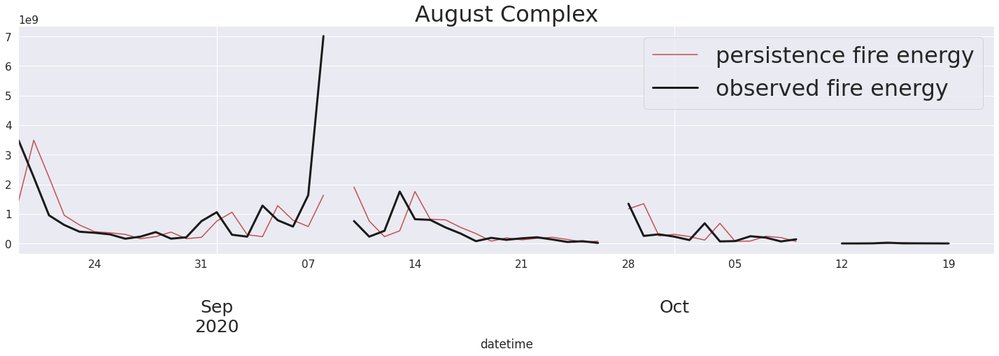

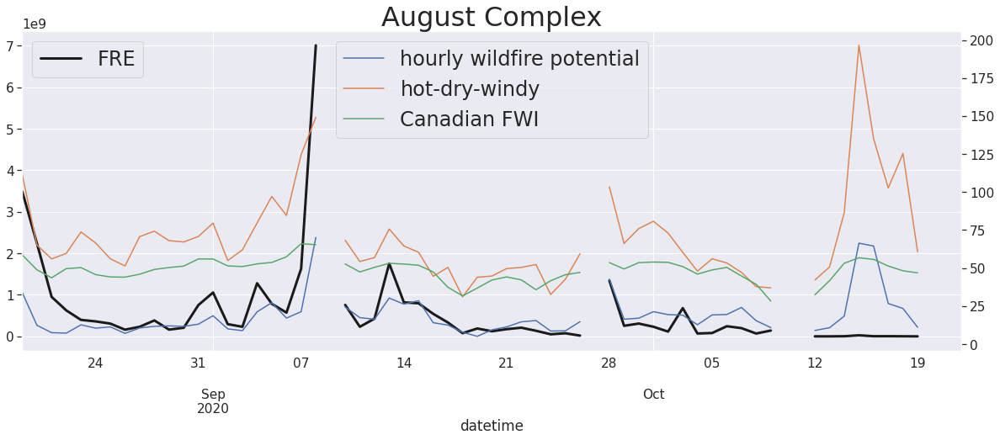

In [23]:
fire_names = ['August Complex']#,'Williams Flats', 'Dixie']

fire = data_test[data_test['irwinID']==test_irwin_ids[0]]
fire_plot = fire.set_index('datetime').resample('D').asfreq() #plot resampled to daily, will have gaps, ok!
    
#print(len(features_plot_timeseries)) 

fig, ax = plt.subplots(figsize=(25, 6))
fire_plot.plot(y=['FRE_1'],label=['persistence fire energy'], style='r-',alpha=1, ax=ax)
fire_plot.plot(y=['FRE'],label=['observed fire energy'],style=['k-'],linewidth=3, ax=ax)
#ax.set_yscale('log')
ax.legend(loc='upper right', fontsize=32)
plt.xticks(fontsize=25)
plt.title(fire_names[0],fontsize=32)
plt.show()

fig, ax = plt.subplots(figsize=(20, 7))
ax2=ax.twinx()
#fire_plot.plot(y=features_plot_timeseries[name], alpha=1, ax=ax)
fire_plot.plot(y=['hwp','hd0w0','IMERG.FINAL.v6_FWI'], 
               label=['hourly wildfire potential', 'hot-dry-windy','Canadian FWI'],alpha=1, ax=ax2)
fire_plot.plot(y=['FRE'],style=['k-'],linewidth=3, ax=ax)
#ax.set_yscale('log')
ax.legend(loc='upper left', fontsize=24)
#ax2.set_yscale('log')
ax2.legend(loc='upper center', fontsize=24)
ax2.grid(False)

plt.title(fire_names[0], fontsize=32)
plt.show()

In [24]:
data_train_1921['obs_cat'] = pd.cut(data_train_1921['Log_Scaling_Factor'].values, 
                                            bins=[-10, -.18, .3, 10],
                                            labels=['decrease','no_change','increase'])

data_test_2020['obs_cat'] = pd.cut(data_test_2020['Log_Scaling_Factor'].values, 
                                            bins=[-10, -.18, .3, 10],
                                            labels=['decrease','no_change','increase'])
print(len(data_train_1921))
print(str(len(data_train_1921[data_train_1921['obs_cat']=='decrease'])) + ' decreases')
print(str(len(data_train_1921[data_train_1921['obs_cat']=='no_change'])) + ' slight changes')
print(str(len(data_train_1921[data_train_1921['obs_cat']=='increase'])) + ' increases')

1296
466 decreases
450 slight changes
380 increases


1472
1472
1472
DOING PERSISTENCE


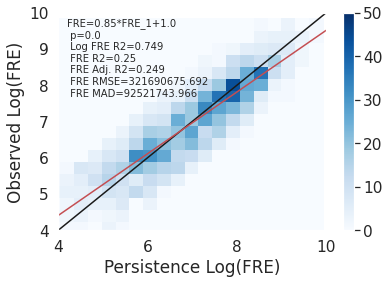

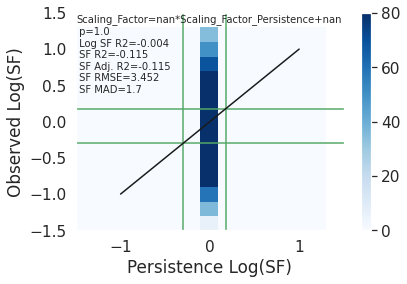

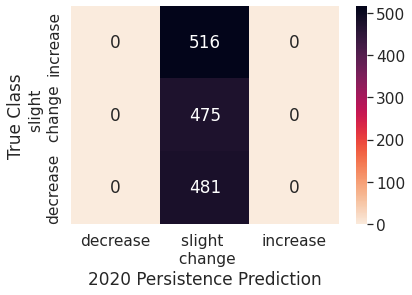

              precision    recall  f1-score   support

    decrease       0.00      0.00      0.00       481
    increase       0.00      0.00      0.00       516
   no_change       0.32      1.00      0.49       475

    accuracy                           0.32      1472
   macro avg       0.11      0.33      0.16      1472
weighted avg       0.10      0.32      0.16      1472

persistence


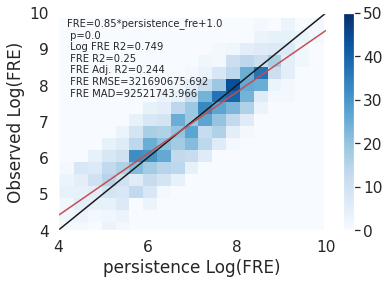

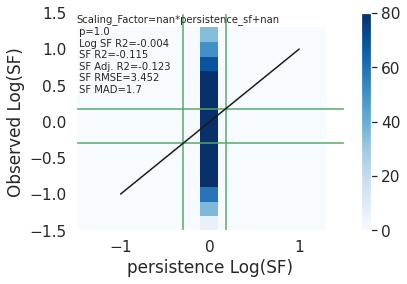

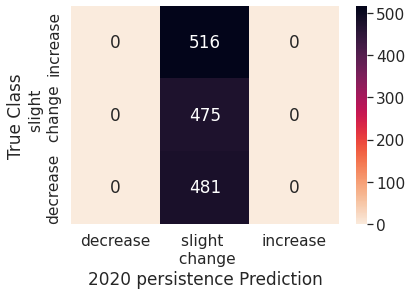

              precision    recall  f1-score   support

    decrease       0.00      0.00      0.00       481
    increase       0.00      0.00      0.00       516
   no_change       0.32      1.00      0.49       475

    accuracy                           0.32      1472
   macro avg       0.11      0.33      0.16      1472
weighted avg       0.10      0.32      0.16      1472

dwind_speed_gridmet


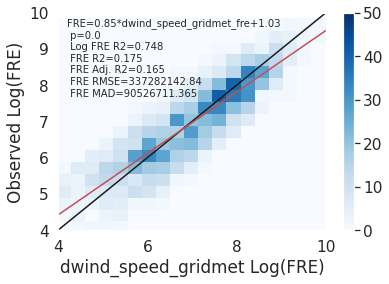

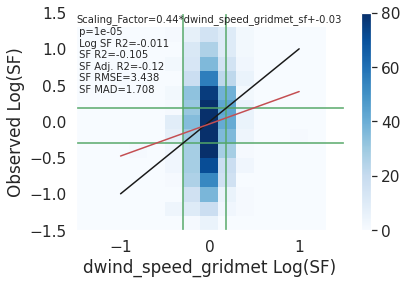

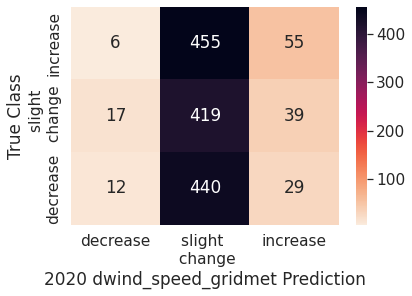

              precision    recall  f1-score   support

    decrease       0.34      0.02      0.05       481
    increase       0.45      0.11      0.17       516
   no_change       0.32      0.88      0.47       475

    accuracy                           0.33      1472
   macro avg       0.37      0.34      0.23      1472
weighted avg       0.37      0.33      0.23      1472

dvpd_gridmet


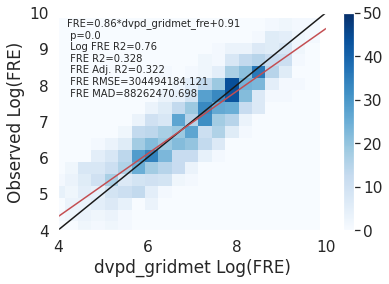

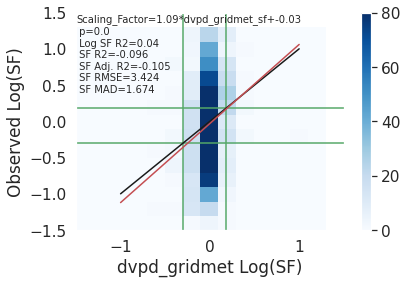

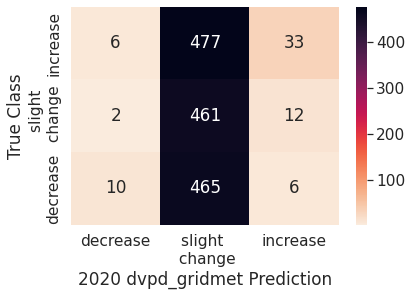

              precision    recall  f1-score   support

    decrease       0.56      0.02      0.04       481
    increase       0.65      0.06      0.12       516
   no_change       0.33      0.97      0.49       475

    accuracy                           0.34      1472
   macro avg       0.51      0.35      0.22      1472
weighted avg       0.51      0.34      0.21      1472

dwind_speed_hrrrmet


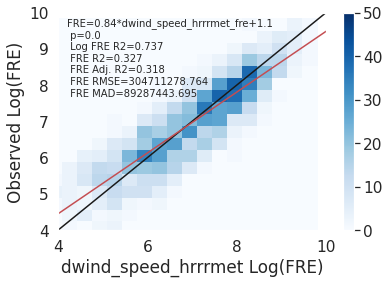

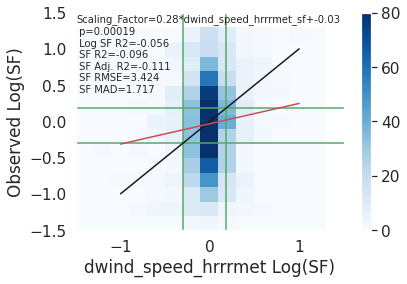

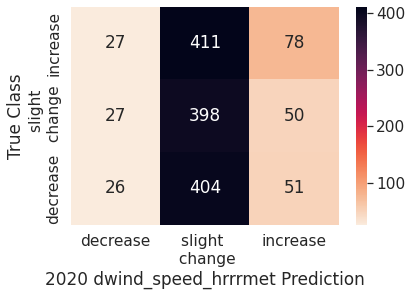

              precision    recall  f1-score   support

    decrease       0.33      0.05      0.09       481
    increase       0.44      0.15      0.22       516
   no_change       0.33      0.84      0.47       475

    accuracy                           0.34      1472
   macro avg       0.36      0.35      0.26      1472
weighted avg       0.36      0.34      0.26      1472

dvpd_hrrrmet


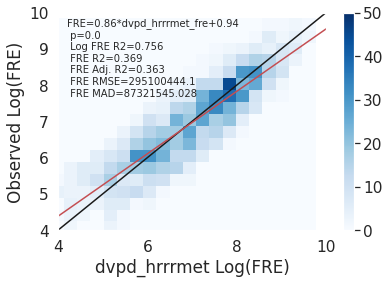

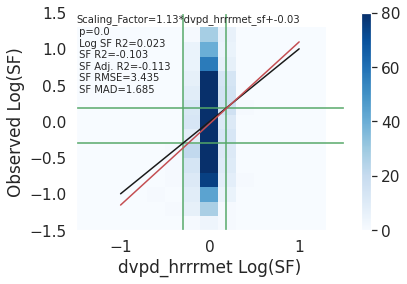

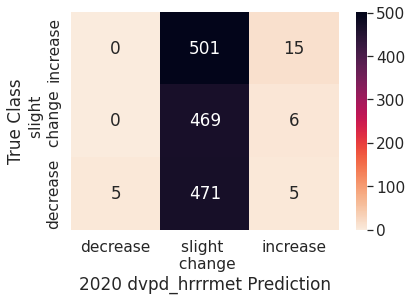

              precision    recall  f1-score   support

    decrease       1.00      0.01      0.02       481
    increase       0.58      0.03      0.06       516
   no_change       0.33      0.99      0.49       475

    accuracy                           0.33      1472
   macro avg       0.63      0.34      0.19      1472
weighted avg       0.63      0.33      0.18      1472

dmax_air_temperature


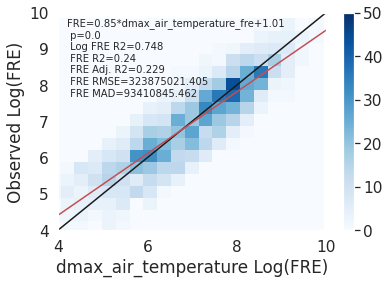

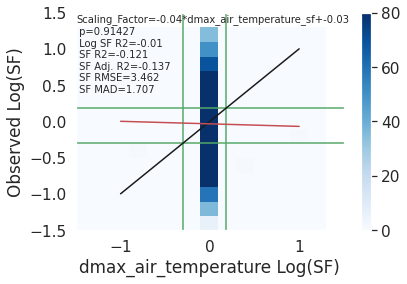

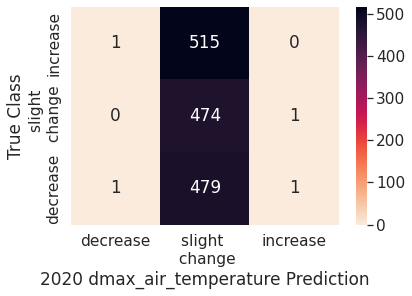

              precision    recall  f1-score   support

    decrease       0.50      0.00      0.00       481
    increase       0.00      0.00      0.00       516
   no_change       0.32      1.00      0.49       475

    accuracy                           0.32      1472
   macro avg       0.27      0.33      0.16      1472
weighted avg       0.27      0.32      0.16      1472

dhwp


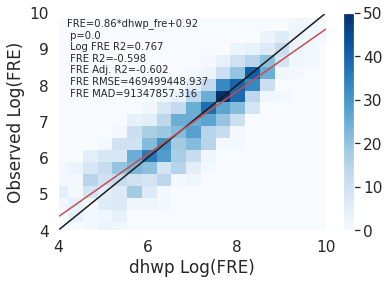

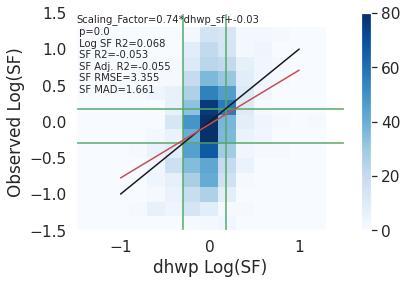

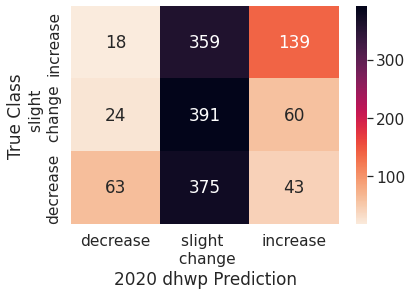

              precision    recall  f1-score   support

    decrease       0.60      0.13      0.22       481
    increase       0.57      0.27      0.37       516
   no_change       0.35      0.82      0.49       475

    accuracy                           0.40      1472
   macro avg       0.51      0.41      0.36      1472
weighted avg       0.51      0.40      0.36      1472

dhd0w0


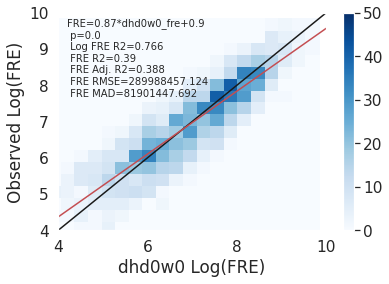

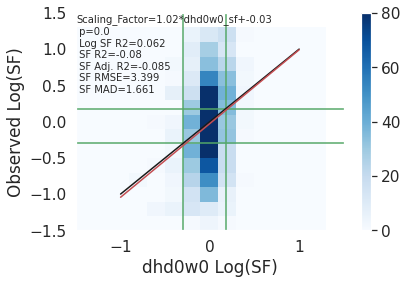

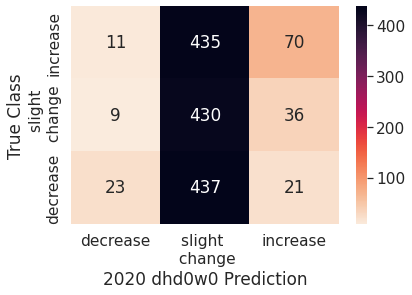

              precision    recall  f1-score   support

    decrease       0.53      0.05      0.09       481
    increase       0.55      0.14      0.22       516
   no_change       0.33      0.91      0.48       475

    accuracy                           0.36      1472
   macro avg       0.47      0.36      0.26      1472
weighted avg       0.47      0.36      0.26      1472

dhd1w0


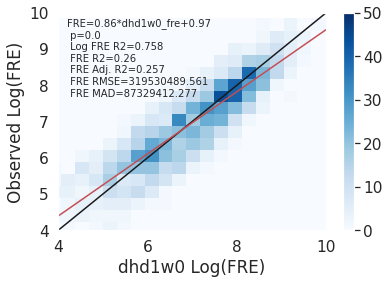

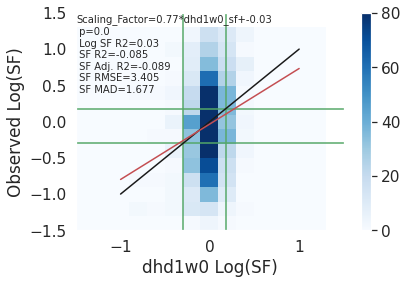

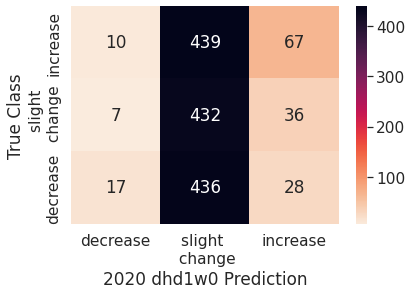

              precision    recall  f1-score   support

    decrease       0.50      0.04      0.07       481
    increase       0.51      0.13      0.21       516
   no_change       0.33      0.91      0.48       475

    accuracy                           0.35      1472
   macro avg       0.45      0.36      0.25      1472
weighted avg       0.45      0.35      0.25      1472

dhd2w0


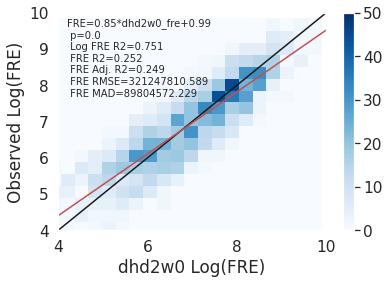

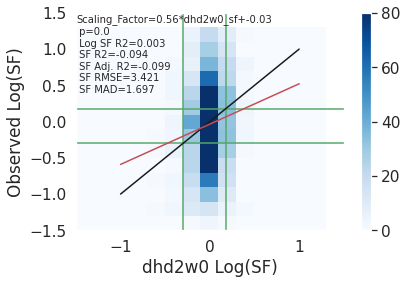

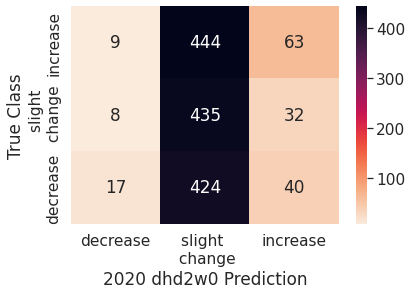

              precision    recall  f1-score   support

    decrease       0.50      0.04      0.07       481
    increase       0.47      0.12      0.19       516
   no_change       0.33      0.92      0.49       475

    accuracy                           0.35      1472
   macro avg       0.43      0.36      0.25      1472
weighted avg       0.43      0.35      0.25      1472

dhd3w0


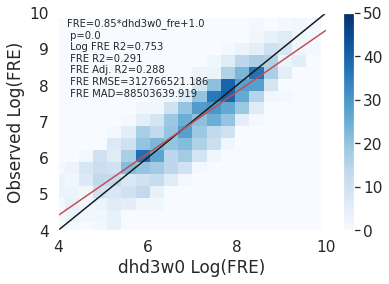

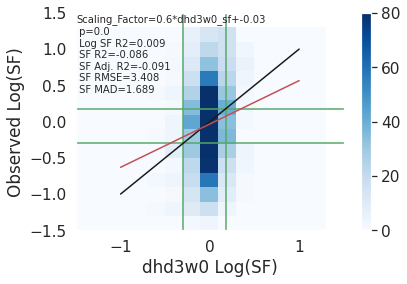

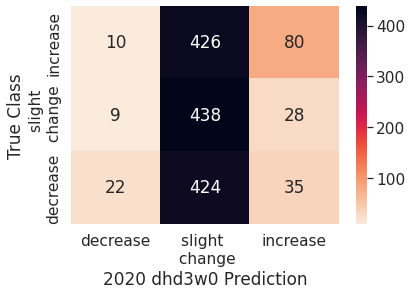

              precision    recall  f1-score   support

    decrease       0.54      0.05      0.08       481
    increase       0.56      0.16      0.24       516
   no_change       0.34      0.92      0.50       475

    accuracy                           0.37      1472
   macro avg       0.48      0.37      0.27      1472
weighted avg       0.48      0.37      0.27      1472

dIMERG.FINAL.v6_FWI


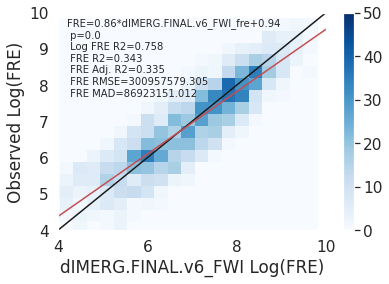

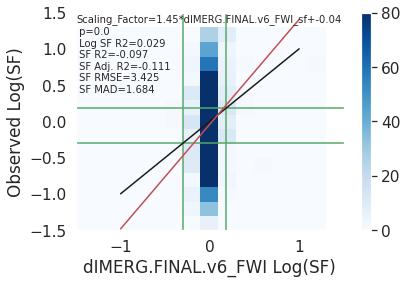

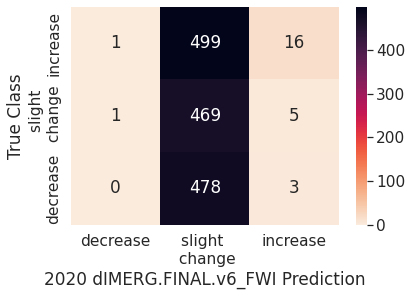

              precision    recall  f1-score   support

    decrease       0.00      0.00      0.00       481
    increase       0.67      0.03      0.06       516
   no_change       0.32      0.99      0.49       475

    accuracy                           0.33      1472
   macro avg       0.33      0.34      0.18      1472
weighted avg       0.34      0.33      0.18      1472

dburning_index_g


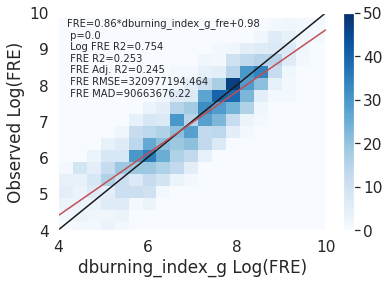

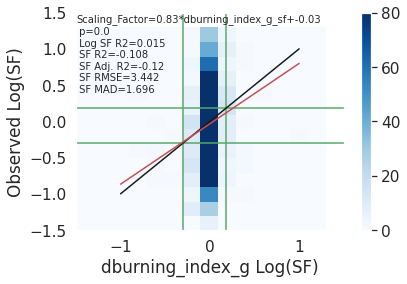

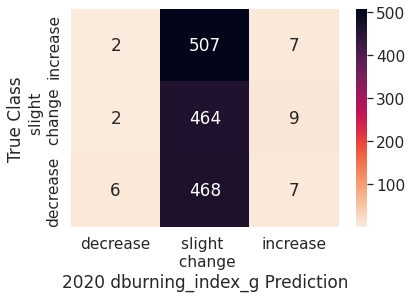

              precision    recall  f1-score   support

    decrease       0.60      0.01      0.02       481
    increase       0.30      0.01      0.03       516
   no_change       0.32      0.98      0.48       475

    accuracy                           0.32      1472
   macro avg       0.41      0.33      0.18      1472
weighted avg       0.41      0.32      0.17      1472



In [29]:
#PERSISTENCE AND SCALED METHODS

scaled_methods = ['persistence','dwind_speed_gridmet','dvpd_gridmet','dwind_speed_hrrrmet','dvpd_hrrrmet',
                  'dmax_air_temperature',
                  'dhwp','dhd0w0','dhd1w0', 'dhd2w0', 'dhd3w0', 'dIMERG.FINAL.v6_FWI','dburning_index_g'] 

scaled_methods_plot =['dwind_speed_hrrrmet','dvpd_gridmet', 'dvpd_hrrrmet','dhwp','dhd1w0','dIMERG.FINAL.v6_FWI','dburning_index_g']
thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 0.5

data_test_2020['obs_cat'] = pd.cut(data_test_2020['Log_Scaling_Factor'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
data_test_2020['persistence_cat'] = 'no_change'

df_error_metrics_scaled = pd.DataFrame(index=scaled_methods, 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',
                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])
#do the plottint
#drop the nans, these will show up in the scaled methods

data_test_2020= data_test_2020.iloc[np.where((data_test_2020['dhwp']<21.4)&(data_test_2020['dhwp']>0.04)&
                                            (data_test_2020['dhd0w0']<21.4)&(data_test_2020['dhd0w0']>0.04)&
                                            (data_test_2020['dhd1w0']<21.4)&(data_test_2020['dhd1w0']>0.04)&
                                            (data_test_2020['dhd2w0']<21.4)&(data_test_2020['dhd2w0']>0.04)&
                                            (data_test_2020['dhd3w0']<21.4)&(data_test_2020['dhd3w0']>0.04)&
                                            (data_test_2020['dwind_speed_gridmet']<21.4)&(data_test_2020['dwind_speed_gridmet']>0.04)&
                                            (data_test_2020['dvpd_gridmet']<21.4)&(data_test_2020['dvpd_gridmet']>0.04)&
                                            (data_test_2020['dwind_speed_hrrrmet']<21.4)&(data_test_2020['dwind_speed_hrrrmet']>0.04)&
                                            (data_test_2020['dvpd_hrrrmet']<21.4)&(data_test_2020['dvpd_hrrrmet']>0.04)&
                                            (data_test_2020['dIMERG.FINAL.v6_FWI']<21.4)&(data_test_2020['dIMERG.FINAL.v6_FWI']>0.04)&
                                            (data_test_2020['dIMERG.FINAL.v6_BUI']<21.4)&(data_test_2020['dIMERG.FINAL.v6_BUI']>0.04)&
                                            (data_test_2020['dburning_index_g']<21.4)&(data_test_2020['dburning_index_g']>0.04)&
                                            (data_test_2020['denergy_release_component-g']<21.4)&(data_test_2020['denergy_release_component-g']>0.04))]
print(len(data_test_2020))

#do the calculations
for ii in range(len(scaled_methods)):
    #print(scaled_methods[ii])
    #make predictions for all of the holdout year (2020)
    data_test_2020[scaled_methods[ii]+'_logsf'] = np.log10(data_test_2020[scaled_methods[ii]])
    data_test_2020[scaled_methods[ii]+'_sf'] = data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_fre'] = data_test_2020['FRE_1']*data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_logfre'] = np.log10(data_test_2020[scaled_methods[ii]+'_fre'])
    data_test_2020[scaled_methods[ii]+'_cat'] = pd.cut(data_test_2020[scaled_methods[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
#print(data_test_2020.columns.values)    
data_test_2020.replace([np.inf, -np.inf], np.nan, inplace=True)
print(len(data_test_2020))
data_test_2020=data_test_2020.dropna(how='any')
print(len(data_test_2020))


#get the error metrics
for ii in range(len(scaled_methods)):
    if scaled_methods[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_fre = summarize_error(data_test_2020,'FRE', 'FRE_1', ['persistence'])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'log_FRE_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_fre = summarize_error(data_test_2020,'FRE', scaled_methods[ii]+'_fre',[scaled_methods[ii]])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', scaled_methods[ii]+'_logfre',[scaled_methods[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', scaled_methods[ii]+'_sf',[scaled_methods[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', scaled_methods[ii]+'_logsf',[scaled_methods[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020[scaled_methods[ii]+'_cat'], output_dict=True))
    
    df_error_metrics_scaled.loc[scaled_methods[ii],['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
    df_error_metrics_scaled.loc[scaled_methods[ii],['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
    df_error_metrics_scaled.loc[scaled_methods[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics_scaled.loc[scaled_methods[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics_scaled.loc[scaled_methods[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics_scaled.loc[scaled_methods[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics_scaled.loc[scaled_methods[ii], 'accuracy'] = cr.loc['precision', 'accuracy']
#persistence

df_error_metrics_scaled['percent_change_FRE_RMSE'] = (df_error_metrics_scaled.loc['persistence','FRE_RMSE']-df_error_metrics_scaled['FRE_RMSE'])/df_error_metrics_scaled.loc['persistence','FRE_RMSE']
df_error_metrics_scaled['percent_change_FRE_MAD'] = (df_error_metrics_scaled.loc['persistence','FRE_MAD']-df_error_metrics_scaled['FRE_MAD'])/df_error_metrics_scaled.loc['persistence','FRE_MAD']


df_error_metrics_scaled['percent_change_SF_RMSE'] = (df_error_metrics_scaled.loc['persistence','SF_RMSE']-df_error_metrics_scaled['SF_RMSE'])/df_error_metrics_scaled.loc['persistence','SF_RMSE']
df_error_metrics_scaled['percent_change_SF_MAD'] = (df_error_metrics_scaled.loc['persistence','SF_MAD']-df_error_metrics_scaled['SF_MAD'])/df_error_metrics_scaled.loc['persistence','SF_MAD']

    

#persistence
frp_hist2d(data_test_2020, 'FRE_1', 'FRE','log_FRE_1', 'log_FRE', 'Blues', 0, 50,'Persistence Log(FRE)',['persistence'])
sf_hist2d(data_test_2020, 'Scaling_Factor_Persistence', 'Scaling_Factor','Log_Scaling_Factor_Persistence', 'Log_Scaling_Factor', 'Blues', 0, 80,thresh_inc, thresh_dec,'Persistence Log(SF)',['persistence'])
plot_category_heatmap(data_test_2020, 'obs_cat', 'persistence_cat', '2020 Persistence Prediction') 



for ii in range(len(scaled_methods)):
    print(scaled_methods[ii])
    #all of 2020, trained on all features 19/21
    frp_hist2d(data_test_2020, scaled_methods[ii]+'_fre', 'FRE',scaled_methods[ii]+'_logfre', 'log_FRE', 'Blues', 0, 50,scaled_methods[ii]+' Log(FRE)',scaled_methods[ii])
    sf_hist2d(data_test_2020, scaled_methods[ii]+'_sf', 'Scaling_Factor',scaled_methods[ii]+'_logsf', 'Log_Scaling_Factor', 'Blues', 0, 80,thresh_inc, thresh_dec,scaled_methods[ii]+' Log(SF)',scaled_methods[ii])
    plot_category_heatmap(data_test_2020, 'obs_cat', scaled_methods[ii]+'_cat', '2020 '+scaled_methods[ii]+' Prediction')  


## Add the Eureqa model to the output (only HRRR one is usable since we switched to FRE)

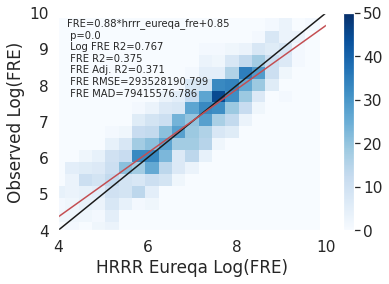

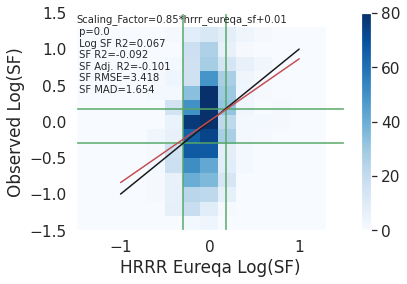

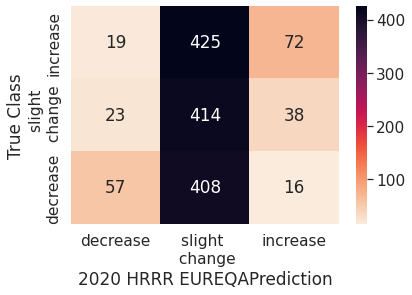

              precision    recall  f1-score   support

    decrease       0.58      0.12      0.20       481
    increase       0.57      0.14      0.22       516
   no_change       0.33      0.87      0.48       475

    accuracy                           0.37      1472
   macro avg       0.49      0.38      0.30      1472
weighted avg       0.50      0.37      0.30      1472



In [30]:
data_test_2020['hrrr_eureqa_logsf'] = (0.4239*data_test_2020['dhd0w0']) +(0.0614*data_test_2020['dhwp']) + \
                                        (0.0330*data_test_2020['chi'])- 0.5154 - (0.0025*data_test_2020['hd2w0']) - \
                                        (0.1739*data_test_2020['dhd3w0'])


data_test_2020['hrrr_eureqa_sf'] = 10**(data_test_2020['hrrr_eureqa_logsf'])
data_test_2020['hrrr_eureqa_fre'] = data_test_2020['hrrr_eureqa_sf']*data_test_2020['FRE_1']
data_test_2020['hrrr_eureqa_logfre'] = np.log10(data_test_2020['hrrr_eureqa_fre'])
data_test_2020['hrrr_eureqa_cat'] = pd.cut(data_test_2020['hrrr_eureqa_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
df_error_metrics_eureqa = pd.DataFrame(index=['hrrr_eureqa'], 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',
                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])

frp_hist2d(data_test_2020, 'hrrr_eureqa_fre', 
           'FRE','hrrr_eureqa_logfre', 'log_FRE', 
           'Blues', 0, 50,'HRRR Eureqa Log(FRE)','hrrr_eureqa')
sf_hist2d(data_test_2020, 'hrrr_eureqa_sf', 'Scaling_Factor','hrrr_eureqa_logsf', 'Log_Scaling_Factor', 'Blues', 0, 80,thresh_inc, thresh_dec,
          'HRRR Eureqa Log(SF)','hrrr_eureqa')
plot_category_heatmap(data_test_2020, 'obs_cat', 'hrrr_eureqa_cat', '2020 HRRR EUREQAPrediction')  

errors_fre = summarize_error(data_test_2020,'FRE', 'hrrr_eureqa_fre',['hrrr_eureqa'])
errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'hrrr_eureqa_logfre',['hrrr_eureqa'])
errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'hrrr_eureqa_sf',['hrrr_eureqa'])
errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'hrrr_eureqa_logsf',['hrrr_eureqa'])
cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['hrrr_eureqa_cat'], output_dict=True))
    

df_error_metrics_eureqa.loc['hrrr_eureqa',['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
df_error_metrics_eureqa.loc['hrrr_eureqa',['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
df_error_metrics_eureqa.loc['hrrr_eureqa',['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
df_error_metrics_eureqa.loc['hrrr_eureqa',['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
df_error_metrics_eureqa.loc['hrrr_eureqa', 'decrease_precision'] = cr.loc['precision', 'decrease']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'decrease_recall'] = cr.loc['recall', 'decrease']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'decrease_f1'] = cr.loc['f1-score', 'decrease']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'increase_precision'] = cr.loc['precision', 'increase']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'increase_recall'] = cr.loc['recall', 'increase']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'increase_f1'] = cr.loc['f1-score', 'increase']

df_error_metrics_eureqa.loc['hrrr_eureqa', 'no_change_precision'] = cr.loc['precision', 'no_change']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'no_change_recall'] = cr.loc['recall', 'no_change']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'no_change_f1'] = cr.loc['f1-score', 'no_change']
df_error_metrics_eureqa.loc['hrrr_eureqa', 'accuracy'] = cr.loc['precision', 'accuracy']

#persistence

df_error_metrics_eureqa['percent_change_FRE_RMSE'] = (df_error_metrics_scaled.loc['persistence','FRE_RMSE']-df_error_metrics_eureqa['FRE_RMSE'])/df_error_metrics_scaled.loc['persistence','FRE_RMSE']
df_error_metrics_eureqa['percent_change_FRE_MAD'] = (df_error_metrics_scaled.loc['persistence','FRE_MAD']-df_error_metrics_eureqa['FRE_MAD'])/df_error_metrics_scaled.loc['persistence','FRE_MAD']


df_error_metrics_eureqa['percent_change_SF_RMSE'] = (df_error_metrics_scaled.loc['persistence','SF_RMSE']-df_error_metrics_eureqa['SF_RMSE'])/df_error_metrics_scaled.loc['persistence','SF_RMSE']
df_error_metrics_eureqa['percent_change_SF_MAD'] = (df_error_metrics_scaled.loc['persistence','SF_MAD']-df_error_metrics_eureqa['SF_MAD'])/df_error_metrics_scaled.loc['persistence','SF_MAD']

    

In [31]:
features_by_category = {'raw_weather_gridmet':["vpd_gridmet","wind_speed_gridmet","dvpd_gridmet","dwind_speed_gridmet"],
                    'temperatures_gridmet':["max_air_temperature","min_air_temperature","temp_range"], 
                   'raw_weather_hrrr':["vpd_hrrrmet","wind_speed_hrrrmet","dvpd_hrrrmet","dwind_speed_hrrrmet"],
                   'heatwave':["days_in_high_heatwave","days_in_highlow_heatwave"],
                   'derived_weather_hwp': ["hwp","dhwp"],
                   'derived_weather_hdw': ["dhd0w0","dhd1w0", "dhd2w0", "dhd3w0","hd0w0", "hd1w0", "hd2w0", "hd3w0"],
                   'derived_weather_cffrds': [ "dIMERG.FINAL.v6_FWI","dIMERG.FINAL.v6_BUI", "IMERG.FINAL.v6_FWI","IMERG.FINAL.v6_BUI"],
                   'derived_weather_nfdrs':[ "dburning_index_g","denergy_release_component-g","burning_index_g","energy_release_component-g"],
                   'stability': ["PFT", "chi","dchi", "dPFT"],
                    'living_moisture':['FMCGLH2D'],
                    'thin_moisture': ['Blended_SM', 'FMCG2D', 'IMERG.FINAL.v6_FFMC'],
                    'mid_moisture':['IMERG.FINAL.v6_DMC', 'dead_fuel_moisture_100hr'],
                    'thick_moisture':['IMERG.FINAL.v6_DC','dead_fuel_moisture_1000hr'],
                   'pws':["PWS"],
                   'esi':["ESI"],
                   'loading': ["Low_N", "Moderate_N", "High_N", "VeryHigh_N", "Extreme_N"],
                   'terrain_slope': ["MEAN_SLOPE","STD_SLOPE"],
                   'terrain_elevation': ["MEAN_ELEV","STD_ELEV"],
                   'DOY': ['DOY'],
                   'containment': ["percent_contained_1"],
                   'total_personnel': ["personnel_1"],
                   'split_personnel': ["crew_personnel_1","engine_personnel_1","air_personnel_1","construction_personnel_1","overhead_personnel_1"],
                   'split_quantity': ["crew_quantity_1", "engine_quantity_1",  "air_quantity_1", "construction_quantity_1"],
                   'pop': ["POP_DENSITY"],
                   'structures': ["structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1"],
                   'persistence': ["FRE_1"]}
category_list = features_by_category.keys()


In [32]:
feature_subsets = {}

#all features
not_allowed = []
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

#no persistence
not_allowed = ['persistence']
feature_subsets['features_no_persistence'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])


#no weather
not_allowed = ['raw_weather_gridmet','temperature_gridmet','raw_weather_hrrr','heatwave','derived_weather_hwp','derived_weather_hdw',
                 'derived_weather_cffrds','derived_weather_nfdrs']
feature_subsets['features_no_surface_weather'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_raw_gridmet'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["vpd_gridmet","wind_speed_gridmet","dvpd_gridmet","dwind_speed_gridmet"])


feature_subsets['features_only_raw_hrrrmet'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["vpd_hrrrmet","wind_speed_hrrrmet","dvpd_hrrrmet","dwind_speed_hrrrmet"])
feature_subsets['features_only_hd0w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd0w0","dhd0w0"])
feature_subsets['features_only_hd1w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd1w0","dhd1w0"])
feature_subsets['features_only_hd2w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd2w0","dhd2w0"])
feature_subsets['features_only_hd3w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd3w0","dhd3w0"])
feature_subsets['features_only_hwp'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hwp","dhwp"])
feature_subsets['features_only_cffdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["dIMERG.FINAL.v6_FWI","dIMERG.FINAL.v6_BUI", "IMERG.FINAL.v6_FWI","IMERG.FINAL.v6_BUI"])
feature_subsets['features_only_nfdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [ "dburning_index_g","denergy_release_component-g","burning_index_g","energy_release_component-g"])
feature_subsets['features_only_heatwave'] = generate_sensitivity_list(features_by_category, 
                    [var for var in category_list if var not in not_allowed], 
                    ["days_in_high_heatwave","days_in_highlow_heatwave","max_air_temperature","min_air_temperature","temp_range"])

#no stability
not_allowed = ['stability']
feature_subsets['features_no_stability'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_pft'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['PFT','dPFT'])
feature_subsets['features_only_chi'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['chi','dchi'])


#no soil_moisture
not_allowed = ['soil_moisture'] #["Blended_SM", "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC"]
feature_subsets['features_no_soil_moisture'] = generate_sensitivity_list(features_by_category, 
                                        [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_smops'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["Blended_SM"])
feature_subsets['features_only_sm_cffdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [ "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC"])

#no fuel_moisture
not_allowed = ['fuel_moisture'] #["FMCGLH2D", "FMCG2D","dead_fuel_moisture_1000hr","dead_fuel_moisture_100hr"]
feature_subsets['features_no_fuel_moisture'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_fm_ncar'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["FMCGLH2D", "FMCG2D"])
feature_subsets['features_only_fm_nfdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["dead_fuel_moisture_1000hr","dead_fuel_moisture_100hr"])

#moisture as size
not_allowed=['living_moisture']
feature_subsets['features_no_livingm'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])
feature_subsets['features_only_ncar_living'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['FMCGLH2D'])
                                                                   

not_allowed=['thin_moisture']
feature_subsets['features_no_thinm'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])
# A REPEAT feature_subsets['features_only_smops'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['Blended_SM'])
feature_subsets['features_only_ffmc'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['IMERG.FINAL.v6_FFMC'])                          
feature_subsets['features_only_ncar_dead'] = generate_sensitivity_list(features_by_category,
                                    [var for var in category_list if var not in not_allowed], ['FMCG2D'])

not_allowed=['mid_moisture']
feature_subsets['features_no_midm'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])
feature_subsets['features_only_100hr'] = generate_sensitivity_list(features_by_category, 
                                    [var for var in category_list if var not in not_allowed], ['dead_fuel_moisture_100hr'])
feature_subsets['features_only_dmc'] = generate_sensitivity_list(features_by_category,
                                    [var for var in category_list if var not in not_allowed], ['IMERG.FINAL.v6_DMC'])

not_allowed=['thick_moisture']
feature_subsets['features_no_thickm'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])
feature_subsets['features_only_1000hr'] = generate_sensitivity_list(features_by_category, 
                                    [var for var in category_list if var not in not_allowed], ['dead_fuel_moisture_1000hr'])
feature_subsets['features_only_dc'] = generate_sensitivity_list(features_by_category,
                                    [var for var in category_list if var not in not_allowed], ['IMERG.FINAL.v6_DC'])

#no pws
not_allowed = ['pws']
feature_subsets['features_no_pws'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

#no esi
not_allowed = ['esi']
feature_subsets['features_no_esi'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

#no esi
not_allowed = ['loading']
feature_subsets['features_no_loading'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_LowN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['Low_N'])
feature_subsets['features_only_ModerateN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['Moderate_N'])
feature_subsets['features_only_HighN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['High_N'])
feature_subsets['features_only_VeryHighN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['VeryHigh_N'])
feature_subsets['features_only_ExtremeN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['Extreme_N'])

#no terrain
not_allowed = ['terrain_slope', 'terrain_elevation']
feature_subsets['features_no_terrain'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_slope'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["MEAN_SLOPE","STD_SLOPE"])
feature_subsets['features_only_elevation'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["MEAN_ELEV","STD_ELEV"])

#no DOY
not_allowed = ['DOY']
feature_subsets['features_no_doy'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# no human
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_no_human'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])
feature_subsets['features_only_crew'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["crew_personnel_1", "crew_quantity_1"])
feature_subsets['features_only_engine'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["engine_personnel_1", "engine_quantity_1"])
feature_subsets['features_only_air'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["air_personnel_1", "air_quantity_1"])
feature_subsets['features_only_construction'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["construction_personnel_1", "construction_quantity_1"])
feature_subsets['features_only_overhead'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["overhead_personnel_1"])




#print(feature_subsets)

#print(category_list)
#print(category_list.remove('raw_weather_gridmet'))

In [33]:
# Containment
not_allowed = ['total_personnel',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_only_containment'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# total personnel
not_allowed = ['containment',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_only_total_personnel'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# split personnel
not_allowed = ['containment','total_personnel',
                 'split_quantity','pop','structures']
feature_subsets['features_only_split_personnel'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# split quantity
not_allowed = ['containment','total_personnel',
                 'split_personnel','pop','structures']
feature_subsets['features_only_split_quantity']= generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# population
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','structures']
feature_subsets['features_only_population'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# structures
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','pop']
feature_subsets['features_only_structures'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# 72 hours out
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_only_72hr_structures'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['structures_threatened_72'])



features_new_all OOB R2 score is: 0.21990804355483062


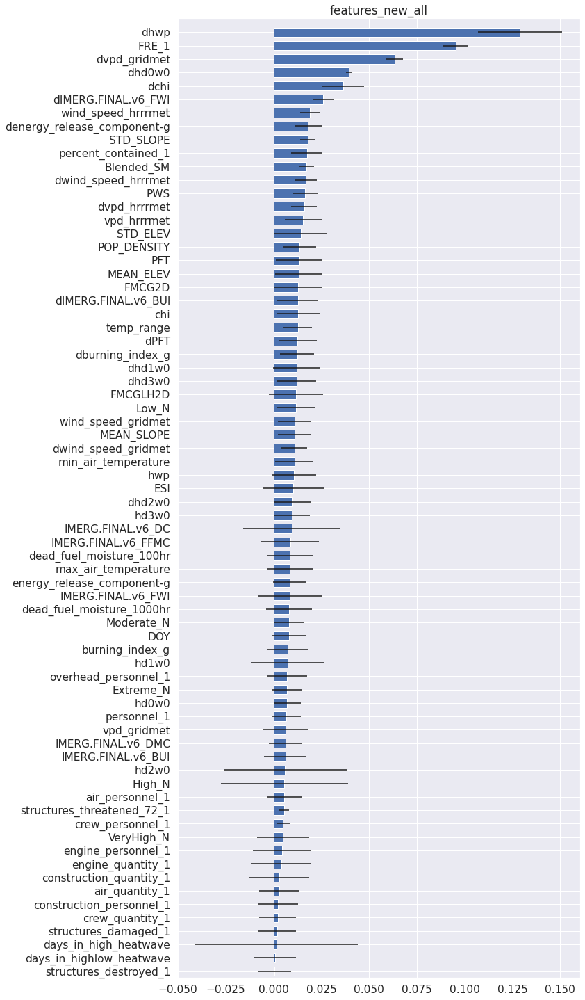

features_no_persistence OOB R2 score is: 0.1637473442452102
features_no_surface_weather OOB R2 score is: 0.14045182883134189
features_no_stability OOB R2 score is: 0.21820440031305666
features_no_soil_moisture OOB R2 score is: 0.21990804355483062
features_no_fuel_moisture OOB R2 score is: 0.21990804355483062
features_no_livingm OOB R2 score is: 0.22178445099664368
features_no_thinm OOB R2 score is: 0.22142084463590084
features_no_midm OOB R2 score is: 0.21860039596686465
features_no_thickm OOB R2 score is: 0.22473042289669332
features_no_pws OOB R2 score is: 0.22436730203513577
features_no_esi OOB R2 score is: 0.21923367883042366
features_no_loading OOB R2 score is: 0.23011741077008896
features_no_terrain OOB R2 score is: 0.2189610620953506
features_no_doy OOB R2 score is: 0.22008095631494973
features_no_human OOB R2 score is: 0.21278926868207249
features_only_pft OOB R2 score is: 0.21442781310393688
features_only_chi OOB R2 score is: 0.22169165113064415
features_only_raw_gridmet OOB R

In [35]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all','features_no_persistence', 'features_no_surface_weather',
                    'features_no_stability', 'features_no_soil_moisture', 'features_no_fuel_moisture',
                     'features_no_livingm', 'features_no_thinm','features_no_midm','features_no_thickm',
                    'features_no_pws', 'features_no_esi','features_no_loading', 'features_no_terrain', 'features_no_doy',
                    'features_no_human',
                    'features_only_pft', 'features_only_chi',
                    'features_only_raw_gridmet','features_only_raw_hrrrmet', 
                    'features_only_hd0w0','features_only_hd1w0',
                    'features_only_hd2w0','features_only_hd3w0', 'features_only_hwp',
                    'features_only_cffdrs', 'features_only_nfdrs', 'features_only_heatwave',
                     
                     'features_only_ncar_living', 'features_only_smops',
                     'features_only_ffmc', 'features_only_ncar_dead',
                     'features_only_dmc', 'features_only_100hr',
                     'features_only_dc', 'features_only_1000hr',
                     
                     'features_only_LowN','features_only_ModerateN','features_only_HighN',
                     'features_only_VeryHighN', 'features_only_ExtremeN',
                     'features_only_slope', 'features_only_elevation',
                     'features_only_containment','features_only_total_personnel',
                     'features_only_split_personnel','features_only_split_quantity',
                     'features_only_population','features_only_structures',
                     'features_only_72hr_structures',
                     'features_only_crew', 'features_only_engine','features_only_air', 
                     'features_only_construction','features_only_overhead']


df_error_metrics_rf = pd.DataFrame(index=feature_set_names, 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',

                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])
#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    if feature_set_names[ii]=='features_new_all':
        plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_fre'] = data_test_2020['FRE_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfre'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_fre'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_fre = summarize_error(data_test_2020,'FRE', 'FRE_1', ['persistence'])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'log_FRE_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_fre = summarize_error(data_test_2020,'FRE', 'rf_'+feature_set_names[ii]+'_fre',feature_subsets[feature_set_names[ii]])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'rf_'+feature_set_names[ii]+'_logfre',feature_subsets[feature_set_names[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf',feature_subsets[feature_set_names[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_logsf',feature_subsets[feature_set_names[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics_rf.loc[feature_set_names[ii],['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
    df_error_metrics_rf.loc[feature_set_names[ii],['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
    df_error_metrics_rf.loc[feature_set_names[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics_rf.loc[feature_set_names[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']
#persistence

df_error_metrics_rf['percent_change_FRE_RMSE'] = (df_error_metrics_rf.loc['persistence','FRE_RMSE']-df_error_metrics_rf['FRE_RMSE'])/df_error_metrics_rf.loc['persistence','FRE_RMSE']
df_error_metrics_rf['percent_change_FRE_MAD'] = (df_error_metrics_rf.loc['persistence','FRE_MAD']-df_error_metrics_rf['FRE_MAD'])/df_error_metrics_rf.loc['persistence','FRE_MAD']


df_error_metrics_rf['percent_change_SF_RMSE'] = (df_error_metrics_rf.loc['persistence','SF_RMSE']-df_error_metrics_rf['SF_RMSE'])/df_error_metrics_rf.loc['persistence','SF_RMSE']
df_error_metrics_rf['percent_change_SF_MAD'] = (df_error_metrics_rf.loc['persistence','SF_MAD']-df_error_metrics_rf['SF_MAD'])/df_error_metrics_rf.loc['persistence','SF_MAD']

    

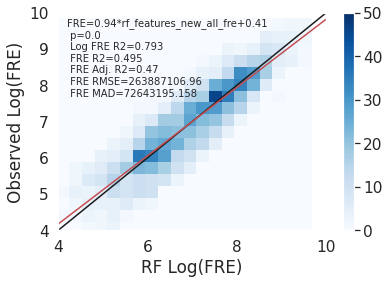

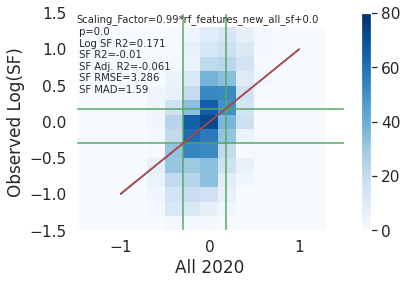

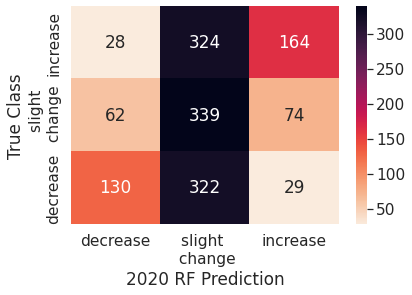

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.61      0.32      0.42       516
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



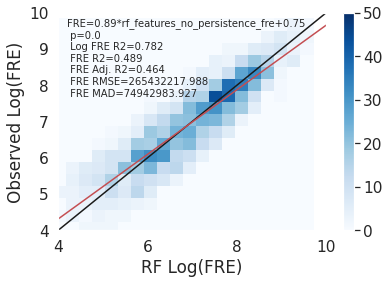

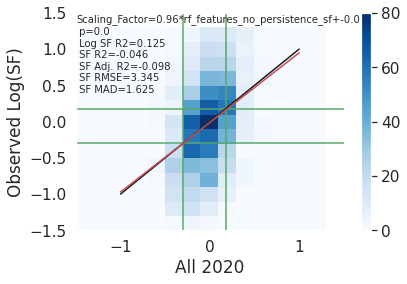

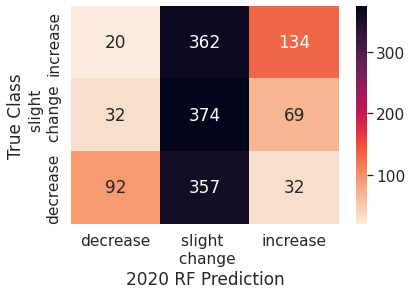

              precision    recall  f1-score   support

    decrease       0.64      0.19      0.29       481
    increase       0.57      0.26      0.36       516
   no_change       0.34      0.79      0.48       475

    accuracy                           0.41      1472
   macro avg       0.52      0.41      0.38      1472
weighted avg       0.52      0.41      0.38      1472



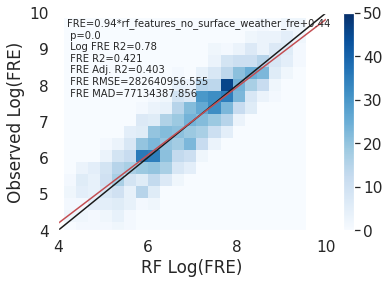

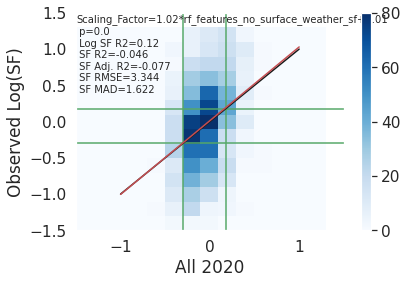

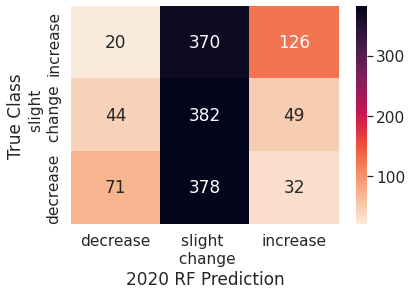

              precision    recall  f1-score   support

    decrease       0.53      0.15      0.23       481
    increase       0.61      0.24      0.35       516
   no_change       0.34      0.80      0.48       475

    accuracy                           0.39      1472
   macro avg       0.49      0.40      0.35      1472
weighted avg       0.49      0.39      0.35      1472



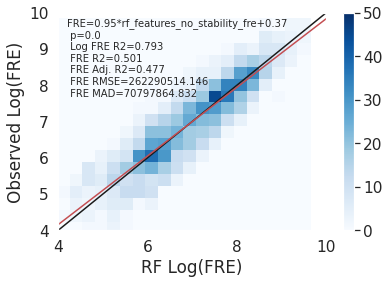

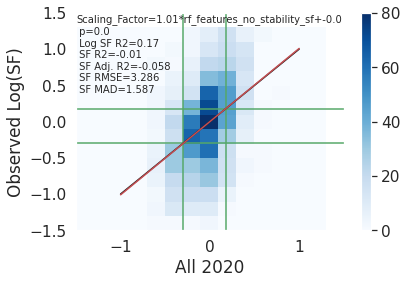

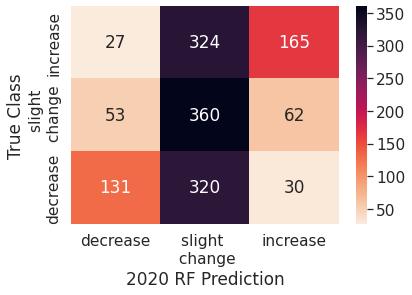

              precision    recall  f1-score   support

    decrease       0.62      0.27      0.38       481
    increase       0.64      0.32      0.43       516
   no_change       0.36      0.76      0.49       475

    accuracy                           0.45      1472
   macro avg       0.54      0.45      0.43      1472
weighted avg       0.54      0.45      0.43      1472



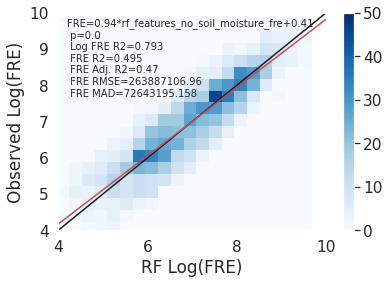

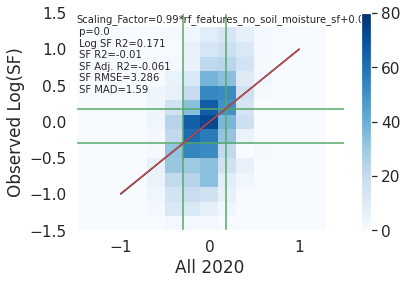

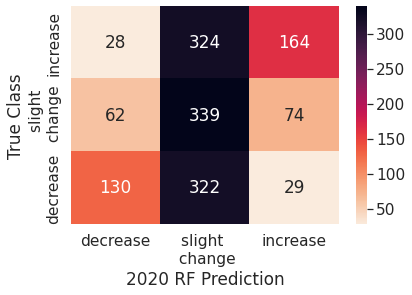

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.61      0.32      0.42       516
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



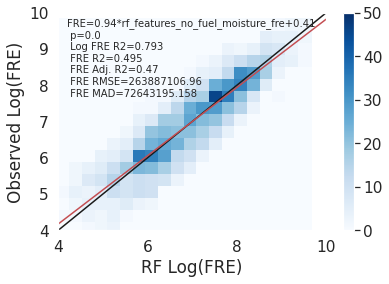

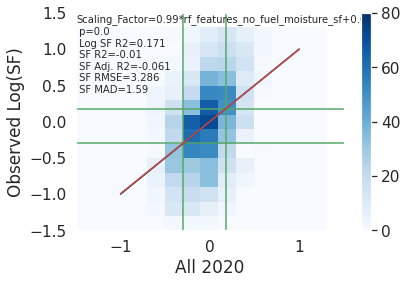

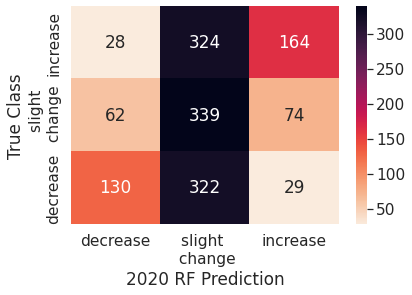

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.61      0.32      0.42       516
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



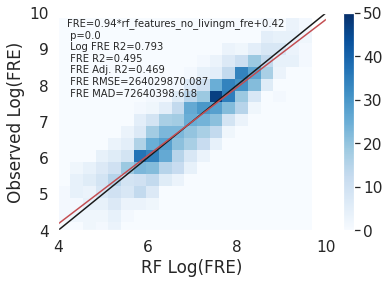

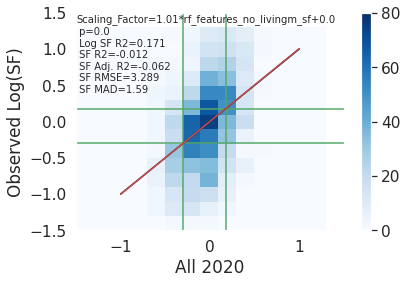

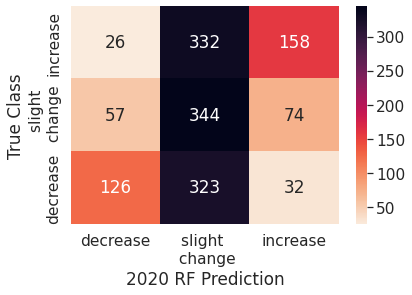

              precision    recall  f1-score   support

    decrease       0.60      0.26      0.37       481
    increase       0.60      0.31      0.41       516
   no_change       0.34      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.41      1472
weighted avg       0.52      0.43      0.41      1472



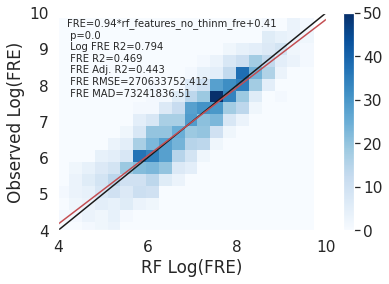

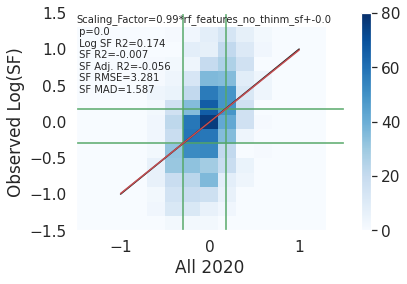

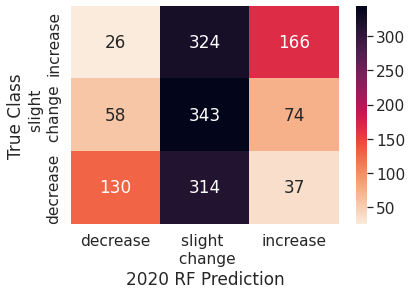

              precision    recall  f1-score   support

    decrease       0.61      0.27      0.37       481
    increase       0.60      0.32      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



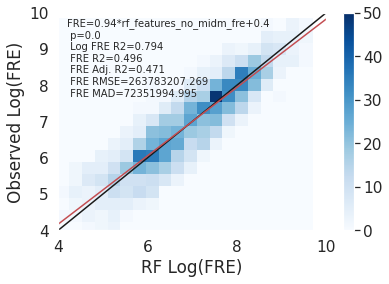

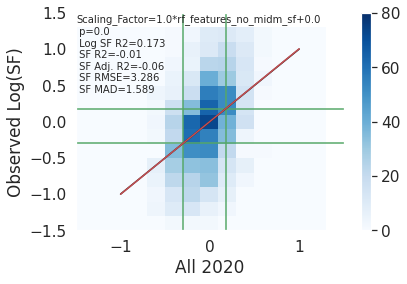

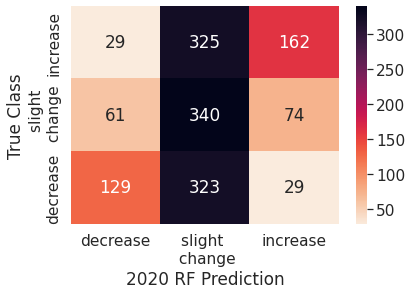

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.61      0.31      0.41       516
   no_change       0.34      0.72      0.46       475

    accuracy                           0.43      1472
   macro avg       0.51      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



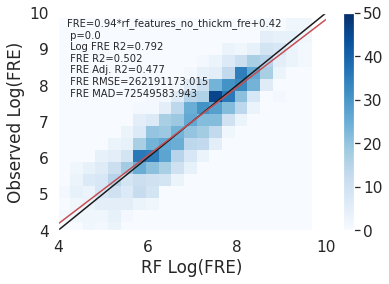

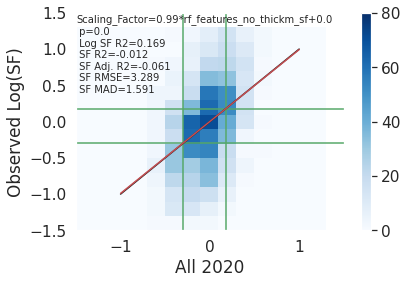

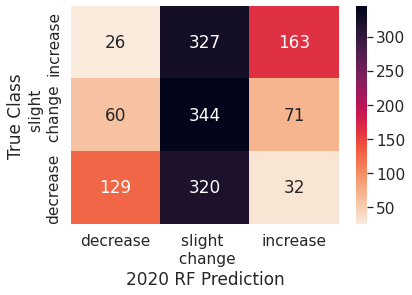

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.61      0.32      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



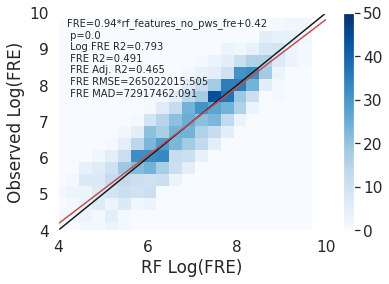

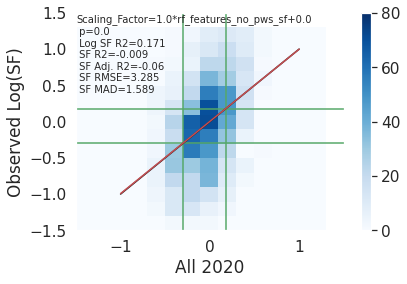

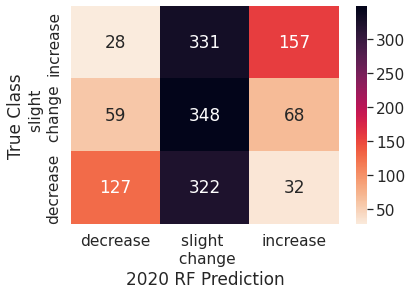

              precision    recall  f1-score   support

    decrease       0.59      0.26      0.37       481
    increase       0.61      0.30      0.41       516
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.41      1472
weighted avg       0.52      0.43      0.41      1472



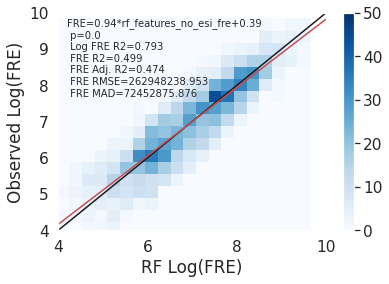

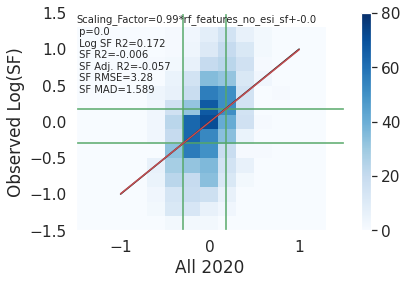

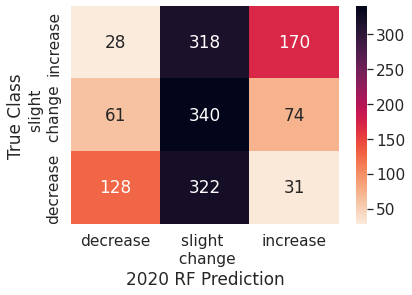

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.62      0.33      0.43       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



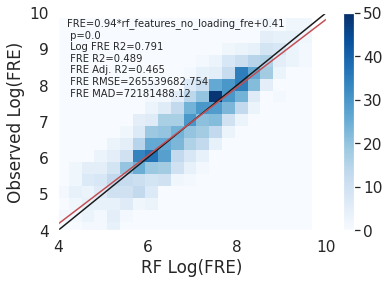

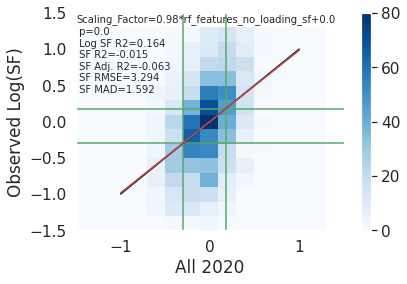

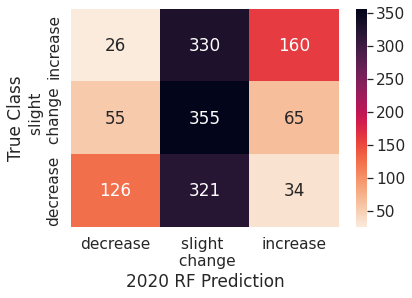

              precision    recall  f1-score   support

    decrease       0.61      0.26      0.37       481
    increase       0.62      0.31      0.41       516
   no_change       0.35      0.75      0.48       475

    accuracy                           0.44      1472
   macro avg       0.53      0.44      0.42      1472
weighted avg       0.53      0.44      0.42      1472



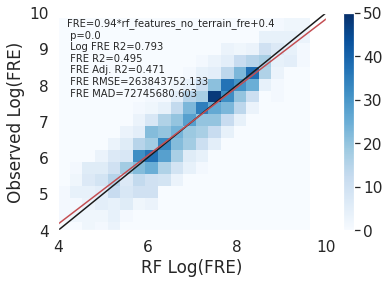

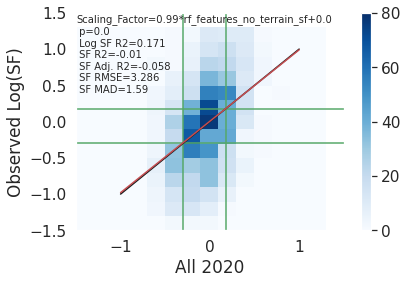

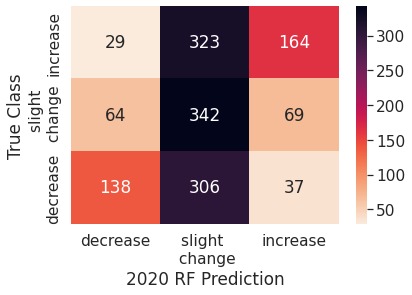

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       481
    increase       0.61      0.32      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.43      1472
weighted avg       0.52      0.44      0.43      1472



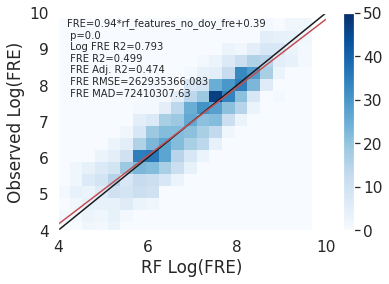

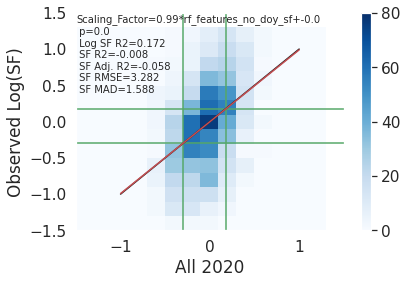

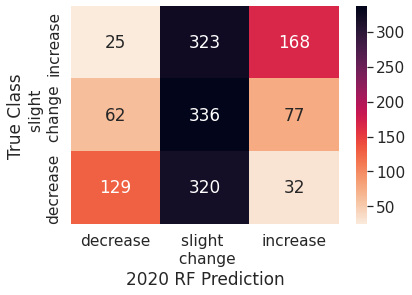

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.61      0.33      0.42       516
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



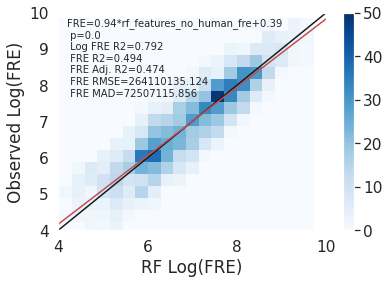

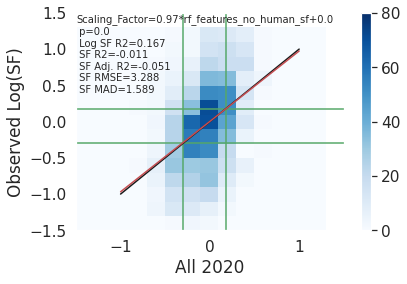

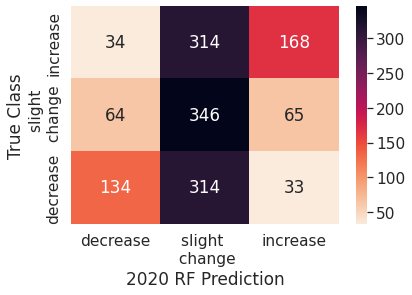

              precision    recall  f1-score   support

    decrease       0.58      0.28      0.38       481
    increase       0.63      0.33      0.43       516
   no_change       0.36      0.73      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.43      1472
weighted avg       0.52      0.44      0.43      1472



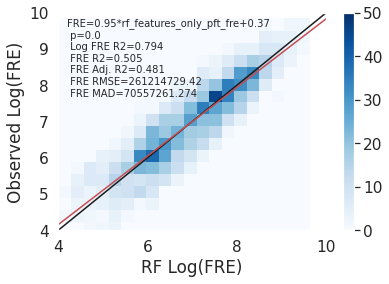

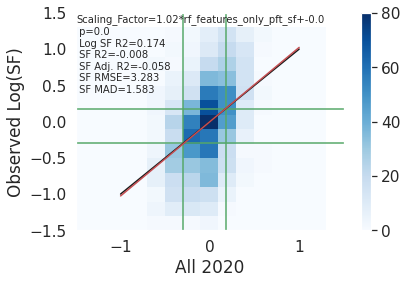

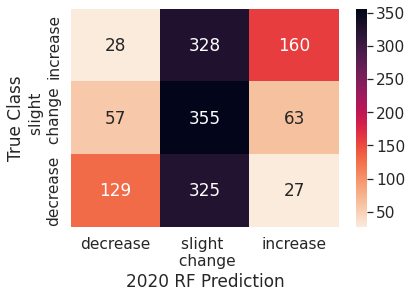

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.64      0.31      0.42       516
   no_change       0.35      0.75      0.48       475

    accuracy                           0.44      1472
   macro avg       0.53      0.44      0.42      1472
weighted avg       0.53      0.44      0.42      1472



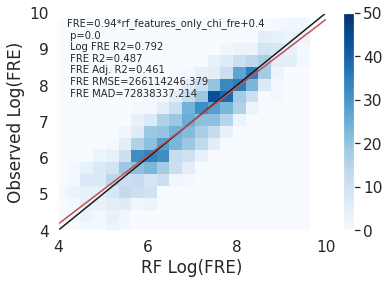

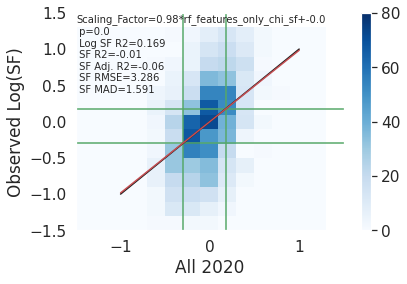

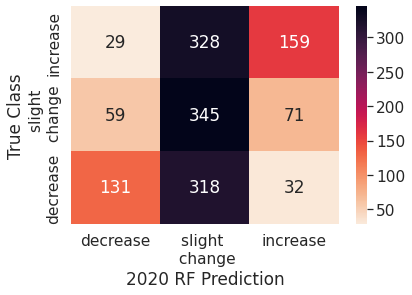

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.61      0.31      0.41       516
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



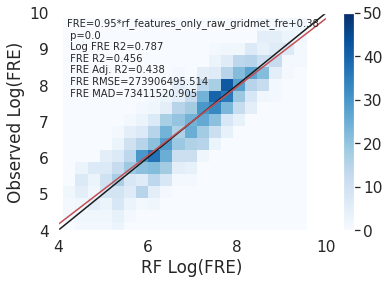

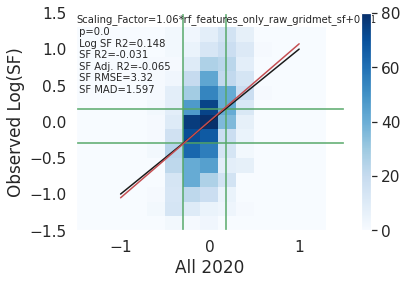

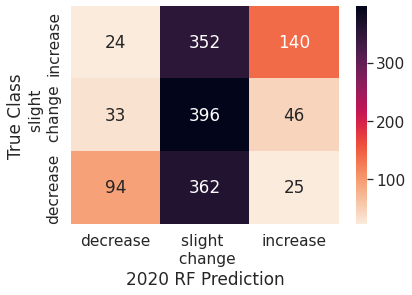

              precision    recall  f1-score   support

    decrease       0.62      0.20      0.30       481
    increase       0.66      0.27      0.39       516
   no_change       0.36      0.83      0.50       475

    accuracy                           0.43      1472
   macro avg       0.55      0.43      0.39      1472
weighted avg       0.55      0.43      0.39      1472



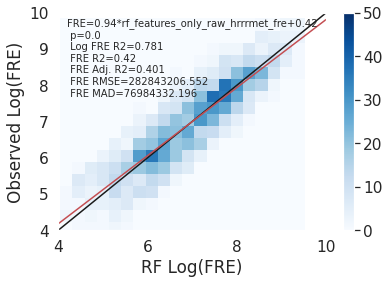

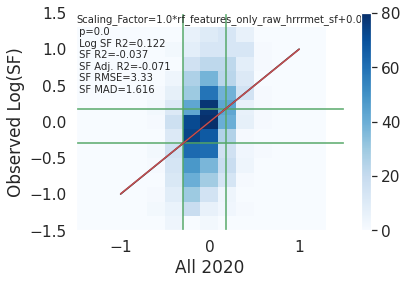

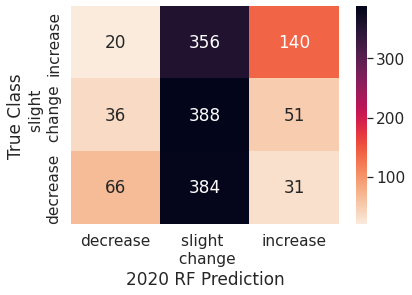

              precision    recall  f1-score   support

    decrease       0.54      0.14      0.22       481
    increase       0.63      0.27      0.38       516
   no_change       0.34      0.82      0.48       475

    accuracy                           0.40      1472
   macro avg       0.51      0.41      0.36      1472
weighted avg       0.51      0.40      0.36      1472



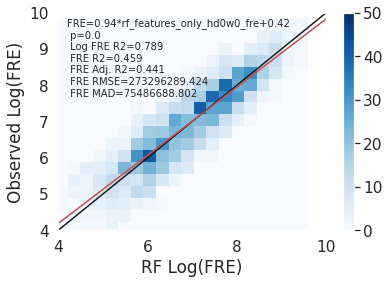

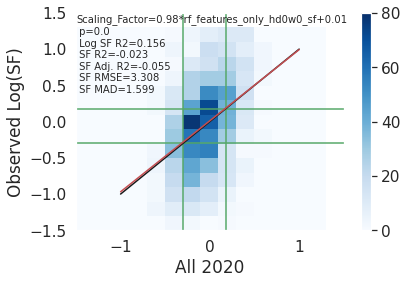

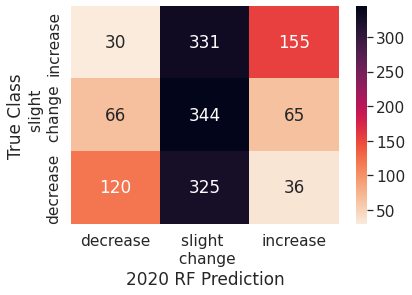

              precision    recall  f1-score   support

    decrease       0.56      0.25      0.34       481
    increase       0.61      0.30      0.40       516
   no_change       0.34      0.72      0.47       475

    accuracy                           0.42      1472
   macro avg       0.50      0.42      0.40      1472
weighted avg       0.50      0.42      0.40      1472



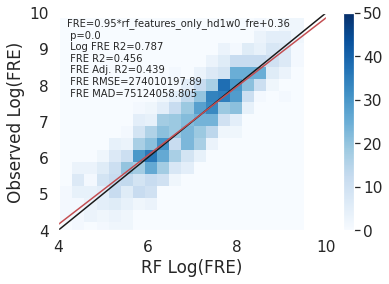

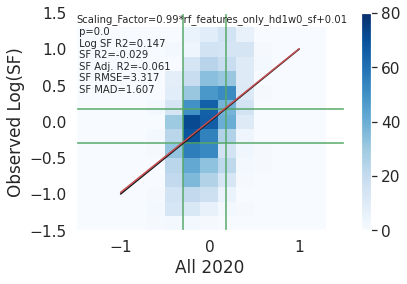

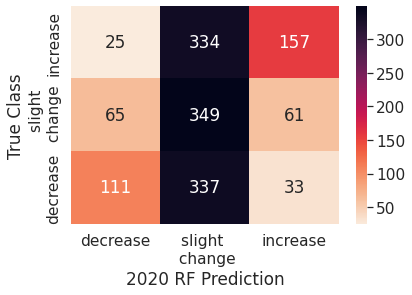

              precision    recall  f1-score   support

    decrease       0.55      0.23      0.33       481
    increase       0.63      0.30      0.41       516
   no_change       0.34      0.73      0.47       475

    accuracy                           0.42      1472
   macro avg       0.51      0.42      0.40      1472
weighted avg       0.51      0.42      0.40      1472



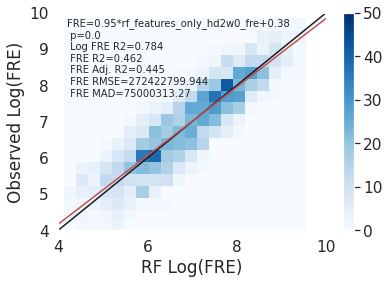

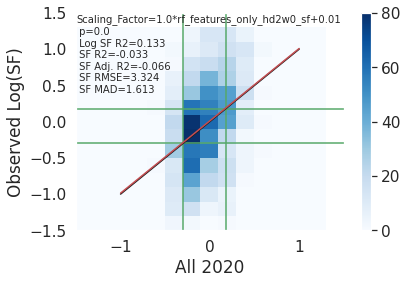

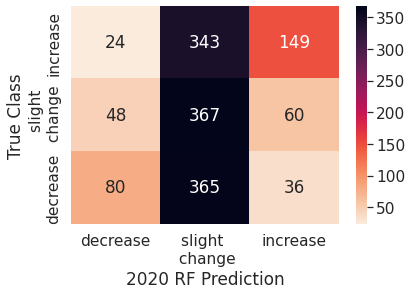

              precision    recall  f1-score   support

    decrease       0.53      0.17      0.25       481
    increase       0.61      0.29      0.39       516
   no_change       0.34      0.77      0.47       475

    accuracy                           0.40      1472
   macro avg       0.49      0.41      0.37      1472
weighted avg       0.50      0.40      0.37      1472



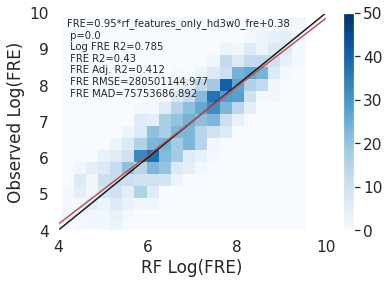

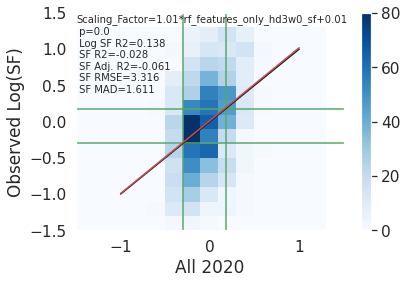

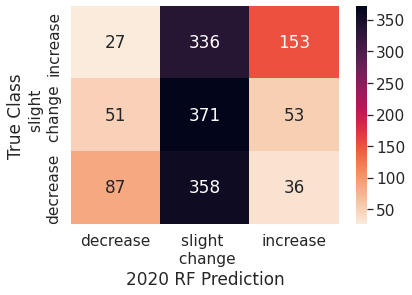

              precision    recall  f1-score   support

    decrease       0.53      0.18      0.27       481
    increase       0.63      0.30      0.40       516
   no_change       0.35      0.78      0.48       475

    accuracy                           0.42      1472
   macro avg       0.50      0.42      0.38      1472
weighted avg       0.51      0.42      0.39      1472



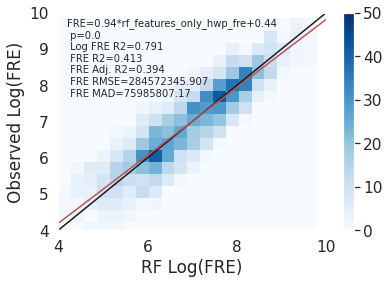

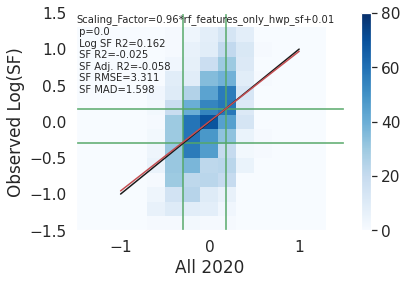

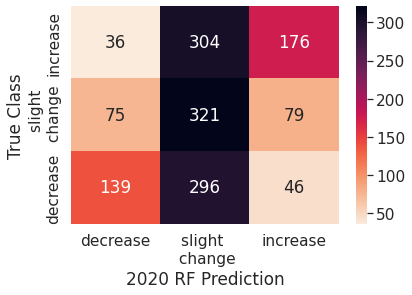

              precision    recall  f1-score   support

    decrease       0.56      0.29      0.38       481
    increase       0.58      0.34      0.43       516
   no_change       0.35      0.68      0.46       475

    accuracy                           0.43      1472
   macro avg       0.50      0.44      0.42      1472
weighted avg       0.50      0.43      0.42      1472



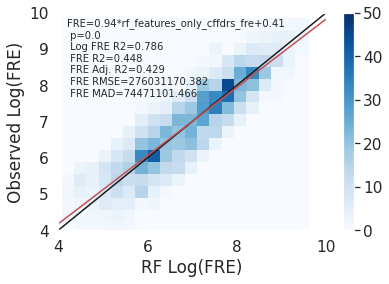

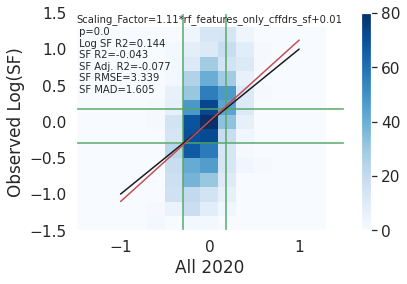

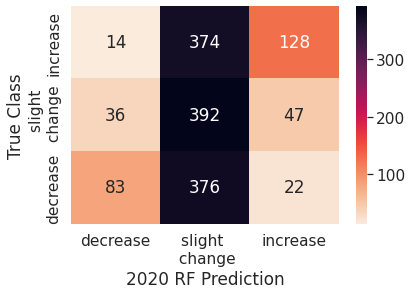

              precision    recall  f1-score   support

    decrease       0.62      0.17      0.27       481
    increase       0.65      0.25      0.36       516
   no_change       0.34      0.83      0.48       475

    accuracy                           0.41      1472
   macro avg       0.54      0.42      0.37      1472
weighted avg       0.54      0.41      0.37      1472



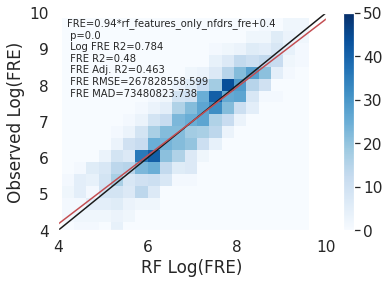

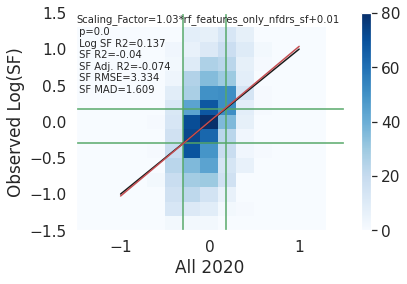

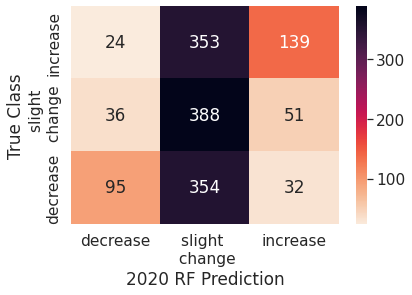

              precision    recall  f1-score   support

    decrease       0.61      0.20      0.30       481
    increase       0.63      0.27      0.38       516
   no_change       0.35      0.82      0.49       475

    accuracy                           0.42      1472
   macro avg       0.53      0.43      0.39      1472
weighted avg       0.53      0.42      0.39      1472



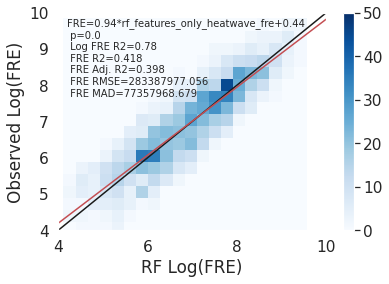

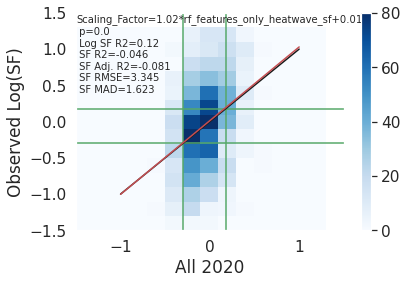

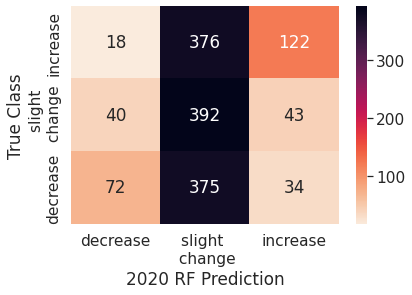

              precision    recall  f1-score   support

    decrease       0.55      0.15      0.24       481
    increase       0.61      0.24      0.34       516
   no_change       0.34      0.83      0.48       475

    accuracy                           0.40      1472
   macro avg       0.50      0.40      0.35      1472
weighted avg       0.51      0.40      0.35      1472



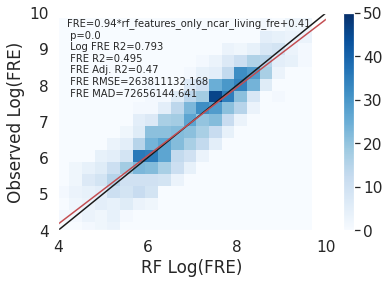

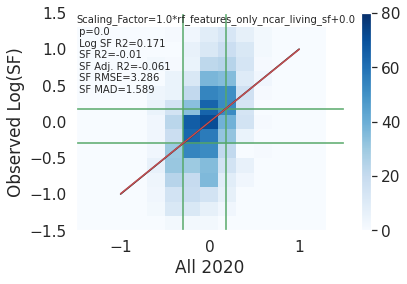

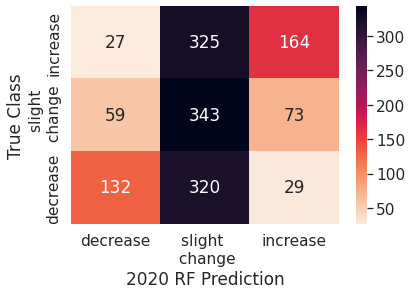

              precision    recall  f1-score   support

    decrease       0.61      0.27      0.38       481
    increase       0.62      0.32      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.53      0.43      0.42      1472



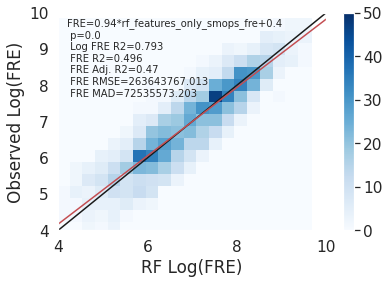

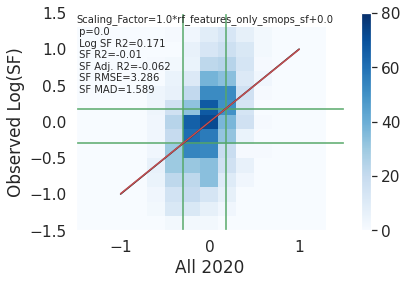

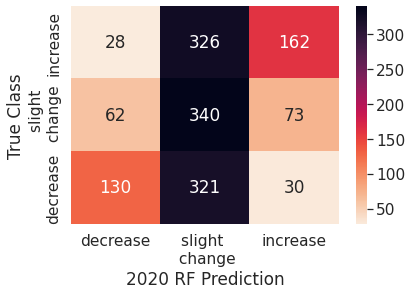

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.61      0.31      0.41       516
   no_change       0.34      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



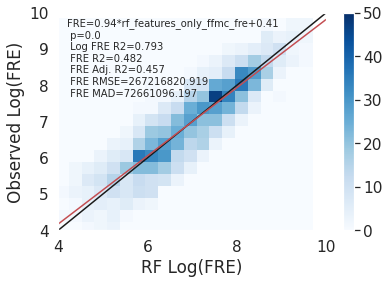

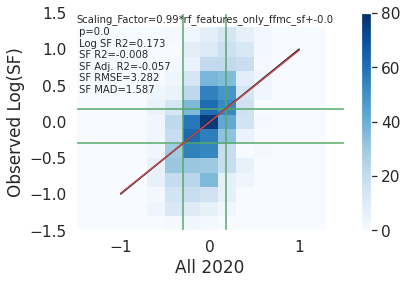

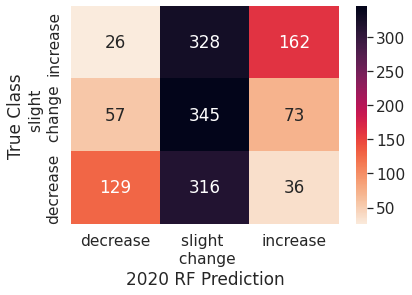

              precision    recall  f1-score   support

    decrease       0.61      0.27      0.37       481
    increase       0.60      0.31      0.41       516
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



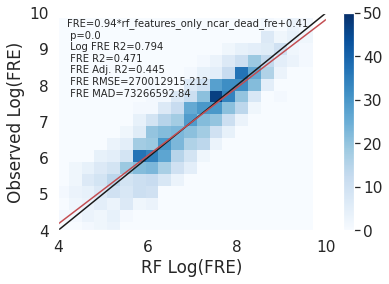

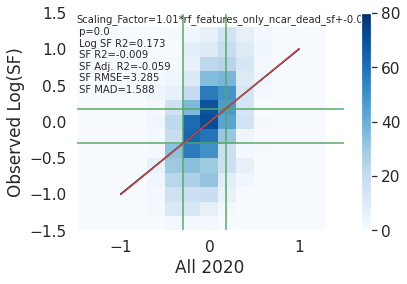

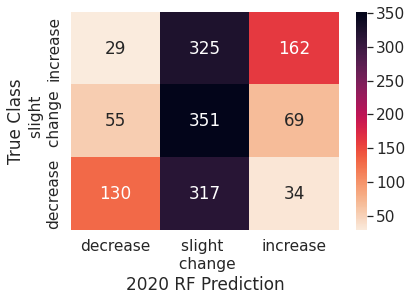

              precision    recall  f1-score   support

    decrease       0.61      0.27      0.37       481
    increase       0.61      0.31      0.41       516
   no_change       0.35      0.74      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.53      0.44      0.42      1472



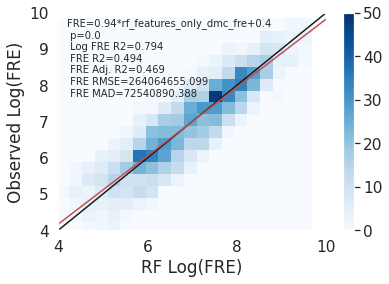

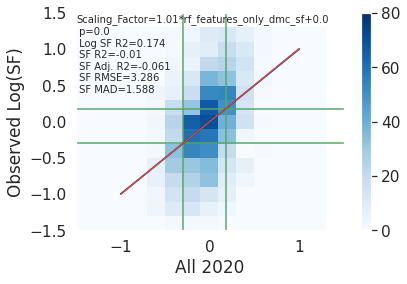

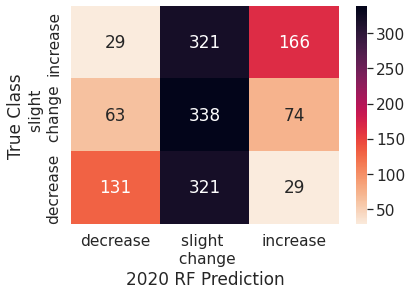

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.62      0.32      0.42       516
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



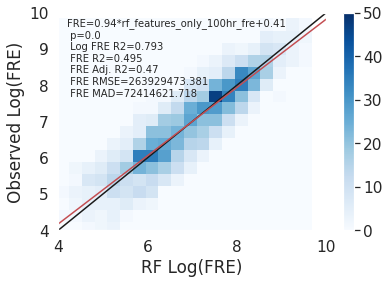

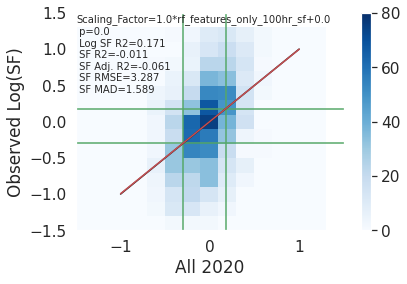

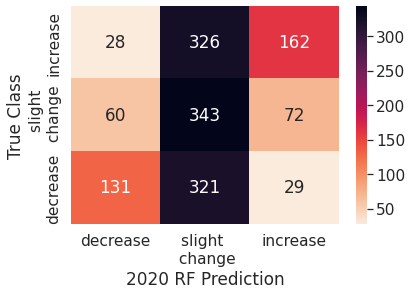

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.62      0.31      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



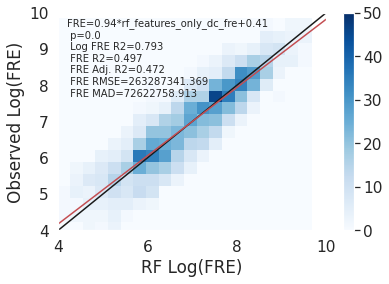

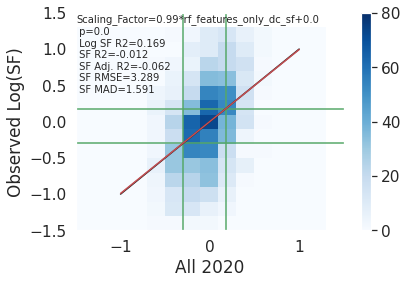

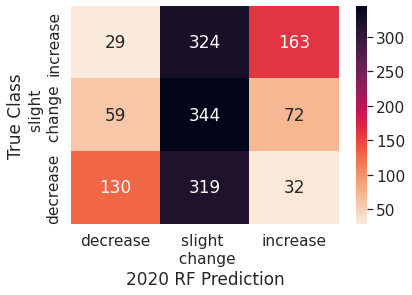

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.61      0.32      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



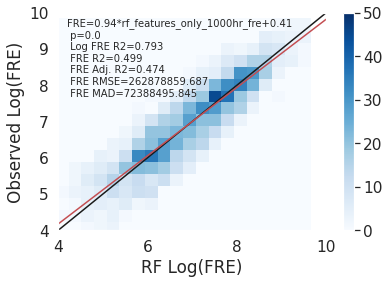

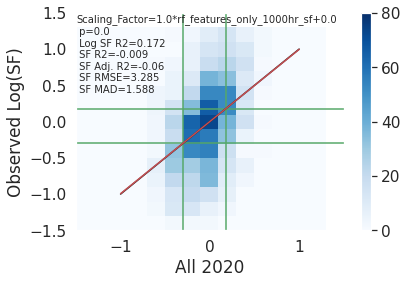

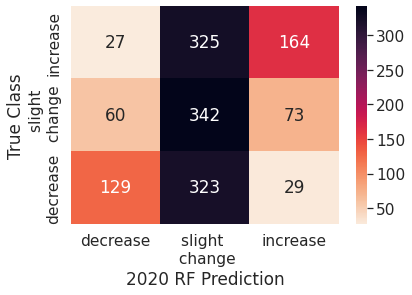

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.62      0.32      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



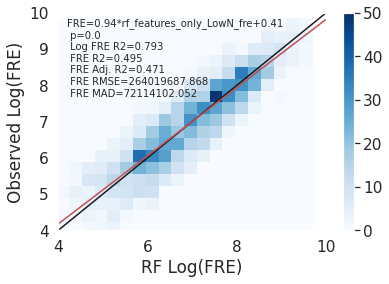

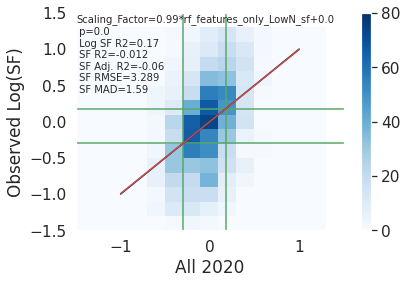

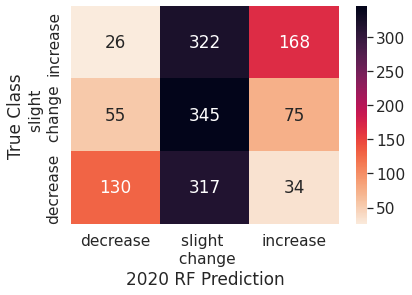

              precision    recall  f1-score   support

    decrease       0.62      0.27      0.38       481
    increase       0.61      0.33      0.42       516
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.53      0.44      0.42      1472



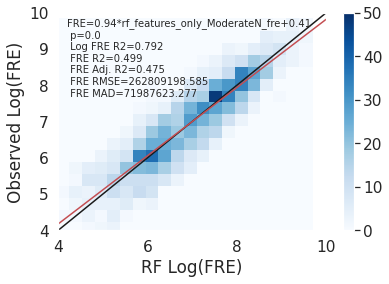

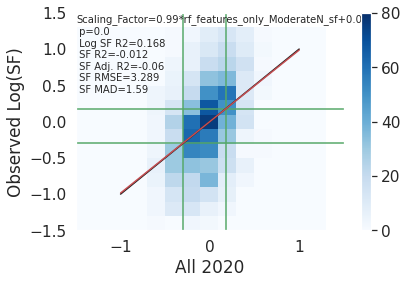

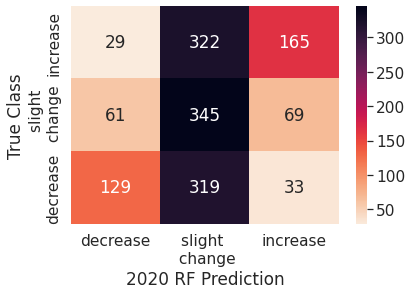

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.62      0.32      0.42       516
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



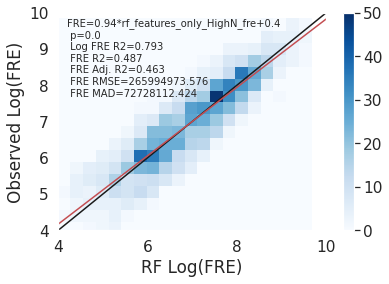

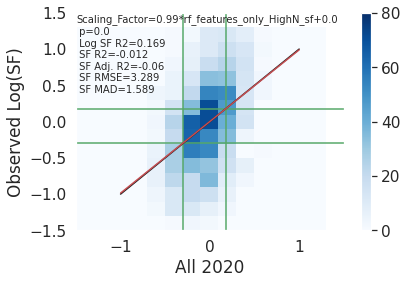

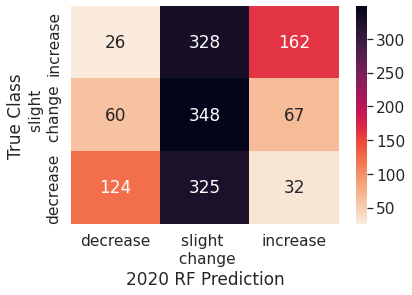

              precision    recall  f1-score   support

    decrease       0.59      0.26      0.36       481
    increase       0.62      0.31      0.42       516
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



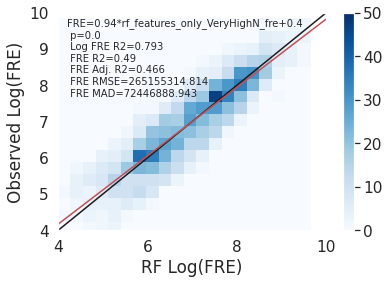

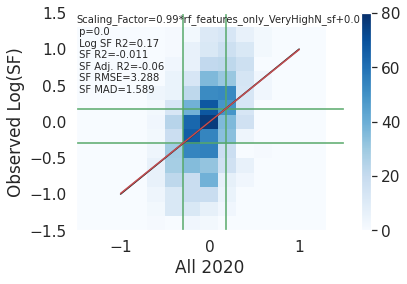

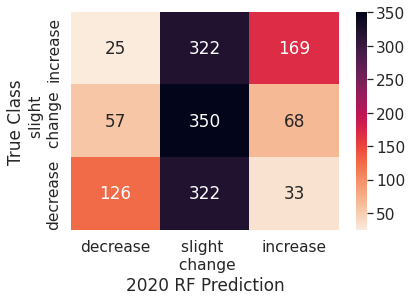

              precision    recall  f1-score   support

    decrease       0.61      0.26      0.37       481
    increase       0.63      0.33      0.43       516
   no_change       0.35      0.74      0.48       475

    accuracy                           0.44      1472
   macro avg       0.53      0.44      0.42      1472
weighted avg       0.53      0.44      0.42      1472



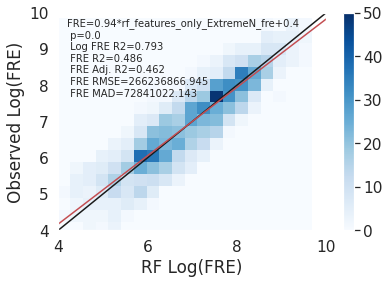

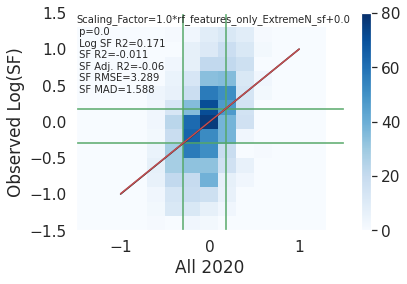

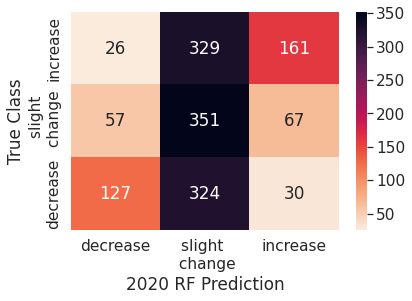

              precision    recall  f1-score   support

    decrease       0.60      0.26      0.37       481
    increase       0.62      0.31      0.42       516
   no_change       0.35      0.74      0.47       475

    accuracy                           0.43      1472
   macro avg       0.53      0.44      0.42      1472
weighted avg       0.53      0.43      0.42      1472



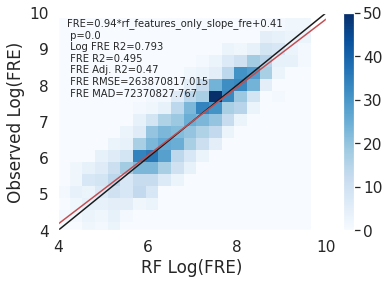

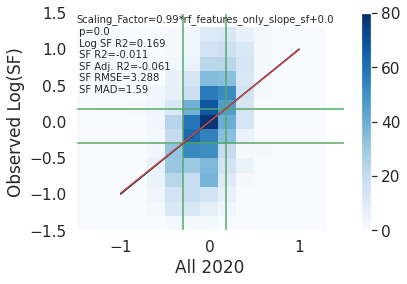

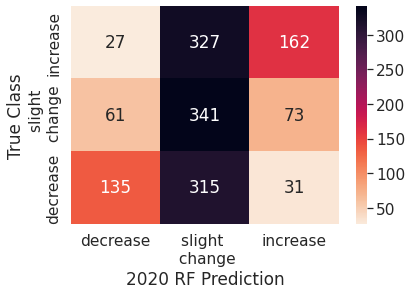

              precision    recall  f1-score   support

    decrease       0.61      0.28      0.38       481
    increase       0.61      0.31      0.41       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



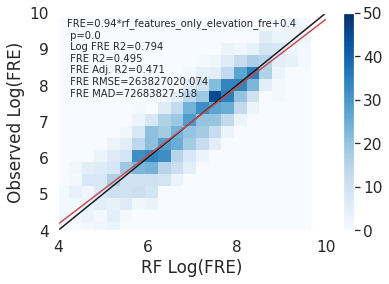

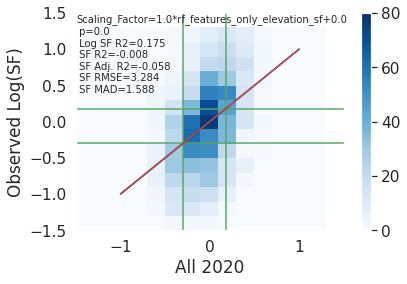

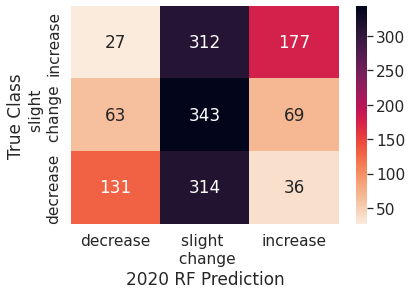

              precision    recall  f1-score   support

    decrease       0.59      0.27      0.37       481
    increase       0.63      0.34      0.44       516
   no_change       0.35      0.72      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.45      0.43      1472
weighted avg       0.53      0.44      0.43      1472



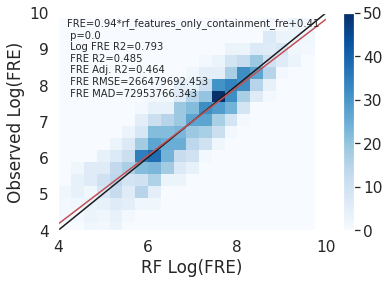

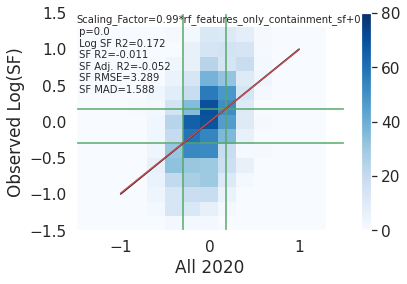

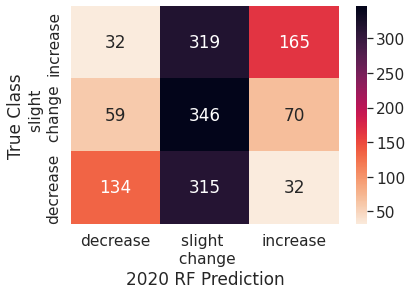

              precision    recall  f1-score   support

    decrease       0.60      0.28      0.38       481
    increase       0.62      0.32      0.42       516
   no_change       0.35      0.73      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.43      1472
weighted avg       0.53      0.44      0.43      1472



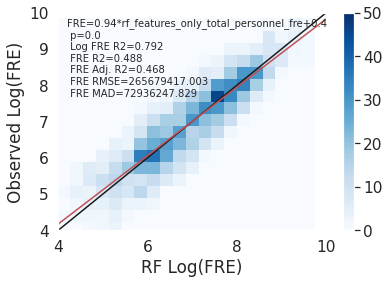

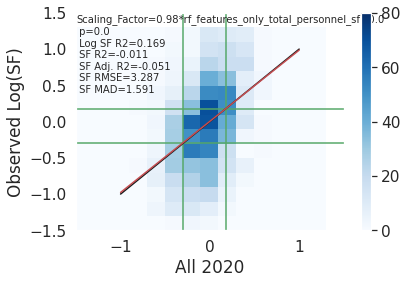

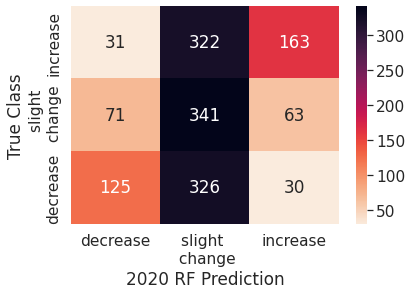

              precision    recall  f1-score   support

    decrease       0.55      0.26      0.35       481
    increase       0.64      0.32      0.42       516
   no_change       0.34      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.51      0.43      0.41      1472
weighted avg       0.51      0.43      0.41      1472



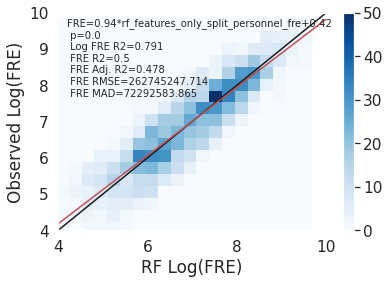

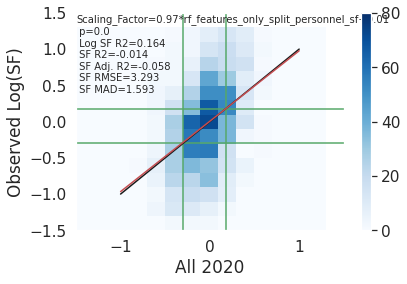

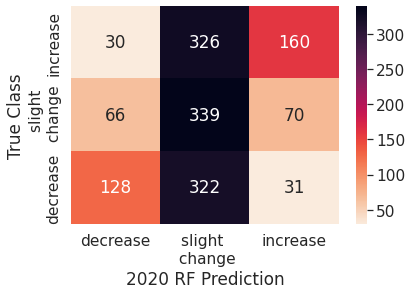

              precision    recall  f1-score   support

    decrease       0.57      0.27      0.36       481
    increase       0.61      0.31      0.41       516
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1472
   macro avg       0.51      0.43      0.41      1472
weighted avg       0.51      0.43      0.41      1472



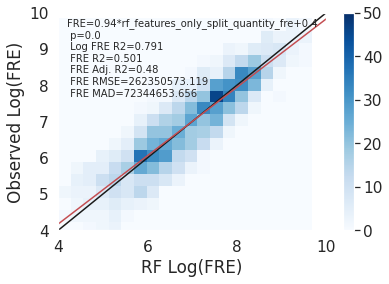

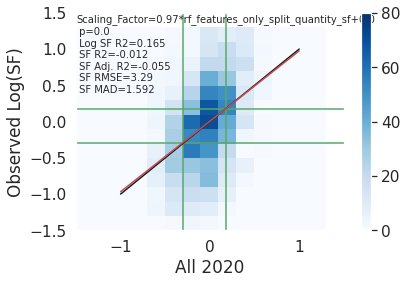

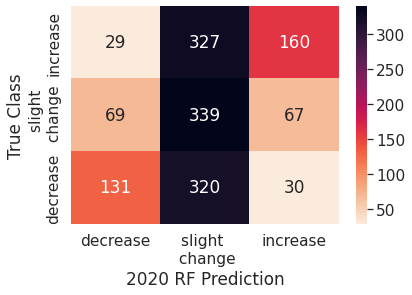

              precision    recall  f1-score   support

    decrease       0.57      0.27      0.37       481
    increase       0.62      0.31      0.41       516
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1472
   macro avg       0.51      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



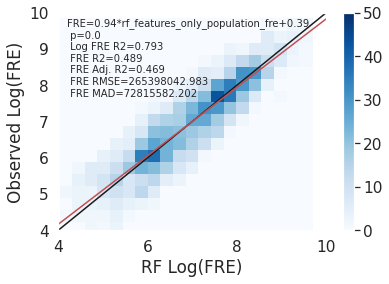

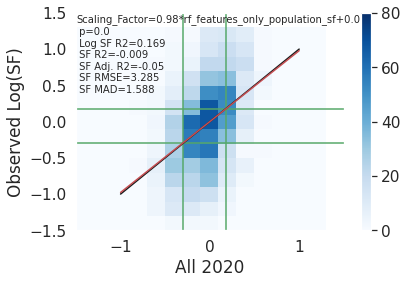

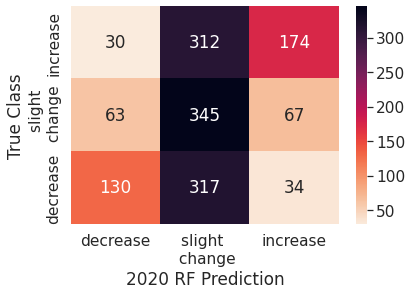

              precision    recall  f1-score   support

    decrease       0.58      0.27      0.37       481
    increase       0.63      0.34      0.44       516
   no_change       0.35      0.73      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.43      1472
weighted avg       0.53      0.44      0.43      1472



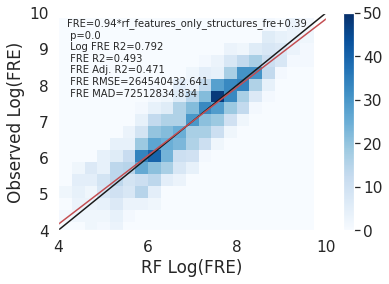

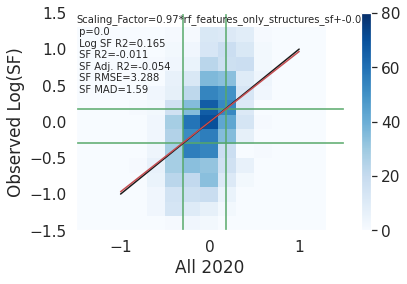

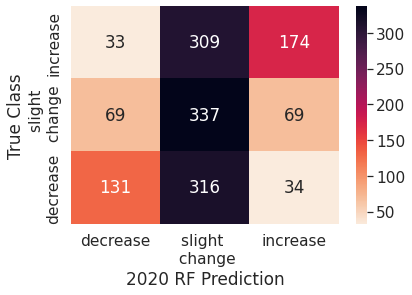

              precision    recall  f1-score   support

    decrease       0.56      0.27      0.37       481
    increase       0.63      0.34      0.44       516
   no_change       0.35      0.71      0.47       475

    accuracy                           0.44      1472
   macro avg       0.51      0.44      0.42      1472
weighted avg       0.52      0.44      0.43      1472



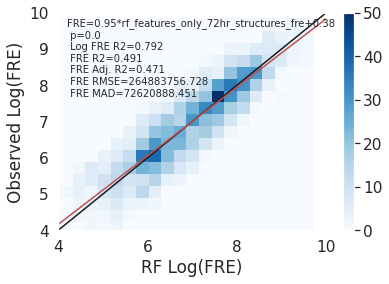

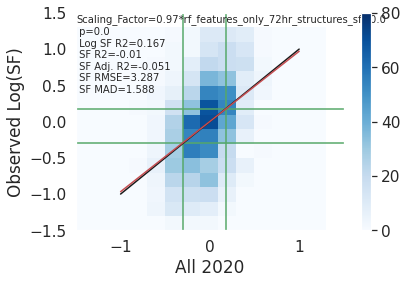

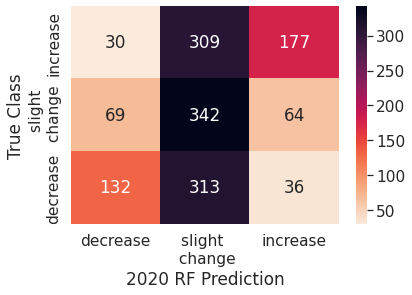

              precision    recall  f1-score   support

    decrease       0.57      0.27      0.37       481
    increase       0.64      0.34      0.45       516
   no_change       0.35      0.72      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.45      0.43      1472
weighted avg       0.53      0.44      0.43      1472



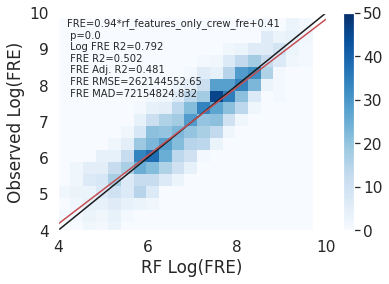

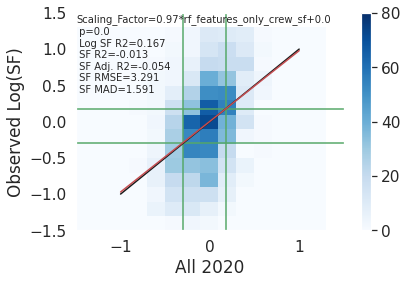

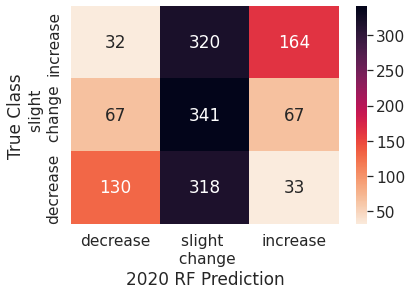

              precision    recall  f1-score   support

    decrease       0.57      0.27      0.37       481
    increase       0.62      0.32      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.51      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



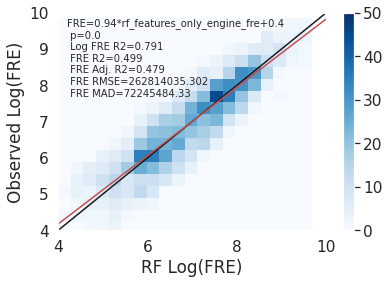

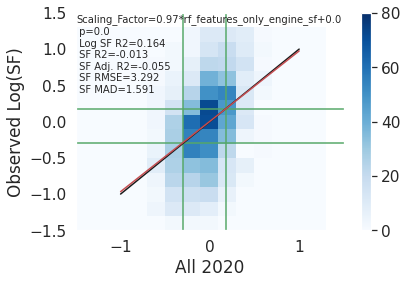

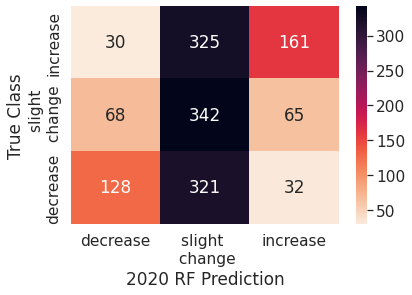

              precision    recall  f1-score   support

    decrease       0.57      0.27      0.36       481
    increase       0.62      0.31      0.42       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.51      0.43      0.42      1472
weighted avg       0.52      0.43      0.42      1472



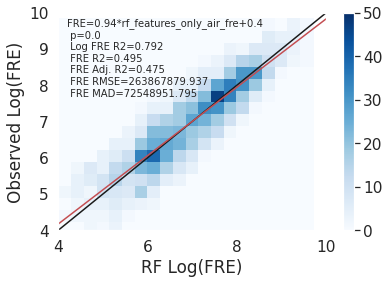

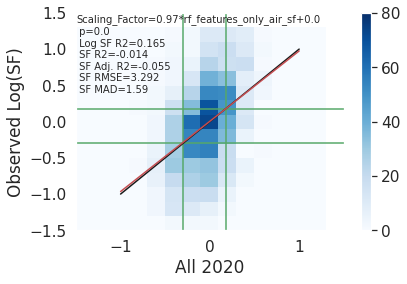

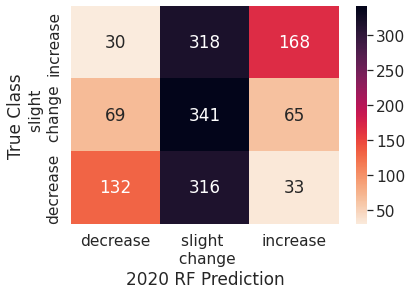

              precision    recall  f1-score   support

    decrease       0.57      0.27      0.37       481
    increase       0.63      0.33      0.43       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.44      0.42      1472



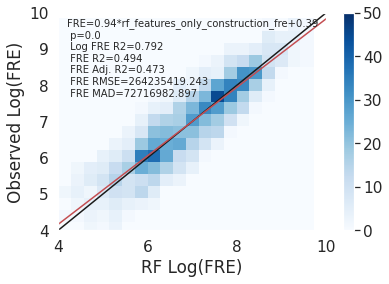

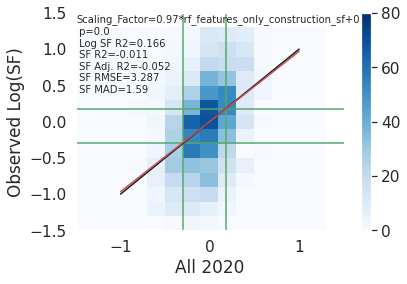

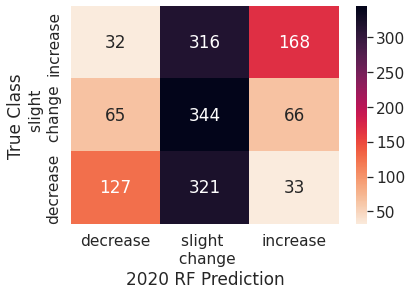

              precision    recall  f1-score   support

    decrease       0.57      0.26      0.36       481
    increase       0.63      0.33      0.43       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.43      0.42      1472



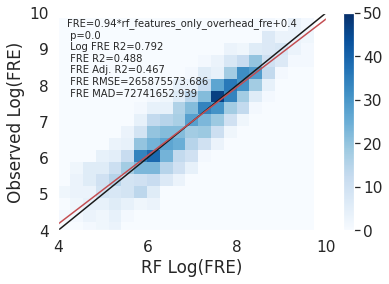

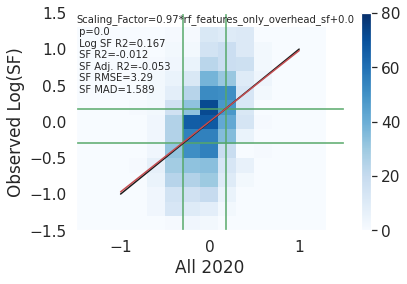

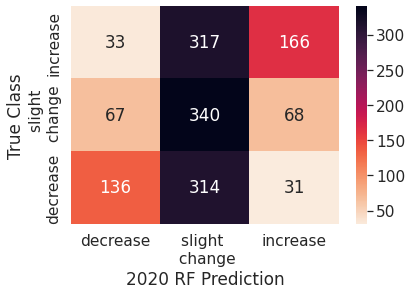

              precision    recall  f1-score   support

    decrease       0.58      0.28      0.38       481
    increase       0.63      0.32      0.43       516
   no_change       0.35      0.72      0.47       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.44      0.42      1472



In [36]:
# Plotting
for ii in range(1,len(feature_set_names)):

    frp_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_fre', 'FRE','rf_'+feature_set_names[ii]+'_logfre', 'log_FRE', 'Blues', 0, 50,'RF Log(FRE)',feature_subsets[feature_set_names[ii]])
    
    sf_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_sf', 'Scaling_Factor','rf_'+feature_set_names[ii]+'_logsf', 'Log_Scaling_Factor','Blues',0,80, -.3, .18, 'All 2020',feature_subsets[feature_set_names[ii]])
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+feature_set_names[ii]+'_cat', '2020 RF Prediction')  



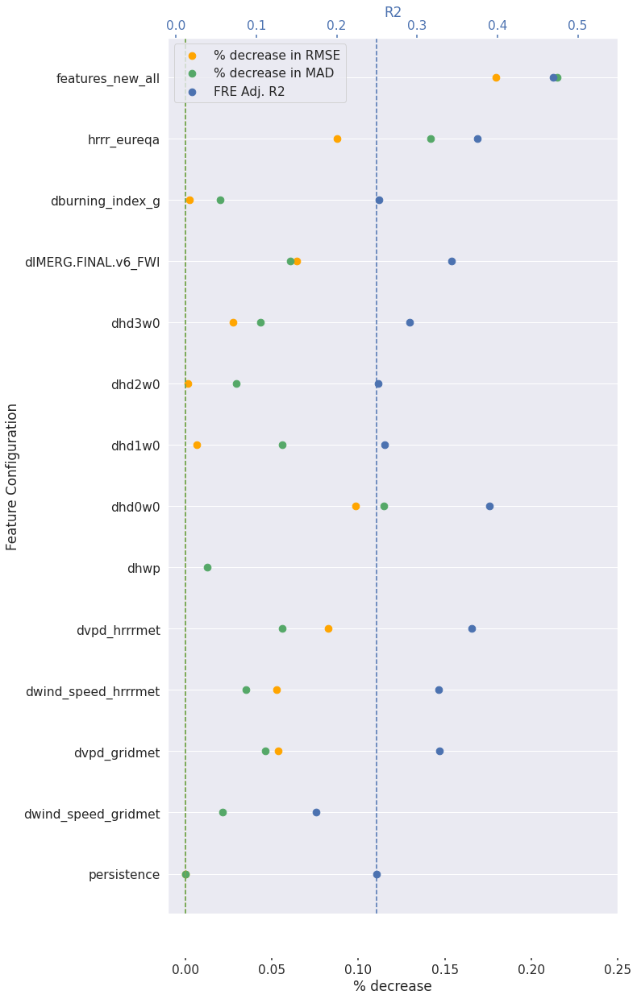

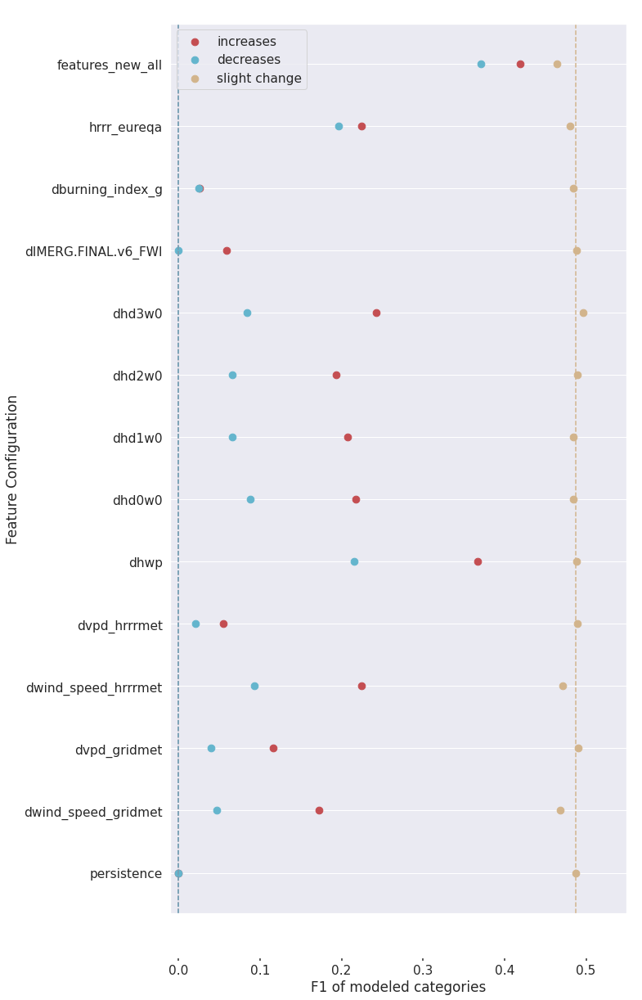

In [37]:
#SCALED METHODS
all_sensitivity_tests = ['persistence','dwind_speed_gridmet','dvpd_gridmet','dwind_speed_hrrrmet','dvpd_hrrrmet',
                  'dhwp',
                         'dhd0w0','dhd1w0', 'dhd2w0', 'dhd3w0', 'dIMERG.FINAL.v6_FWI',
                         'dburning_index_g',
                         'hrrr_eureqa','features_new_all']


df_error_metrics = pd.concat([df_error_metrics_scaled, 
                              df_error_metrics_eureqa.iloc[0:1,:],
                              df_error_metrics_rf.iloc[1:2,:]])
plot_frp_sensitivity_metrics(df_error_metrics, all_sensitivity_tests,'persistence', (10,20))
plot_f1_sensitivity_metrics(df_error_metrics, all_sensitivity_tests,'persistence',(10,20))

df_error_metrics.to_csv('error_fig1.csv')

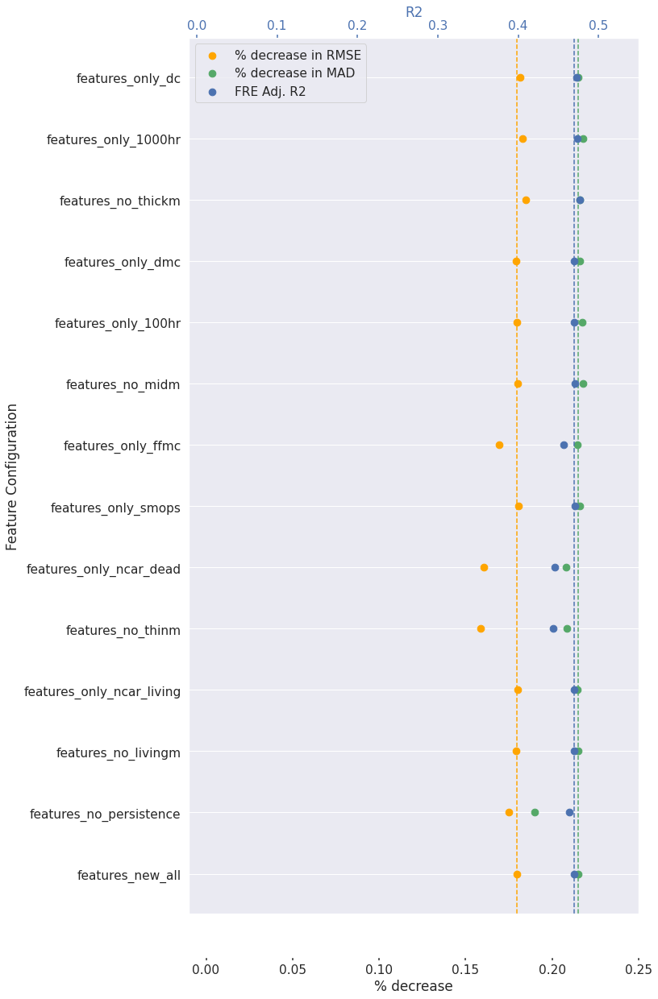

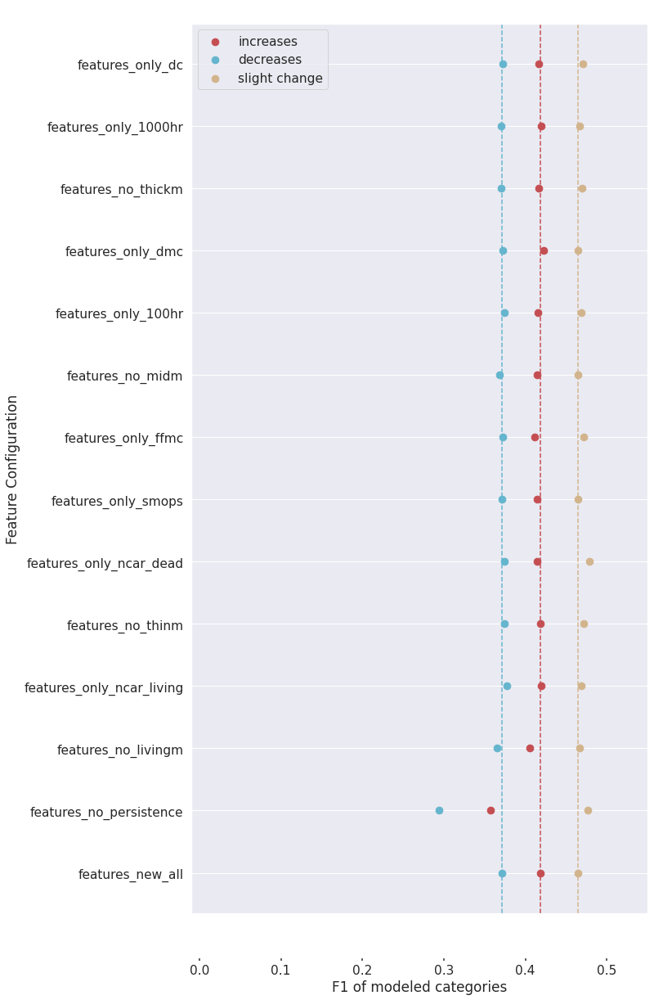

In [39]:
# New way of doing moisture, 8/11
all_sensitivity_tests = ['features_new_all', 'features_no_persistence', 

                         
                         'features_no_livingm', 'features_only_ncar_living',#living fm
                         'features_no_thinm', 'features_only_ncar_dead', 'features_only_smops',
                         'features_only_ffmc',#thin fm
                         'features_no_midm', 'features_only_100hr', 'features_only_dmc',#mid fm
                         'features_no_thickm', 'features_only_1000hr', 'features_only_dc',#thick fm
                         ]

plot_frp_sensitivity_metrics(df_error_metrics_rf, all_sensitivity_tests,'features_new_all',(10,20))
plot_f1_sensitivity_metrics(df_error_metrics_rf, all_sensitivity_tests,'features_new_all',(10,20))

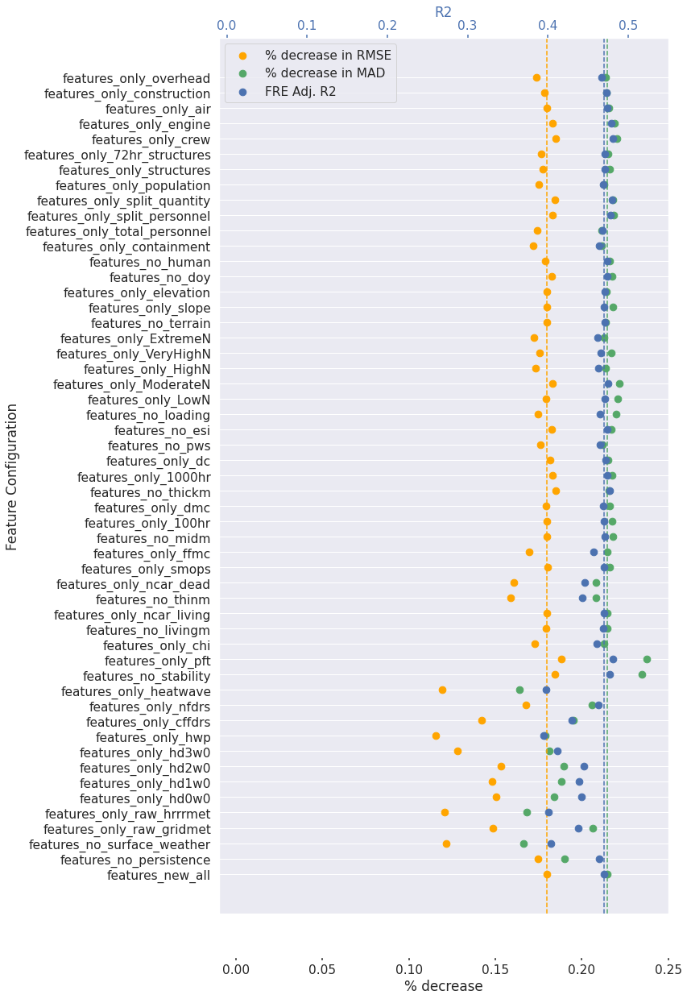

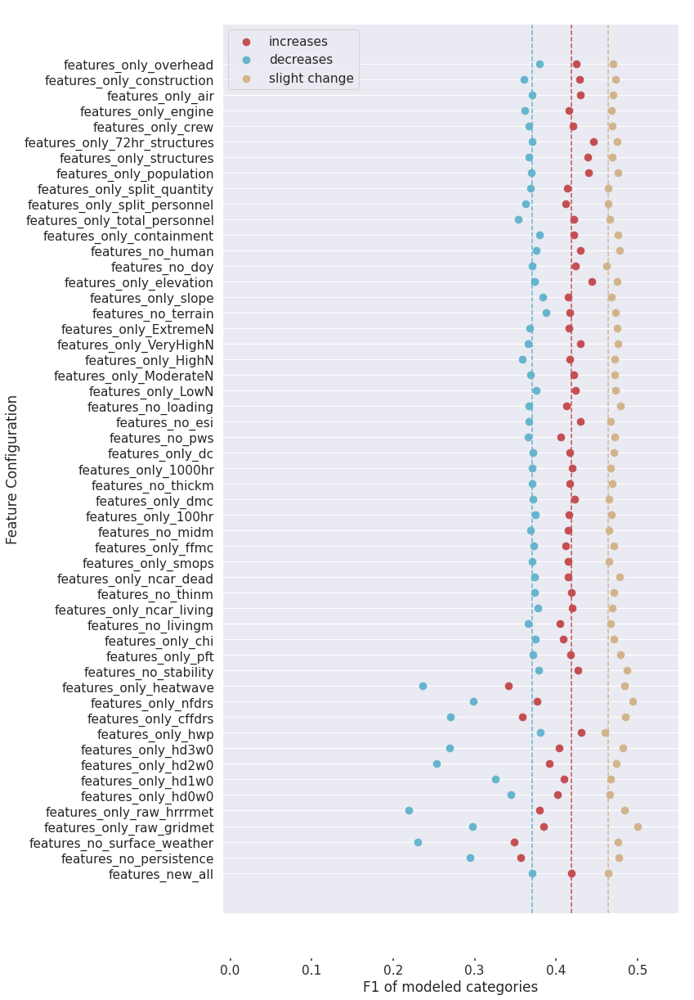

In [40]:
# everything in one figure, 8/11
all_sensitivity_tests = ['features_new_all', 'features_no_persistence', 
                         'features_no_surface_weather', #weather
                         'features_only_raw_gridmet', 'features_only_raw_hrrrmet', 
                         'features_only_hd0w0','features_only_hd1w0',
                         'features_only_hd2w0','features_only_hd3w0', 'features_only_hwp',
                         'features_only_cffdrs', 'features_only_nfdrs', 'features_only_heatwave',
                         'features_no_stability', #stability
                         'features_only_pft', 'features_only_chi',
                         
                         #'features_no_soil_moisture', #soil m
                         #'features_only_smops','features_only_sm_cffdrs',
                         #'features_no_fuel_moisture', #fuelm
                         #'features_only_fm_ncar', 'features_only_fm_nfdrs',""""
                         
                         'features_no_livingm', 'features_only_ncar_living',#living fm
                         'features_no_thinm', 'features_only_ncar_dead', 'features_only_smops',
                         'features_only_ffmc',#thin fm
                         'features_no_midm', 'features_only_100hr', 'features_only_dmc',#mid fm
                         'features_no_thickm', 'features_only_1000hr', 'features_only_dc',#thick fm
                         
                         'features_no_pws', #PWS
                         'features_no_esi', #ESI
                         'features_no_loading', #loading
                         'features_only_LowN','features_only_ModerateN','features_only_HighN',
                         'features_only_VeryHighN', 'features_only_ExtremeN',
                         'features_no_terrain', #terrain
                         'features_only_slope', 'features_only_elevation',
                         'features_no_doy', #DOY
                         'features_no_human', #human factors
                         'features_only_containment','features_only_total_personnel',
                         'features_only_split_personnel','features_only_split_quantity',
                         'features_only_population','features_only_structures',
                         'features_only_72hr_structures',
                         'features_only_crew', 'features_only_engine','features_only_air', 
                         'features_only_construction','features_only_overhead']

plot_frp_sensitivity_metrics(df_error_metrics_rf, all_sensitivity_tests,'features_new_all',(10,20))
plot_f1_sensitivity_metrics(df_error_metrics_rf, all_sensitivity_tests,'features_new_all',(10,20))
df_error_metrics_rf.to_csv('error_fig2.csv')

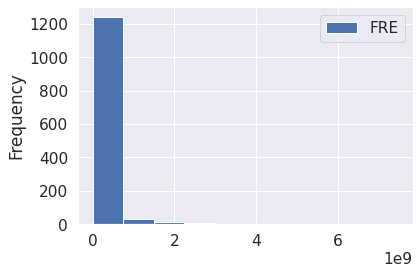

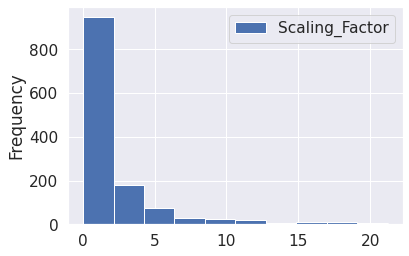

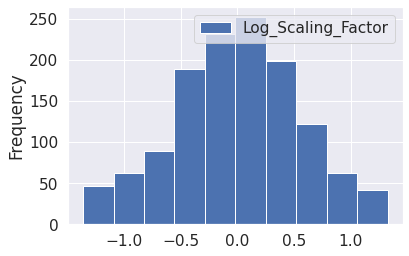

In [55]:
data_train_1921.plot.hist(y='FRE')
plt.show()
data_train_1921.plot.hist(y='Scaling_Factor')
plt.show()
data_train_1921.plot.hist(y='Log_Scaling_Factor')
plt.show()

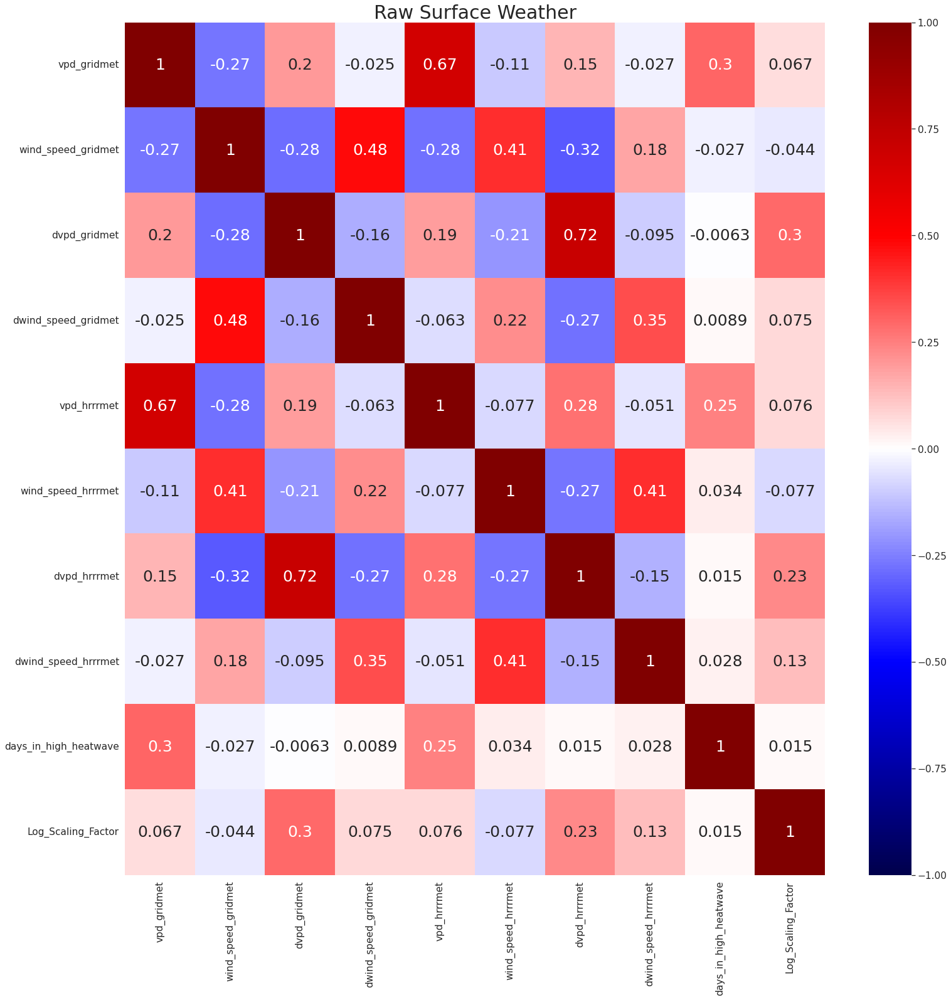

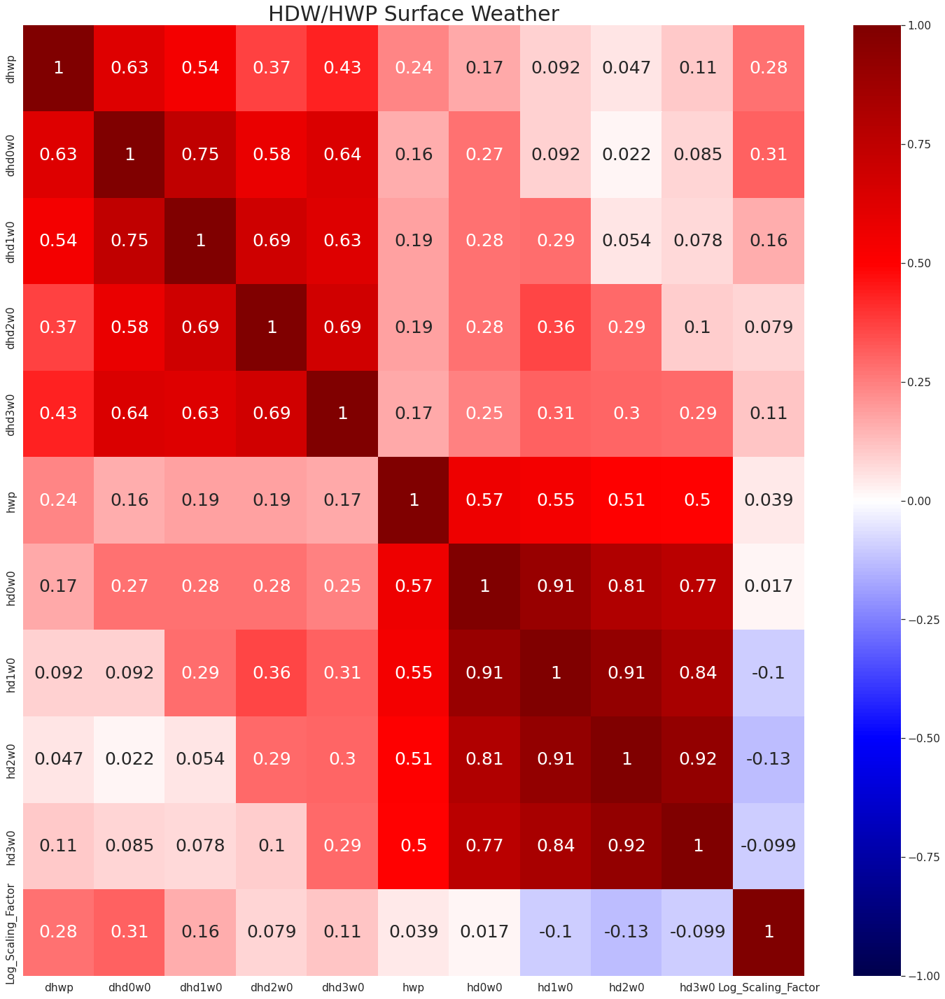

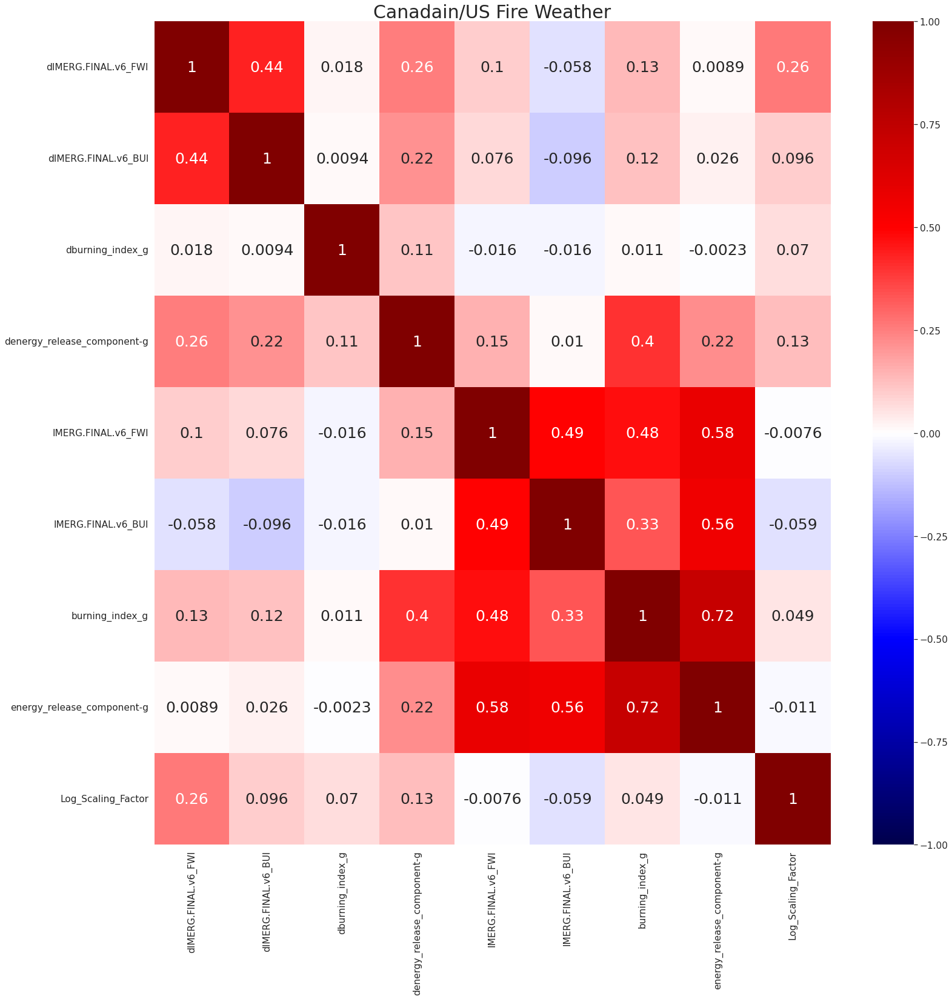

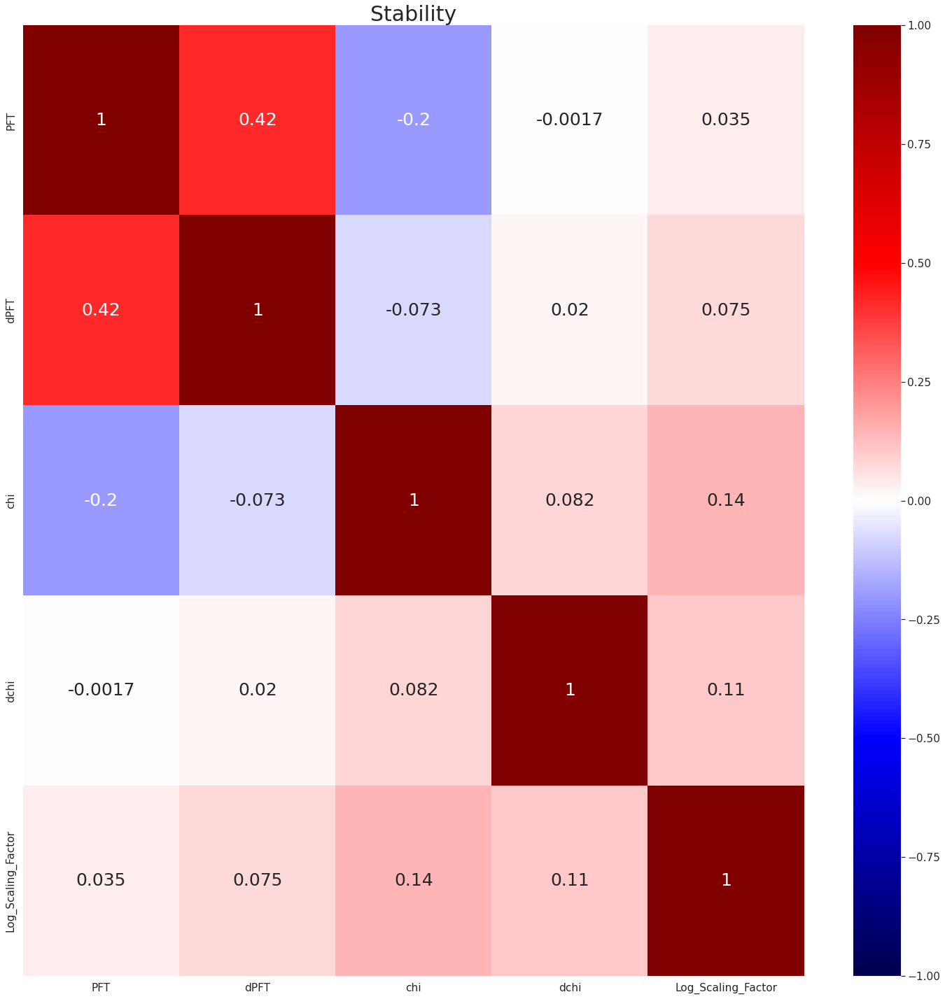

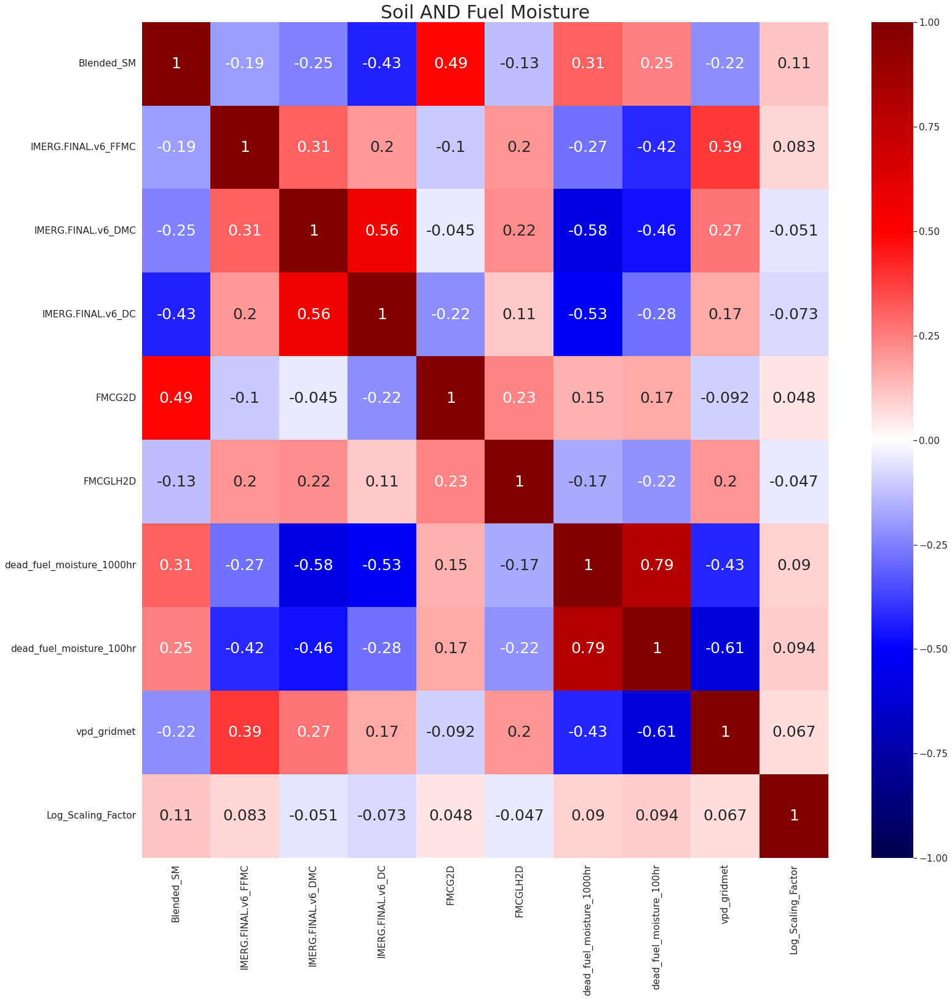

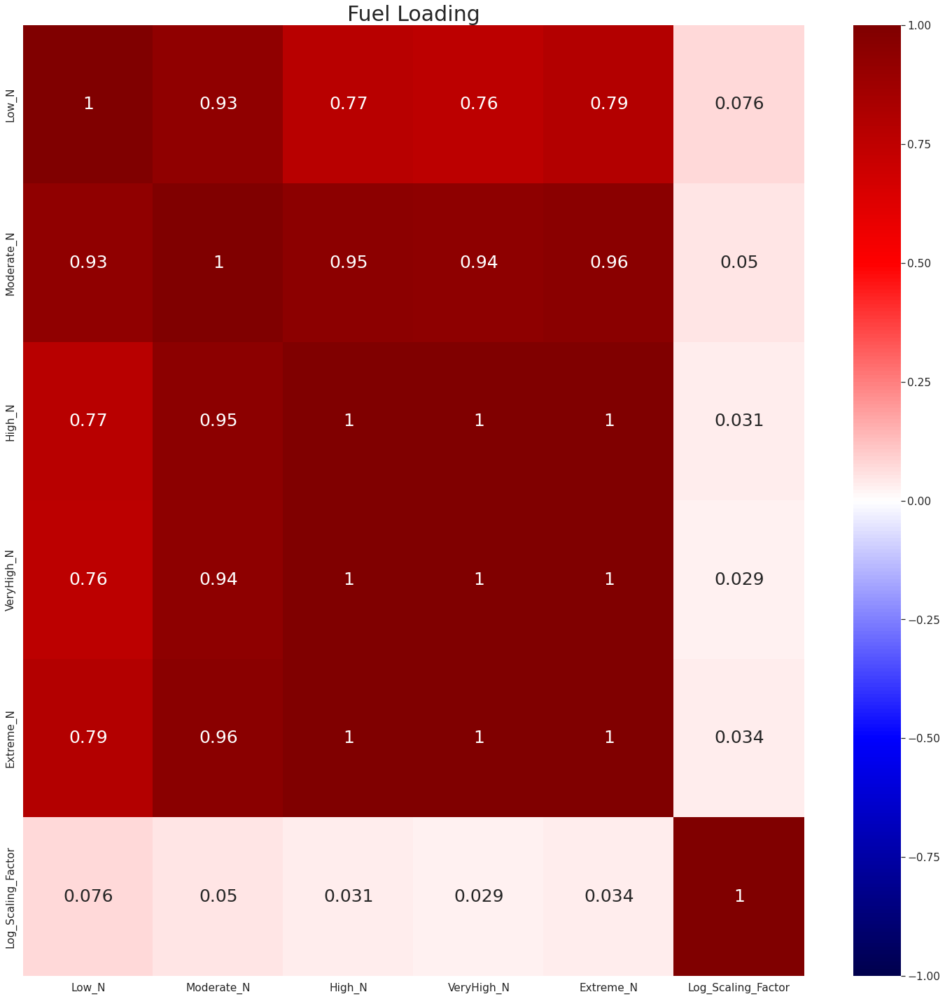

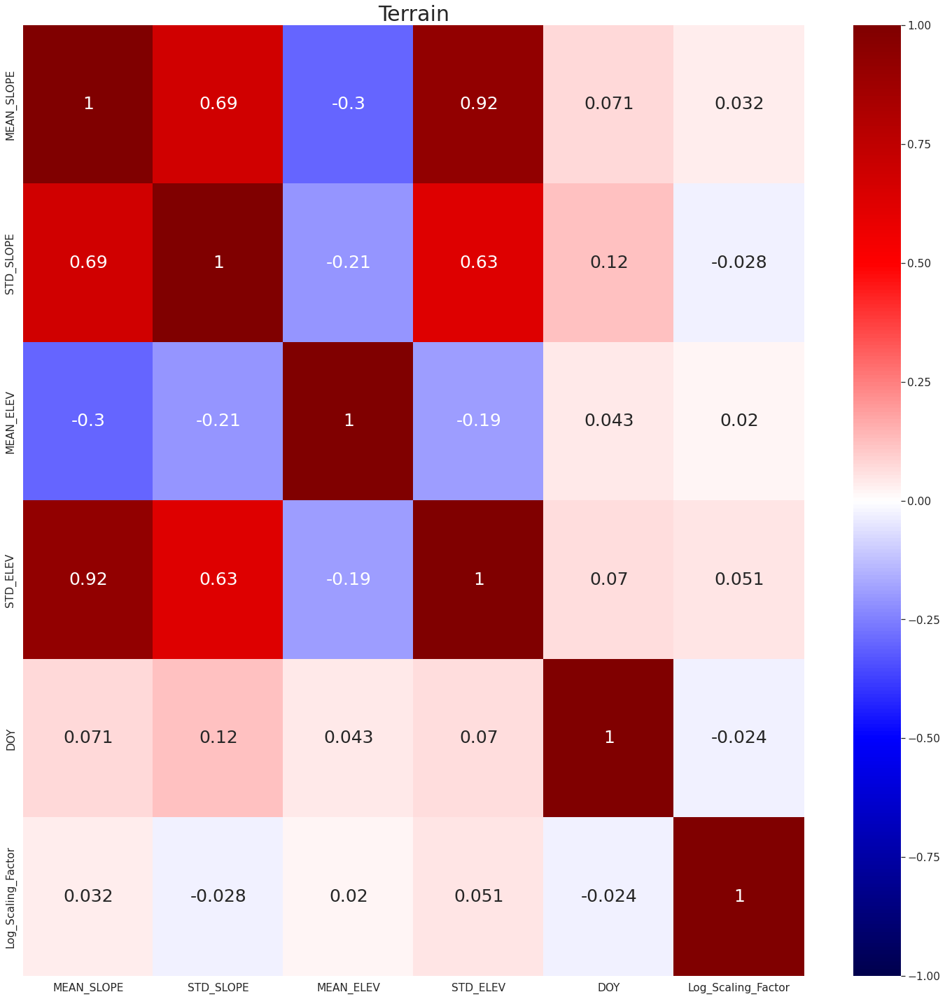

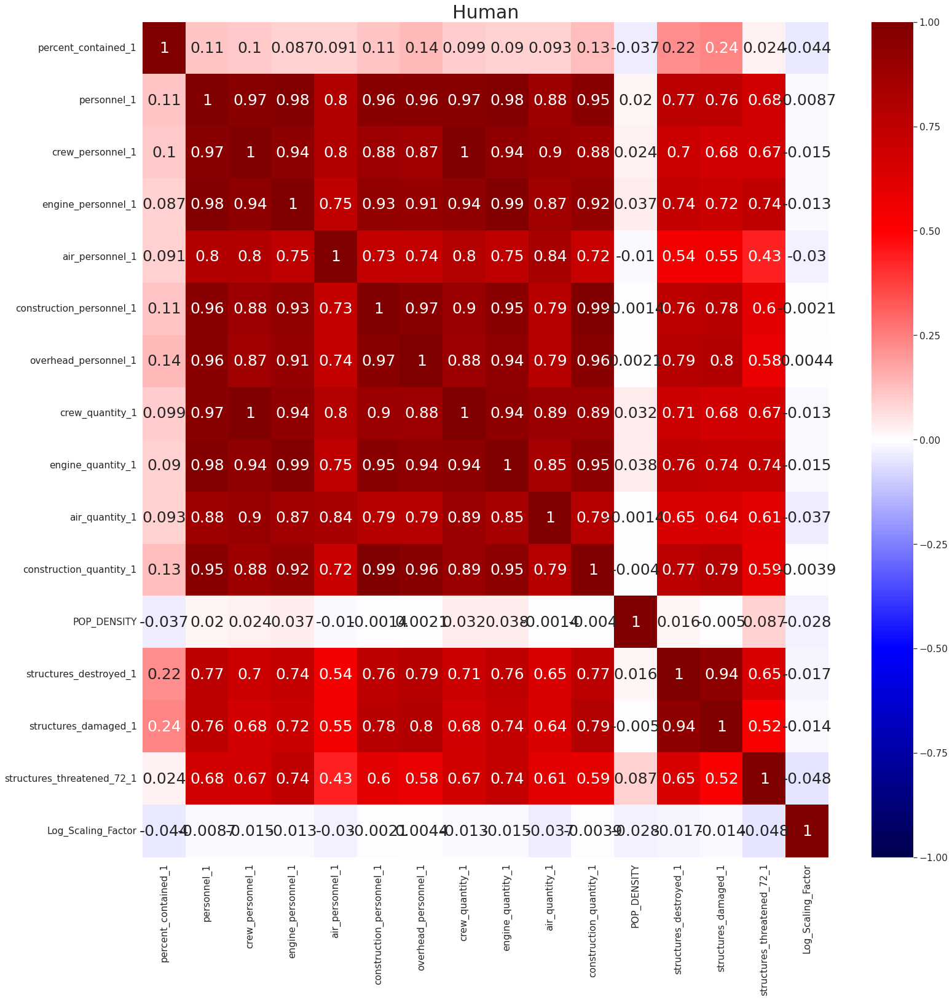

In [165]:
plot_correlations(data_train_1921[["vpd_gridmet","wind_speed_gridmet","dvpd_gridmet","dwind_speed_gridmet",
 "vpd_hrrrmet","wind_speed_hrrrmet","dvpd_hrrrmet","dwind_speed_hrrrmet",
 "days_in_high_heatwave",'Log_Scaling_Factor']],'Raw Surface Weather','pearson', 25)






plot_correlations(data_train_1921[["dhwp",
 "dhd0w0","dhd1w0", "dhd2w0", "dhd3w0","hwp","hd0w0", "hd1w0", "hd2w0", "hd3w0",
                    'Log_Scaling_Factor']],
                  'HDW/HWP Surface Weather','pearson', 25)

plot_correlations(data_train_1921[[
"dIMERG.FINAL.v6_FWI","dIMERG.FINAL.v6_BUI", "dburning_index_g","denergy_release_component-g",
    "IMERG.FINAL.v6_FWI","IMERG.FINAL.v6_BUI","burning_index_g","energy_release_component-g",
    'Log_Scaling_Factor']],
                  'Canadain/US Fire Weather','pearson', 25)

plot_correlations(data_train_1921[["PFT", "dPFT", 'chi', 'dchi','Log_Scaling_Factor']],
                  'Stability','pearson', 25)

plot_correlations(data_train_1921[["Blended_SM", "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC",
                                   "FMCG2D", "FMCGLH2D", "dead_fuel_moisture_1000hr","dead_fuel_moisture_100hr",
                                  'vpd_gridmet',"Log_Scaling_Factor"]],
                  'Soil AND Fuel Moisture','pearson', 25)

plot_correlations(data_train_1921[features_by_category['loading'] +['Log_Scaling_Factor']],
                  'Fuel Loading','pearson', 25)

plot_correlations(data_train_1921[features_by_category['terrain_slope']+\
                                  features_by_category['terrain_elevation']+['DOY','Log_Scaling_Factor']],
                  'Terrain','pearson', 25)

plot_correlations(data_train_1921[features_by_category['containment']+\
                                  features_by_category['total_personnel']+\
                                  features_by_category['split_personnel']+\
                                  features_by_category['split_quantity']+\
                                  features_by_category['pop']+\
                                  features_by_category['structures']+['Log_Scaling_Factor']],
                  'Human','pearson', 25)



# New Moisture handling Optimal Subsets

In [59]:
#AUGUST 24th REDO

feature_subsets = {}

#all features
not_allowed=[]
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])


feature_subsets['features_raw_gridmet'] = ['vpd_gridmet', 'dvpd_gridmet',
                                           'wind_speed_gridmet','dwind_speed_gridmet',
                                           'hwp','dhwp',
                                           'PFT', 'dPFT', 
                                           'Blended_SM', 
                                           'FMCGLH2D',
                                           'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_hdw'] = ['hd0w0', 'dhd1w0', 
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM', 
                                   'FMCGLH2D','PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]



feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                    'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    #'Blended_SM',
                                   "FMCGLH2D",
                                   "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC",
                                   'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ] 


feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                  'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    "FMCGLH2D",
                                  'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS','Moderate_N', 'DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

features_new_all OOB R2 score is: 0.21990804355483062
features_raw_gridmet OOB R2 score is: 0.23291874977430926
features_hdw OOB R2 score is: 0.17383902915215377
features_can OOB R2 score is: 0.18768655070103668
features_us OOB R2 score is: 0.19521026263387176
DOING PERSISTENCE


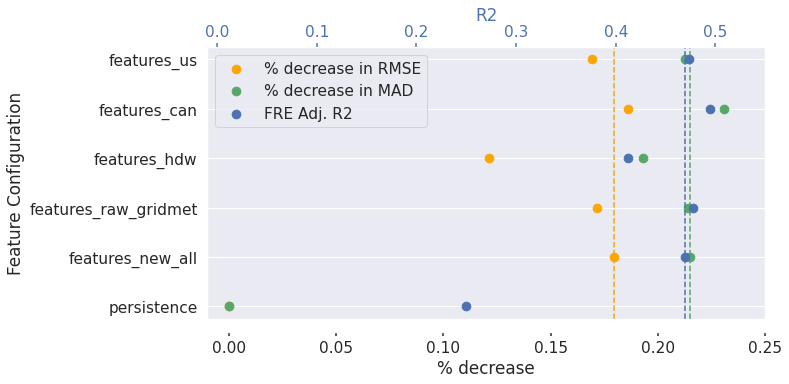

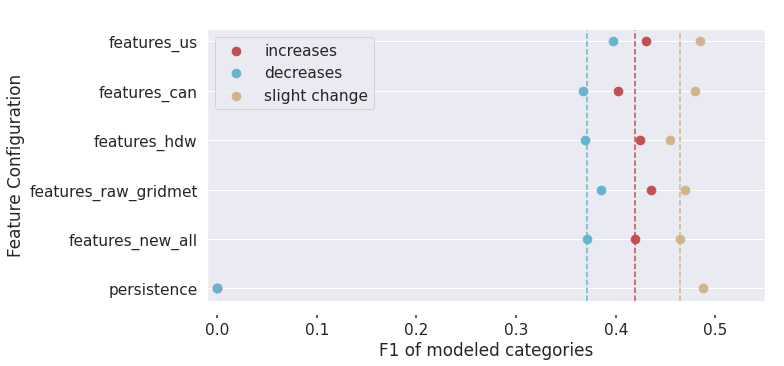

In [60]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 
                     'features_raw_gridmet',
                     'features_hdw',
                     'features_can',
                     'features_us']

df_error_metrics_rf = pd.DataFrame(index=feature_set_names, 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',

                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])
#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_fre'] = data_test_2020['FRE_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfre'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_fre'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_fre = summarize_error(data_test_2020,'FRE', 'FRE_1', ['persistence'])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'log_FRE_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_fre = summarize_error(data_test_2020,'FRE', 'rf_'+feature_set_names[ii]+'_fre',feature_subsets[feature_set_names[ii]])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'rf_'+feature_set_names[ii]+'_logfre',feature_subsets[feature_set_names[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf',feature_subsets[feature_set_names[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_logsf',feature_subsets[feature_set_names[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics_rf.loc[feature_set_names[ii],['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
    df_error_metrics_rf.loc[feature_set_names[ii],['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
    df_error_metrics_rf.loc[feature_set_names[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics_rf.loc[feature_set_names[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']
#persistence

df_error_metrics_rf['percent_change_FRE_RMSE'] = (df_error_metrics_rf.loc['persistence','FRE_RMSE']-df_error_metrics_rf['FRE_RMSE'])/df_error_metrics_rf.loc['persistence','FRE_RMSE']
df_error_metrics_rf['percent_change_FRE_MAD'] = (df_error_metrics_rf.loc['persistence','FRE_MAD']-df_error_metrics_rf['FRE_MAD'])/df_error_metrics_rf.loc['persistence','FRE_MAD']


df_error_metrics_rf['percent_change_SF_RMSE'] = (df_error_metrics_rf.loc['persistence','SF_RMSE']-df_error_metrics_rf['SF_RMSE'])/df_error_metrics_rf.loc['persistence','SF_RMSE']
df_error_metrics_rf['percent_change_SF_MAD'] = (df_error_metrics_rf.loc['persistence','SF_MAD']-df_error_metrics_rf['SF_MAD'])/df_error_metrics_rf.loc['persistence','SF_MAD']


plot_frp_sensitivity_metrics(df_error_metrics_rf, feature_set_names,'features_new_all',(10,5))
plot_f1_sensitivity_metrics(df_error_metrics_rf, feature_set_names,'features_new_all',(10,5))

# Final Try at Optimal Subsets

In [31]:
#AUGUST 24th REDO

feature_subsets = {}

#all features
not_allowed=[]
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])


feature_subsets['features_raw_gridmet'] = ['vpd_gridmet', 'dvpd_gridmet',
                                           'wind_speed_gridmet','dwind_speed_gridmet',
                                           'hwp','dhwp',
                                           'PFT', 'dPFT', 
                                            'Blended_SM',  'FMCG2D', 'FMCGLH2D',
                                           'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_hdw'] = ['hd0w0', 'dhd1w0', 
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM',  'FMCG2D', 'FMCGLH2D','PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                    'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM',
                                   "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC",
                                   'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                  'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS','Moderate_N', 'DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

In [25]:
data_test_2020['obs_cat'] = pd.cut(data_test_2020['Log_Scaling_Factor'].values, 
                                            bins=[-10, -.18, .3, 10],
                                            labels=['decrease','no_change','increase'])
data_test_2020['persistence_cat']='no_change'

In [32]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw',
                     'features_can','features_us']

df_error_metrics_rf = pd.DataFrame(index=feature_set_names, 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',

                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])
#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_fre'] = data_test_2020['FRE_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfre'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_fre'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_fre = summarize_error(data_test_2020,'FRE', 'FRE_1', ['persistence'])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'log_FRE_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_fre = summarize_error(data_test_2020,'FRE', 'rf_'+feature_set_names[ii]+'_fre',feature_subsets[feature_set_names[ii]])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'rf_'+feature_set_names[ii]+'_logfre',feature_subsets[feature_set_names[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf',feature_subsets[feature_set_names[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_logsf',feature_subsets[feature_set_names[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics_rf.loc[feature_set_names[ii],['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
    df_error_metrics_rf.loc[feature_set_names[ii],['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
    df_error_metrics_rf.loc[feature_set_names[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics_rf.loc[feature_set_names[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']
#persistence

df_error_metrics_rf['percent_change_FRE_RMSE'] = (df_error_metrics_rf.loc['persistence','FRE_RMSE']-df_error_metrics_rf['FRE_RMSE'])/df_error_metrics_rf.loc['persistence','FRE_RMSE']
df_error_metrics_rf['percent_change_FRE_MAD'] = (df_error_metrics_rf.loc['persistence','FRE_MAD']-df_error_metrics_rf['FRE_MAD'])/df_error_metrics_rf.loc['persistence','FRE_MAD']


df_error_metrics_rf['percent_change_SF_RMSE'] = (df_error_metrics_rf.loc['persistence','SF_RMSE']-df_error_metrics_rf['SF_RMSE'])/df_error_metrics_rf.loc['persistence','SF_RMSE']
df_error_metrics_rf['percent_change_SF_MAD'] = (df_error_metrics_rf.loc['persistence','SF_MAD']-df_error_metrics_rf['SF_MAD'])/df_error_metrics_rf.loc['persistence','SF_MAD']

features_new_all OOB R2 score is: 0.2201062444195574
features_raw_gridmet OOB R2 score is: 0.23146492764162063
features_hdw OOB R2 score is: 0.170855635434234
features_can OOB R2 score is: 0.18956651873359298
features_us OOB R2 score is: 0.20004444985173897
DOING PERSISTENCE


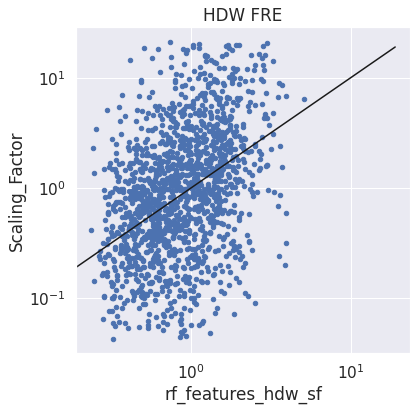

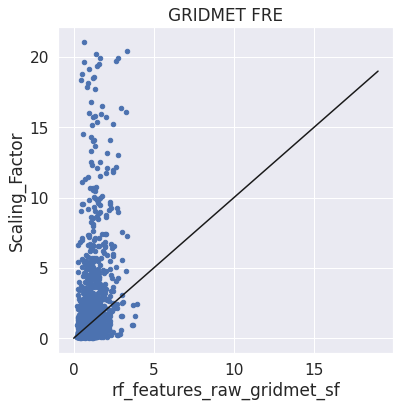

Text(0.5, 1.0, 'RF')

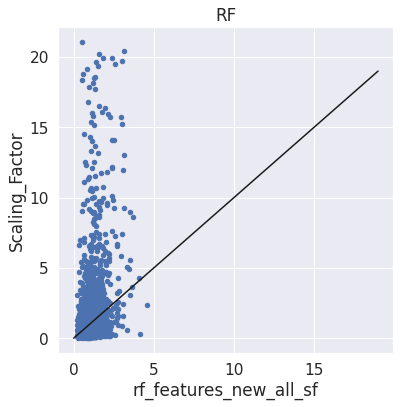

In [77]:
xx = np.arange(0,20, 1)
fig,ax=plt.subplots(figsize=(6,6))
data_test_2020.plot.scatter(x='rf_features_hdw_sf', y='Scaling_Factor',color='b',ax=ax)
ax.plot(xx,xx,'k')
plt.xscale('log')
plt.yscale('log')
plt.title('HDW FRE')
plt.show()

fig,ax=plt.subplots(figsize=(6,6))
data_test_2020.plot.scatter(x='rf_features_raw_gridmet_sf', y='Scaling_Factor',color='b',ax=ax)
ax.plot(xx,xx,'k')
#plt.xscale('log')
#plt.yscale('log')
plt.title('GRIDMET FRE')
plt.show()

fig,ax=plt.subplots(figsize=(6,6))
data_test_2020.plot.scatter(x='rf_features_new_all_sf', y='Scaling_Factor',color='b',ax=ax)
ax.plot(xx,xx,'k')
#plt.xscale('log')
#plt.yscale('log')
plt.title('RF') 

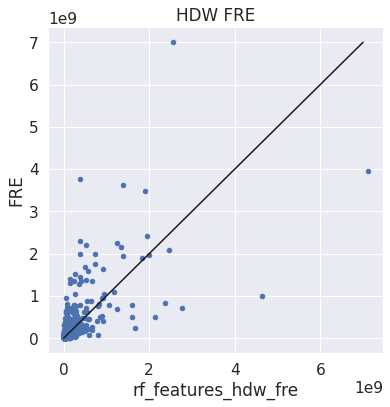

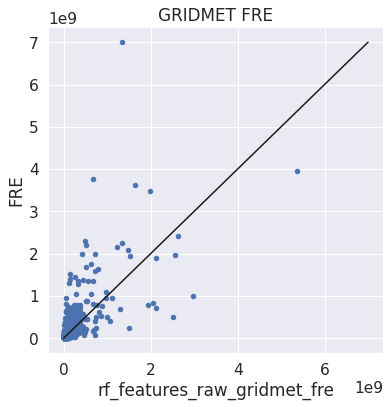

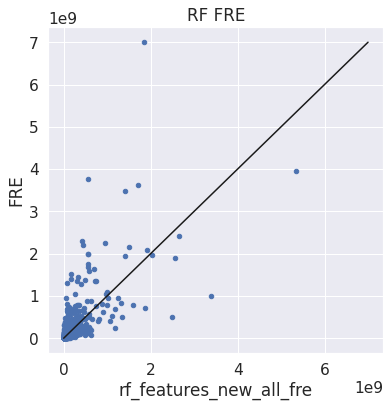

In [71]:
xx = np.linspace(0,7e9, 100)
fig,ax=plt.subplots(figsize=(6,6))
data_test_2020.plot.scatter(x='rf_features_hdw_fre', y='FRE',color='b',ax=ax)
ax.plot(xx,xx,'k')
#plt.xscale('log')
#plt.yscale('log')
plt.title('HDW FRE')
plt.show()

fig,ax=plt.subplots(figsize=(6,6))
data_test_2020.plot.scatter(x='rf_features_raw_gridmet_fre', y='FRE',color='b',ax=ax)
ax.plot(xx,xx,'k')
#plt.xscale('log')
#plt.yscale('log')
plt.title('GRIDMET FRE')
plt.show()

fig,ax=plt.subplots(figsize=(6,6))
data_test_2020.plot.scatter(x='rf_features_new_all_fre', y='FRE',color='b',ax=ax)
ax.plot(xx,xx,'k')
#plt.xscale('log')
#plt.yscale('log')
plt.title('RF FRE')
plt.show()

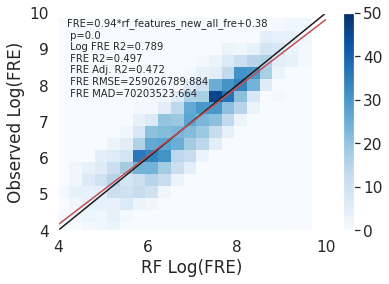

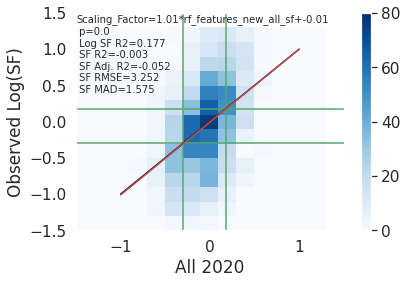

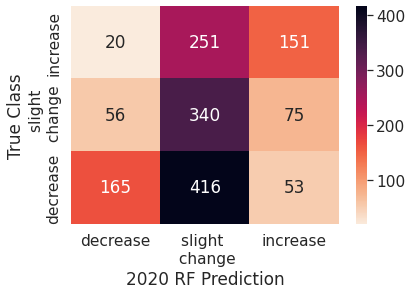

              precision    recall  f1-score   support

    decrease       0.68      0.26      0.38       634
    increase       0.54      0.36      0.43       422
   no_change       0.34      0.72      0.46       471

    accuracy                           0.43      1527
   macro avg       0.52      0.45      0.42      1527
weighted avg       0.54      0.43      0.42      1527



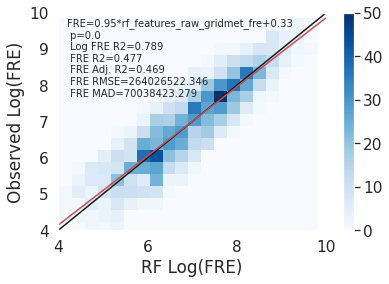

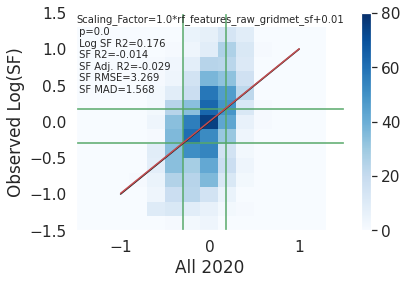

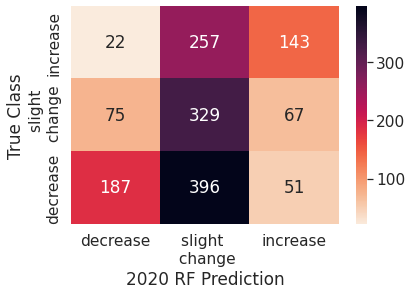

              precision    recall  f1-score   support

    decrease       0.66      0.29      0.41       634
    increase       0.55      0.34      0.42       422
   no_change       0.34      0.70      0.45       471

    accuracy                           0.43      1527
   macro avg       0.51      0.44      0.43      1527
weighted avg       0.53      0.43      0.42      1527



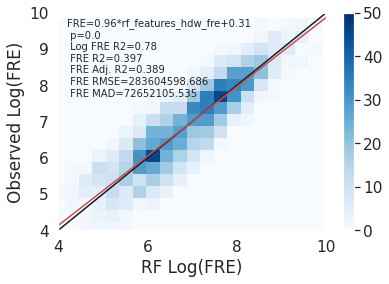

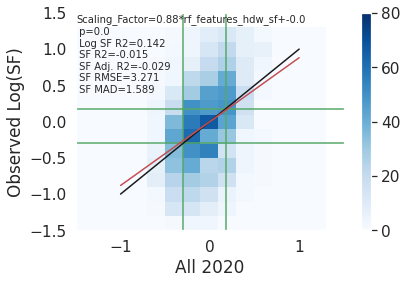

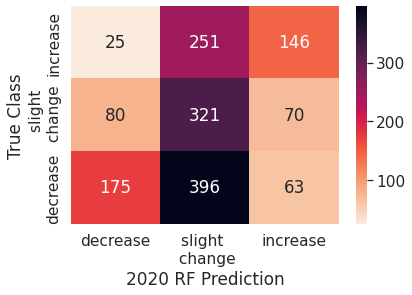

              precision    recall  f1-score   support

    decrease       0.62      0.28      0.38       634
    increase       0.52      0.35      0.42       422
   no_change       0.33      0.68      0.45       471

    accuracy                           0.42      1527
   macro avg       0.49      0.43      0.42      1527
weighted avg       0.51      0.42      0.41      1527



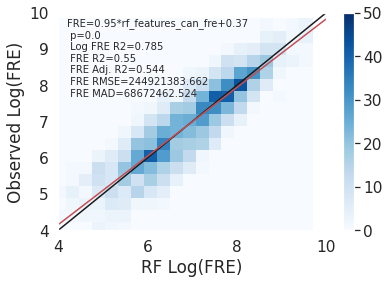

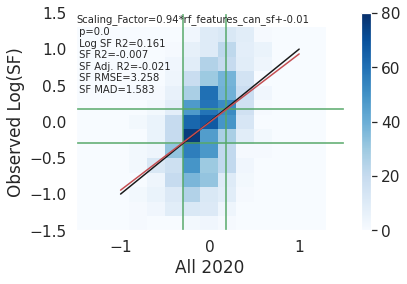

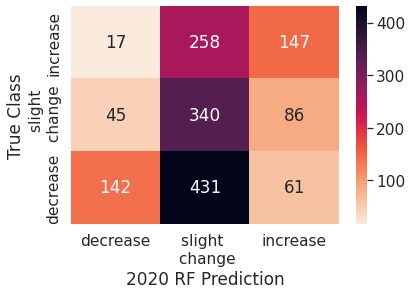

              precision    recall  f1-score   support

    decrease       0.70      0.22      0.34       634
    increase       0.50      0.35      0.41       422
   no_change       0.33      0.72      0.45       471

    accuracy                           0.41      1527
   macro avg       0.51      0.43      0.40      1527
weighted avg       0.53      0.41      0.39      1527



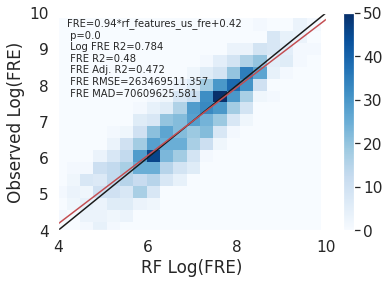

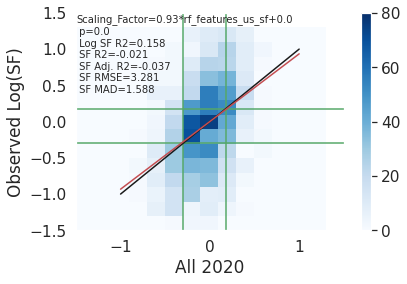

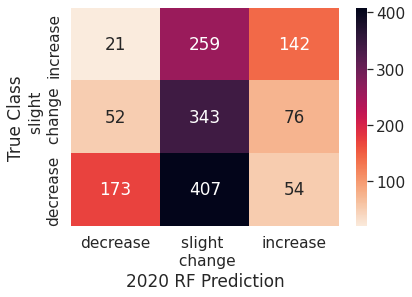

              precision    recall  f1-score   support

    decrease       0.70      0.27      0.39       634
    increase       0.52      0.34      0.41       422
   no_change       0.34      0.73      0.46       471

    accuracy                           0.43      1527
   macro avg       0.52      0.45      0.42      1527
weighted avg       0.54      0.43      0.42      1527



In [32]:
# Plotting
for ii in range(1,len(feature_set_names)):

    frp_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_fre', 'FRE','rf_'+feature_set_names[ii]+'_logfre', 'log_FRE', 'Blues', 0, 50,'RF Log(FRE)',feature_subsets[feature_set_names[ii]])
    
    sf_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_sf', 'Scaling_Factor','rf_'+feature_set_names[ii]+'_logsf', 'Log_Scaling_Factor','Blues',0,80, -.3, .18, 'All 2020',feature_subsets[feature_set_names[ii]])
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+feature_set_names[ii]+'_cat', '2020 RF Prediction')  


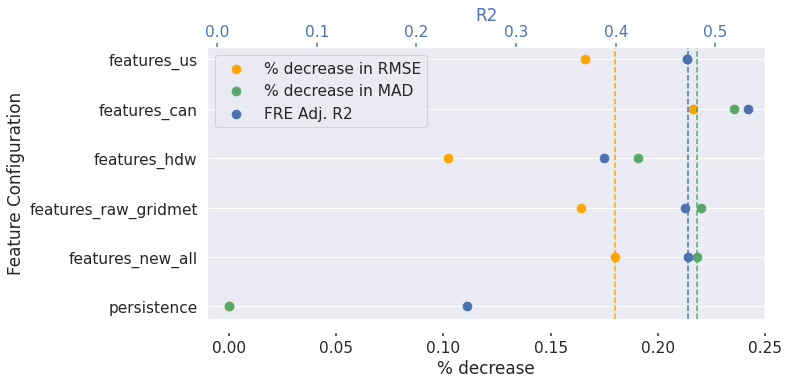

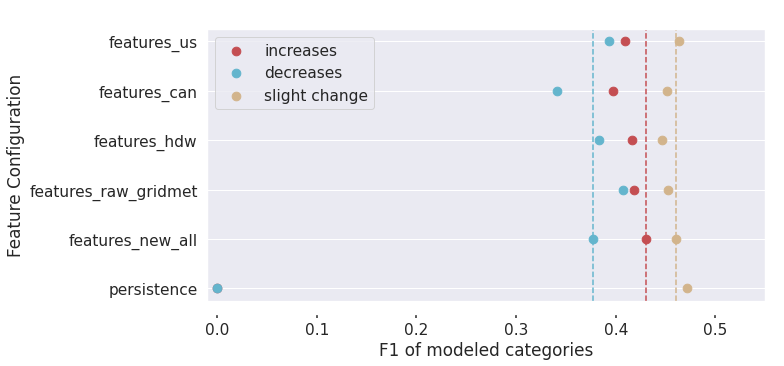

In [33]:
opt_subsets = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw',
                     'features_can','features_us']


plot_frp_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all',(10,5))
plot_f1_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all',(10,5))
#print(df_error_metrics.dtypes)
#print(df_error_metrics_rf[['FRE_R2_adj','percent_change_FRE_RMSE','percent_change_FRE_MAD',
#                           'increase_f1','decrease_f1','no_change_f1']].round(2))
df_error_metrics_rf.to_csv('error_fig3.csv')

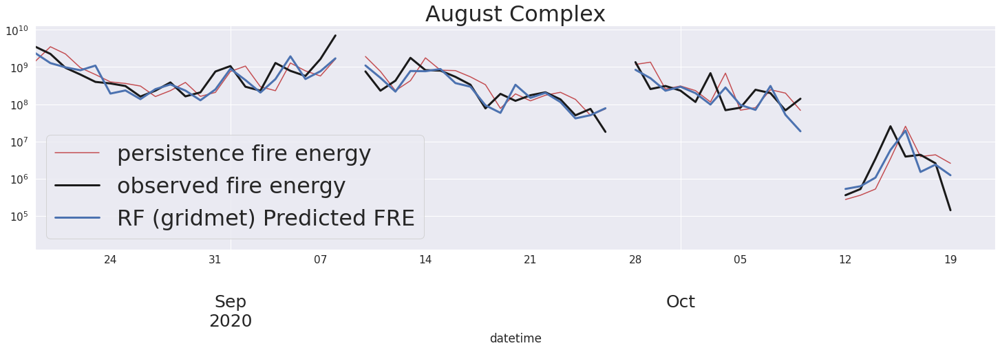

In [156]:
fire_names = ['August Complex']#,'Williams Flats', 'Dixie']

fire = data_test_2020[data_test_2020['irwinID']==test_irwin_ids[0]]
fire_plot = fire.set_index('datetime').resample('D').asfreq() #plot resampled to daily, will have gaps, ok!
    
#print(len(features_plot_timeseries)) 

fig, ax = plt.subplots(figsize=(25, 6))
fire_plot.plot(y=['FRE_1'],label=['persistence fire energy'], style='r-',alpha=1, ax=ax)
fire_plot.plot(y=['FRE'],label=['observed fire energy'],style=['k-'],linewidth=3, ax=ax)
#fire_plot.plot(y=['rf_features_new_all_fre'],label=['RF Predicted FRE'],style=['b-'],linewidth=3, ax=ax)
fire_plot.plot(y=['rf_features_raw_gridmet_fre'],label=['RF (gridmet) Predicted FRE'],style=['b-'],linewidth=3, ax=ax)

ax.set_yscale('log')
ax.legend(loc='lower left', fontsize=32)
plt.xticks(fontsize=25)
plt.title(fire_names[0],fontsize=32)
plt.show()



# First Try at optimal subsets (8/25) 
We were maximizing R2, which is sensitive to large values

Based on the baseline RF that has heatwave and updated HWP

In [38]:
feature_subsets = {}

#all features
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])


feature_subsets['features_raw_gridmet'] = ['vpd_gridmet', 'dvpd_gridmet','wind_speed_gridmet','dwind_speed_gridmet',
                                           'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]
feature_subsets['features_hdw'] = ['hd1w0', 'dhd1w0', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_hwp'] = ['hwp', 'dhwp', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]


feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                   'PFT', 'dPFT', 
                                    'IMERG.FINAL.v6_FFMC','IMERG.FINAL.v6_DMC', 'IMERG.FINAL.v6_DC',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_can_smops'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                   'PFT', 'dPFT', 
                                    'Blended_SM',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                   'PFT', 'dPFT', 
                                'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_us_nofm'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                   'PFT', 'dPFT', 
                                'Blended_SM',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

# First Try at optimal subsets
We were maximizing R2, which is sensitive to large values

In [ ]:
feature_subsets = {}

#all features
not_allowed = []
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_hdw'] = ['hd1w0', 'dhd1w0', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRE_1' ]
feature_subsets['features_hwp'] = ['hwp', 'dhwp', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRE_1' ]

feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                   'PFT', 'dPFT', 
                                    'IMERG.FINAL.v6_FFMC','IMERG.FINAL.v6_DMC', 'IMERG.FINAL.v6_DC',
                                   'PWS', 'Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRE_1' ]

feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                   'PFT', 'dPFT', 
                                'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS', 'Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRE_1' ]

In [96]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw','features_hwp',
                     'features_can','features_can_smops','features_us','features_us_nofm']


df_error_metrics_rf = pd.DataFrame(index=feature_set_names, 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',

                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])
#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_fre'] = data_test_2020['FRE_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfre'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_fre'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_fre = summarize_error(data_test_2020,'FRE', 'FRE_1', ['persistence'])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'log_FRE_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_fre = summarize_error(data_test_2020,'FRE', 'rf_'+feature_set_names[ii]+'_fre',feature_subsets[feature_set_names[ii]])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'rf_'+feature_set_names[ii]+'_logfre',feature_subsets[feature_set_names[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf',feature_subsets[feature_set_names[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_logsf',feature_subsets[feature_set_names[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics_rf.loc[feature_set_names[ii],['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
    df_error_metrics_rf.loc[feature_set_names[ii],['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
    df_error_metrics_rf.loc[feature_set_names[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics_rf.loc[feature_set_names[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']
#persistence

df_error_metrics_rf['percent_change_FRE_RMSE'] = (df_error_metrics_rf.loc['persistence','FRE_RMSE']-df_error_metrics_rf['FRE_RMSE'])/df_error_metrics_rf.loc['persistence','FRE_RMSE']
df_error_metrics_rf['percent_change_FRE_MAD'] = (df_error_metrics_rf.loc['persistence','FRE_MAD']-df_error_metrics_rf['FRE_MAD'])/df_error_metrics_rf.loc['persistence','FRE_MAD']


df_error_metrics_rf['percent_change_SF_RMSE'] = (df_error_metrics_rf.loc['persistence','SF_RMSE']-df_error_metrics_rf['SF_RMSE'])/df_error_metrics_rf.loc['persistence','SF_RMSE']
df_error_metrics_rf['percent_change_SF_MAD'] = (df_error_metrics_rf.loc['persistence','SF_MAD']-df_error_metrics_rf['SF_MAD'])/df_error_metrics_rf.loc['persistence','SF_MAD']

    

features_new_all OOB R2 score is: 0.20762113799237103
features_raw_gridmet OOB R2 score is: 0.17286387819968618
features_hdw OOB R2 score is: 0.1362392528638695
features_hwp OOB R2 score is: 0.15886353908583806
features_can OOB R2 score is: 0.12305497669529086
features_can_smops OOB R2 score is: 0.1214929295866608
features_us OOB R2 score is: 0.15420999510773692
features_us_nofm OOB R2 score is: 0.1507984863137608
DOING PERSISTENCE


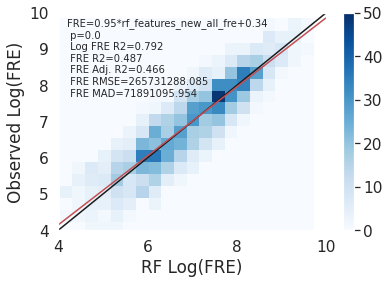

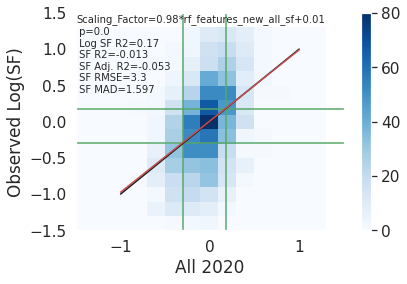

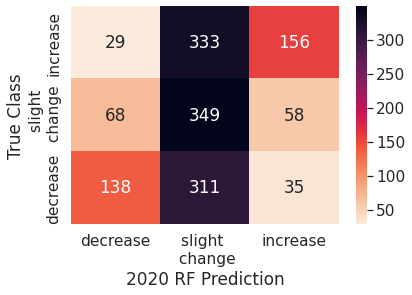

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.38       484
    increase       0.63      0.30      0.41       518
   no_change       0.35      0.73      0.48       475

    accuracy                           0.44      1477
   macro avg       0.52      0.44      0.42      1477
weighted avg       0.53      0.44      0.42      1477



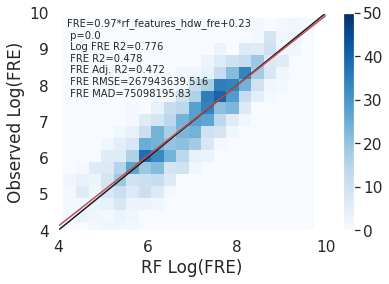

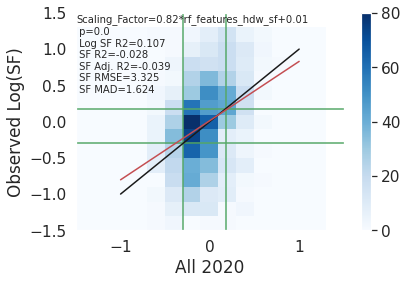

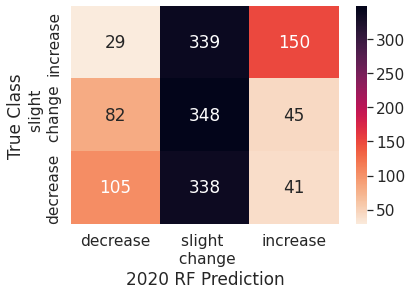

              precision    recall  f1-score   support

    decrease       0.49      0.22      0.30       484
    increase       0.64      0.29      0.40       518
   no_change       0.34      0.73      0.46       475

    accuracy                           0.41      1477
   macro avg       0.49      0.41      0.39      1477
weighted avg       0.49      0.41      0.39      1477



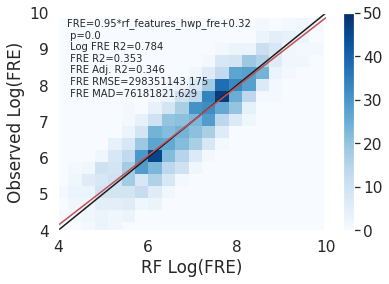

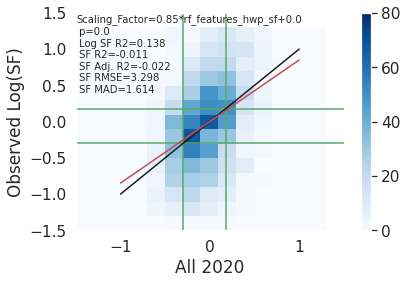

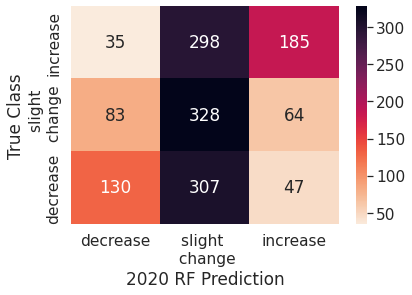

              precision    recall  f1-score   support

    decrease       0.52      0.27      0.36       484
    increase       0.62      0.36      0.45       518
   no_change       0.35      0.69      0.47       475

    accuracy                           0.44      1477
   macro avg       0.50      0.44      0.43      1477
weighted avg       0.50      0.44      0.43      1477



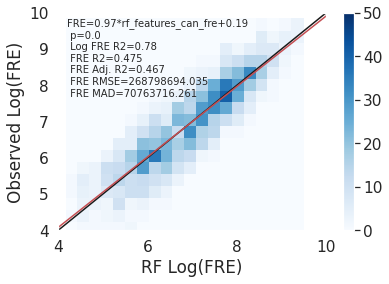

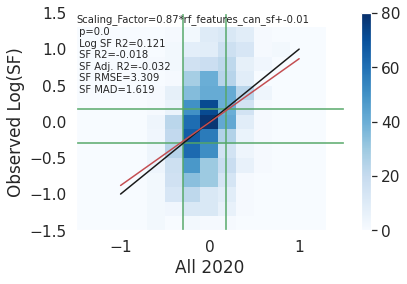

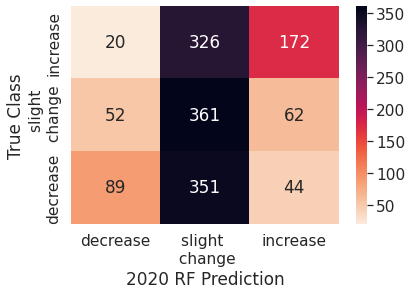

              precision    recall  f1-score   support

    decrease       0.55      0.18      0.28       484
    increase       0.62      0.33      0.43       518
   no_change       0.35      0.76      0.48       475

    accuracy                           0.42      1477
   macro avg       0.51      0.43      0.40      1477
weighted avg       0.51      0.42      0.40      1477



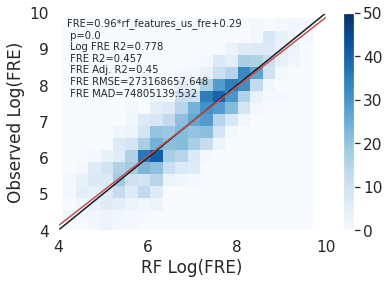

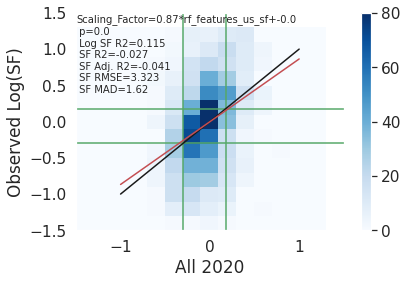

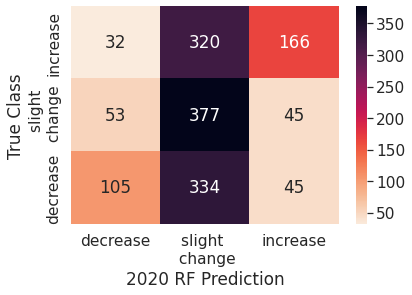

              precision    recall  f1-score   support

    decrease       0.55      0.22      0.31       484
    increase       0.65      0.32      0.43       518
   no_change       0.37      0.79      0.50       475

    accuracy                           0.44      1477
   macro avg       0.52      0.44      0.41      1477
weighted avg       0.53      0.44      0.41      1477



In [50]:
# Plotting
for ii in range(1,len(feature_set_names)):

    frp_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_fre', 'FRE','rf_'+feature_set_names[ii]+'_logfre', 'log_FRE', 'Blues', 0, 50,'RF Log(FRE)',feature_subsets[feature_set_names[ii]])
    
    sf_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_sf', 'Scaling_Factor','rf_'+feature_set_names[ii]+'_logsf', 'Log_Scaling_Factor','Blues',0,80, -.3, .18, 'All 2020',feature_subsets[feature_set_names[ii]])
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+feature_set_names[ii]+'_cat', '2020 RF Prediction')  



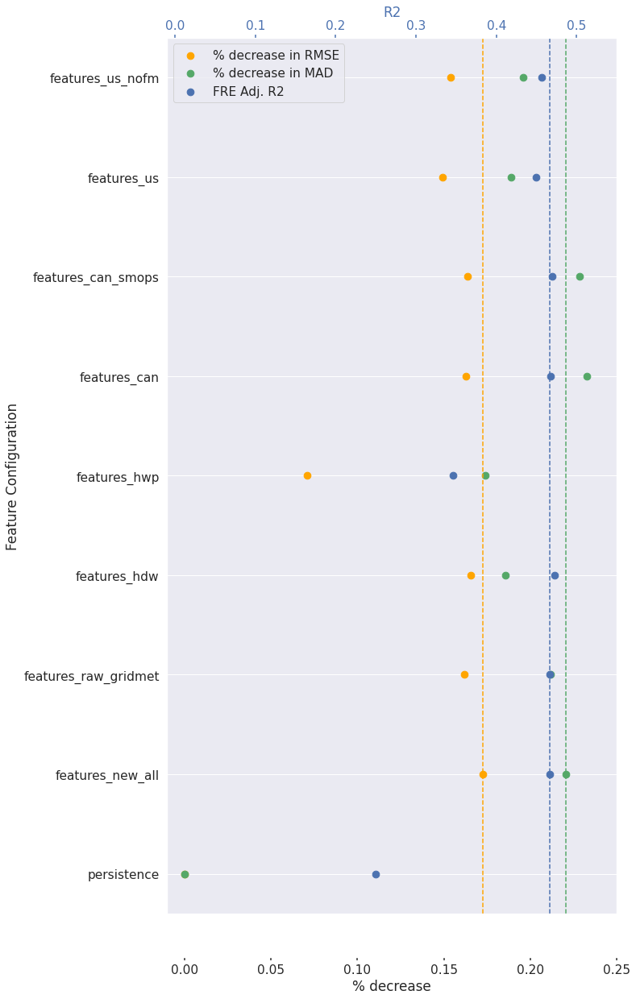

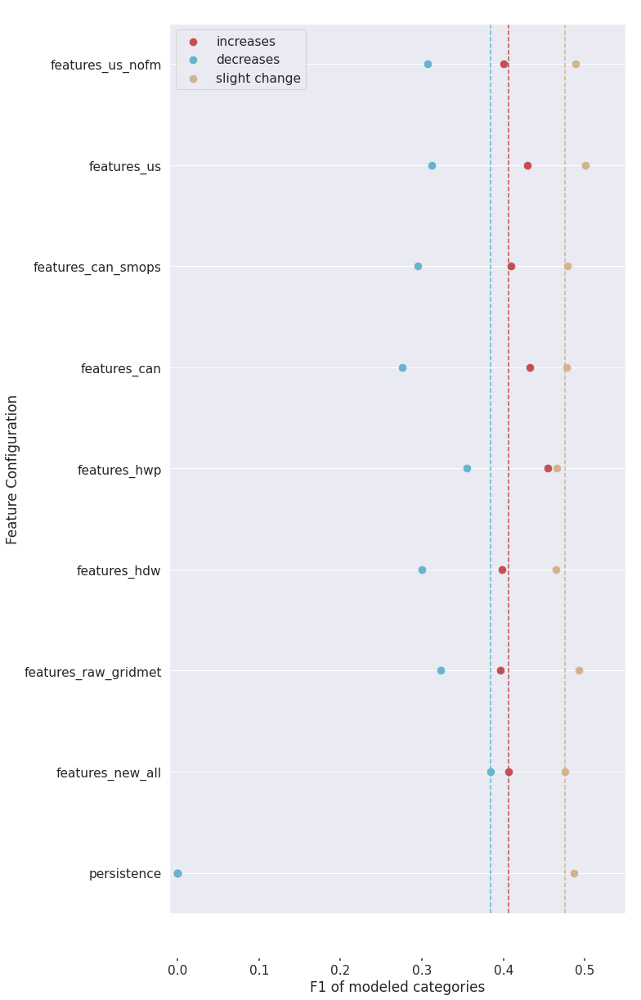

In [97]:
opt_subsets = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw','features_hwp',
                     'features_can','features_can_smops','features_us','features_us_nofm']

plot_frp_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all')
plot_f1_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all')
#plot_recall_sensitivity_metrics(df_error_metrics, opt_subsets)   
#plot_precision_sensitivity_metrics(df_error_metrics, opt_subsets)

## Try #2 at optimal subsets

In [ ]:
#ORIGINAL

feature_subsets = {}

#all features
not_allowed = []
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_can'] = ['hwp','dhwp',
                                    'IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                    'IMERG.FINAL.v6_FFMC','IMERG.FINAL.v6_DMC', 'IMERG.FINAL.v6_DC',
                                    'Moderate_N',
                                   "MEAN_SLOPE", "STD_SLOPE",
                                   "DOY",
                                   'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRE_1' ]

feature_subsets['features_hdw_hwp'] = ['hd1w0', 'dhd1w0', 'hwp','dhwp',
                                    'Blended_SM','Moderate_N',
                                   "MEAN_SLOPE", "STD_SLOPE",
                                       'DOY',
                                       'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRE_1' ]

In [59]:
#AUGUST 24th REDO

feature_subsets = {}

#all features
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])


feature_subsets['features_raw_gridmet'] = ['vpd_gridmet', 'dvpd_gridmet',
                                           'wind_speed_gridmet','dwind_speed_gridmet',
                                           'hwp','dhwp',
                                           'PFT', 'dPFT', 
                                    'Blended_SM',  'FMCG2D', 'FMCGLH2D','PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]
feature_subsets['features_hdw'] = ['hd0w0', 'dhd1w0', 
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM',  'FMCG2D', 'FMCGLH2D','PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_hwp'] = ['hwp', 'dhwp', 
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM',  'FMCG2D', 'FMCGLH2D','PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]


feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'IMERG.FINAL.v6_FFMC','IMERG.FINAL.v6_DMC', 'IMERG.FINAL.v6_DC',  'FMCG2D', 'FMCGLH2D',
                                   'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_can_smops'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                         'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM', 'FMCG2D', 'FMCGLH2D',
                                   'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                  'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

feature_subsets['features_us_nofm'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                       'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                'Blended_SM',
                                   'PWS','Moderate_N','DOY',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                   'FRE_1' ]

In [60]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw','features_hwp',
                     'features_can','features_can_smops','features_us','features_us_nofm']

df_error_metrics_rf = pd.DataFrame(index=feature_set_names, 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',

                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])
#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_fre'] = data_test_2020['FRE_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfre'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_fre'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_fre = summarize_error(data_test_2020,'FRE', 'FRE_1', ['persistence'])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'log_FRE_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_fre = summarize_error(data_test_2020,'FRE', 'rf_'+feature_set_names[ii]+'_fre',feature_subsets[feature_set_names[ii]])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'rf_'+feature_set_names[ii]+'_logfre',feature_subsets[feature_set_names[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf',feature_subsets[feature_set_names[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_logsf',feature_subsets[feature_set_names[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics_rf.loc[feature_set_names[ii],['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
    df_error_metrics_rf.loc[feature_set_names[ii],['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
    df_error_metrics_rf.loc[feature_set_names[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics_rf.loc[feature_set_names[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']
#persistence

df_error_metrics_rf['percent_change_FRE_RMSE'] = (df_error_metrics_rf.loc['persistence','FRE_RMSE']-df_error_metrics_rf['FRE_RMSE'])/df_error_metrics_rf.loc['persistence','FRE_RMSE']
df_error_metrics_rf['percent_change_FRE_MAD'] = (df_error_metrics_rf.loc['persistence','FRE_MAD']-df_error_metrics_rf['FRE_MAD'])/df_error_metrics_rf.loc['persistence','FRE_MAD']


df_error_metrics_rf['percent_change_SF_RMSE'] = (df_error_metrics_rf.loc['persistence','SF_RMSE']-df_error_metrics_rf['SF_RMSE'])/df_error_metrics_rf.loc['persistence','SF_RMSE']
df_error_metrics_rf['percent_change_SF_MAD'] = (df_error_metrics_rf.loc['persistence','SF_MAD']-df_error_metrics_rf['SF_MAD'])/df_error_metrics_rf.loc['persistence','SF_MAD']

    

features_new_all OOB R2 score is: 0.20762113799237103
features_raw_gridmet OOB R2 score is: 0.22855132162433833
features_hdw OOB R2 score is: 0.17357292570622052
features_hwp OOB R2 score is: 0.166620922152648
features_can OOB R2 score is: 0.1878301284483661
features_can_smops OOB R2 score is: 0.18847753491277763
features_us OOB R2 score is: 0.18738829769282206
features_us_nofm OOB R2 score is: 0.18781548452182484
DOING PERSISTENCE


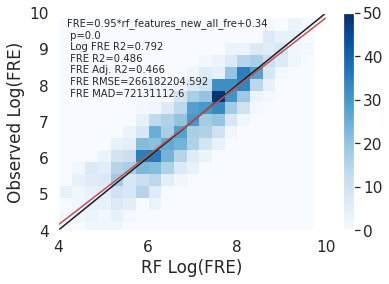

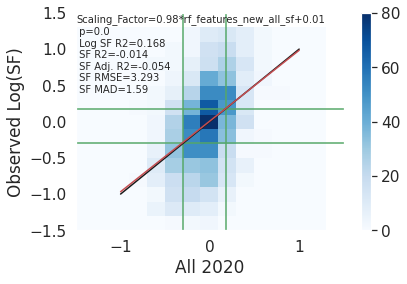

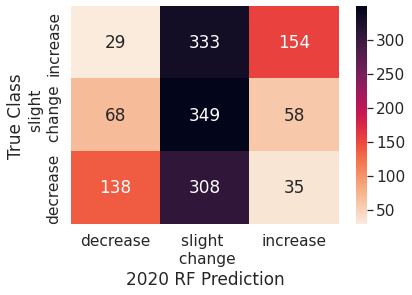

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.39       481
    increase       0.62      0.30      0.40       516
   no_change       0.35      0.73      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.44      0.42      1472



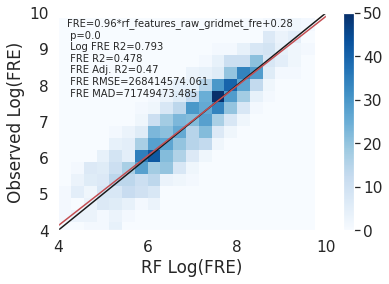

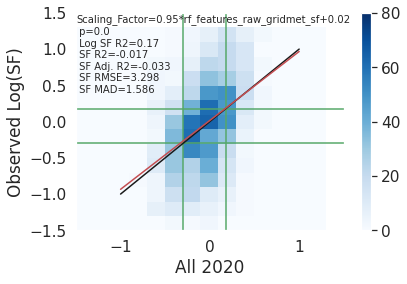

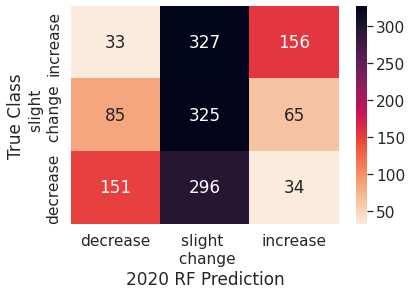

              precision    recall  f1-score   support

    decrease       0.56      0.31      0.40       481
    increase       0.61      0.30      0.40       516
   no_change       0.34      0.68      0.46       475

    accuracy                           0.43      1472
   macro avg       0.51      0.43      0.42      1472
weighted avg       0.51      0.43      0.42      1472



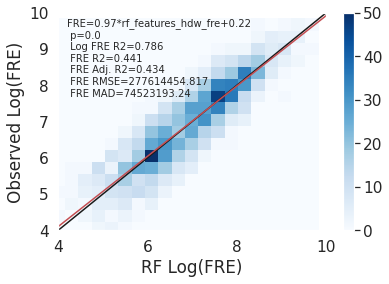

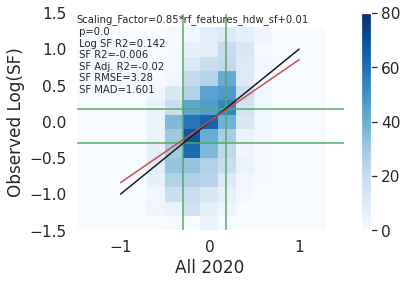

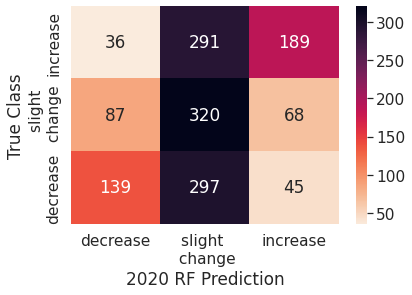

              precision    recall  f1-score   support

    decrease       0.53      0.29      0.37       481
    increase       0.63      0.37      0.46       516
   no_change       0.35      0.67      0.46       475

    accuracy                           0.44      1472
   macro avg       0.50      0.44      0.43      1472
weighted avg       0.51      0.44      0.43      1472



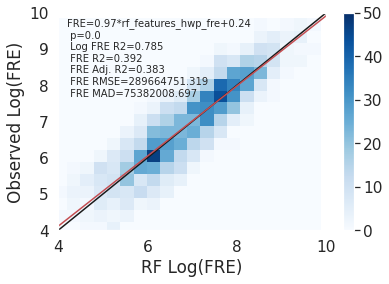

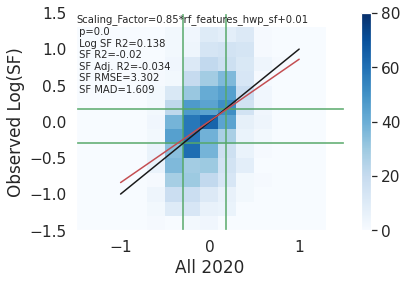

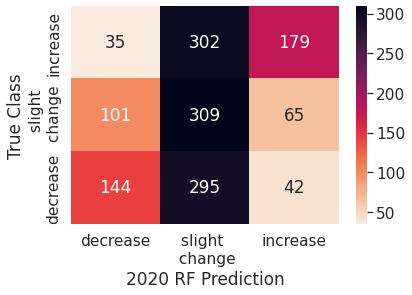

              precision    recall  f1-score   support

    decrease       0.51      0.30      0.38       481
    increase       0.63      0.35      0.45       516
   no_change       0.34      0.65      0.45       475

    accuracy                           0.43      1472
   macro avg       0.49      0.43      0.42      1472
weighted avg       0.50      0.43      0.42      1472



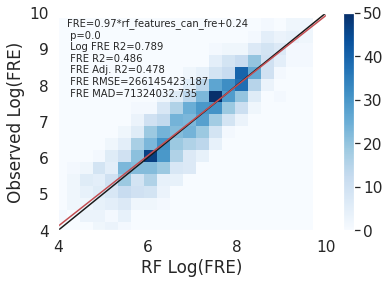

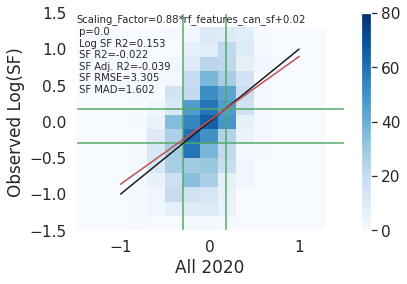

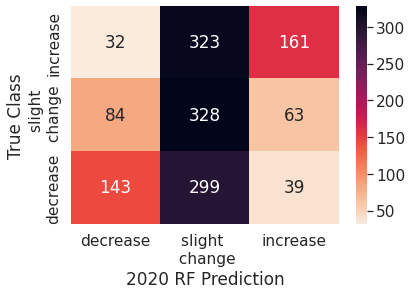

              precision    recall  f1-score   support

    decrease       0.55      0.30      0.39       481
    increase       0.61      0.31      0.41       516
   no_change       0.35      0.69      0.46       475

    accuracy                           0.43      1472
   macro avg       0.50      0.43      0.42      1472
weighted avg       0.51      0.43      0.42      1472



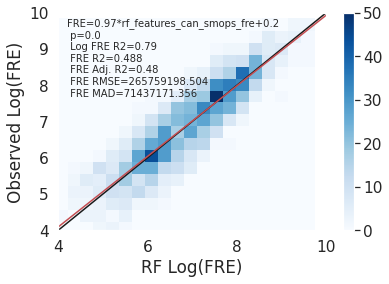

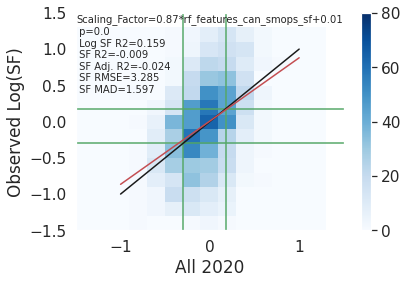

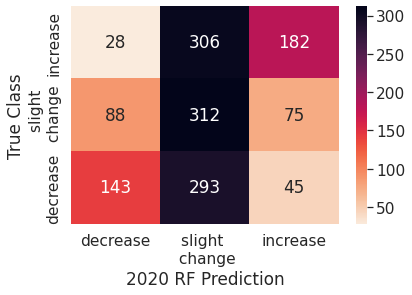

              precision    recall  f1-score   support

    decrease       0.55      0.30      0.39       481
    increase       0.60      0.35      0.44       516
   no_change       0.34      0.66      0.45       475

    accuracy                           0.43      1472
   macro avg       0.50      0.44      0.43      1472
weighted avg       0.50      0.43      0.43      1472



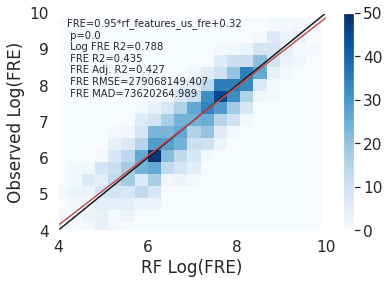

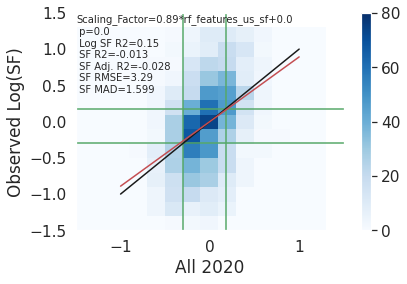

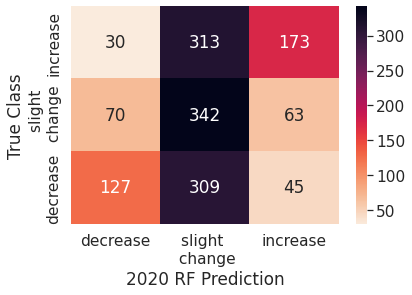

              precision    recall  f1-score   support

    decrease       0.56      0.26      0.36       481
    increase       0.62      0.34      0.43       516
   no_change       0.35      0.72      0.48       475

    accuracy                           0.44      1472
   macro avg       0.51      0.44      0.42      1472
weighted avg       0.51      0.44      0.42      1472



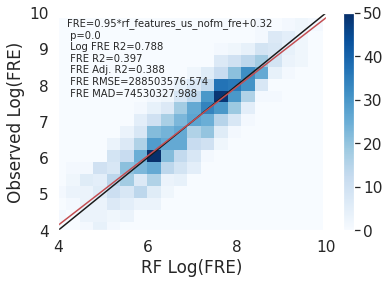

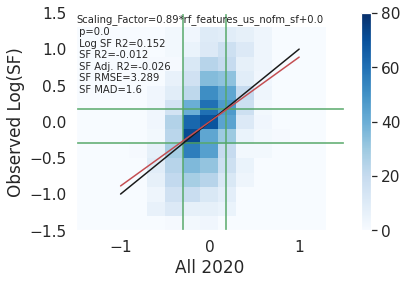

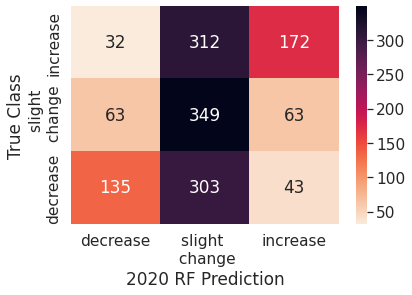

              precision    recall  f1-score   support

    decrease       0.59      0.28      0.38       481
    increase       0.62      0.33      0.43       516
   no_change       0.36      0.73      0.49       475

    accuracy                           0.45      1472
   macro avg       0.52      0.45      0.43      1472
weighted avg       0.53      0.45      0.43      1472



In [57]:
# Plotting
for ii in range(1,len(feature_set_names)):

    frp_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_fre', 'FRE','rf_'+feature_set_names[ii]+'_logfre', 'log_FRE', 'Blues', 0, 50,'RF Log(FRE)',feature_subsets[feature_set_names[ii]])
    
    sf_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_sf', 'Scaling_Factor','rf_'+feature_set_names[ii]+'_logsf', 'Log_Scaling_Factor','Blues',0,80, -.3, .18, 'All 2020',feature_subsets[feature_set_names[ii]])
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+feature_set_names[ii]+'_cat', '2020 RF Prediction')  



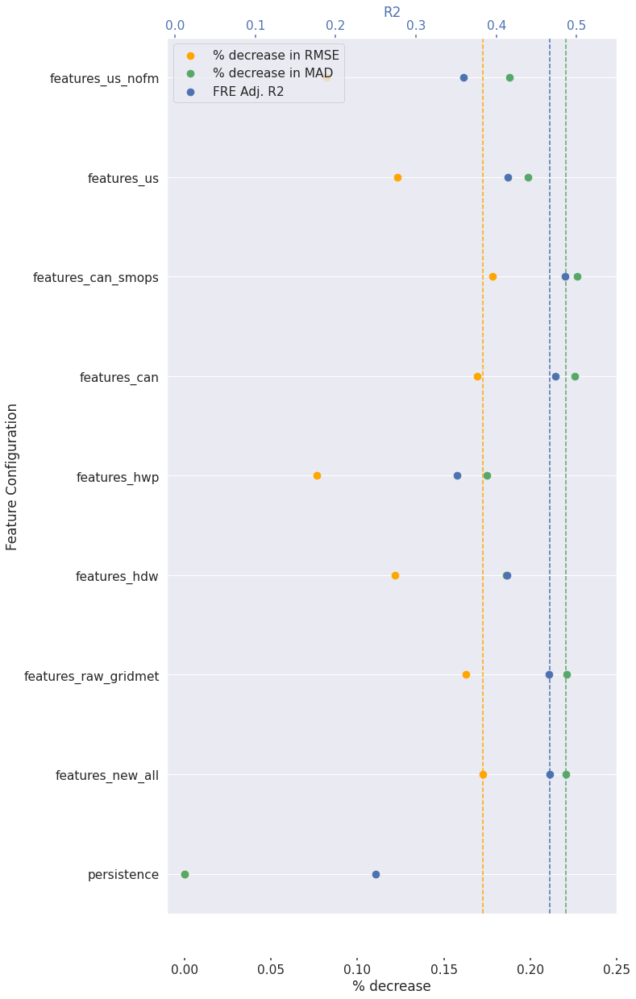

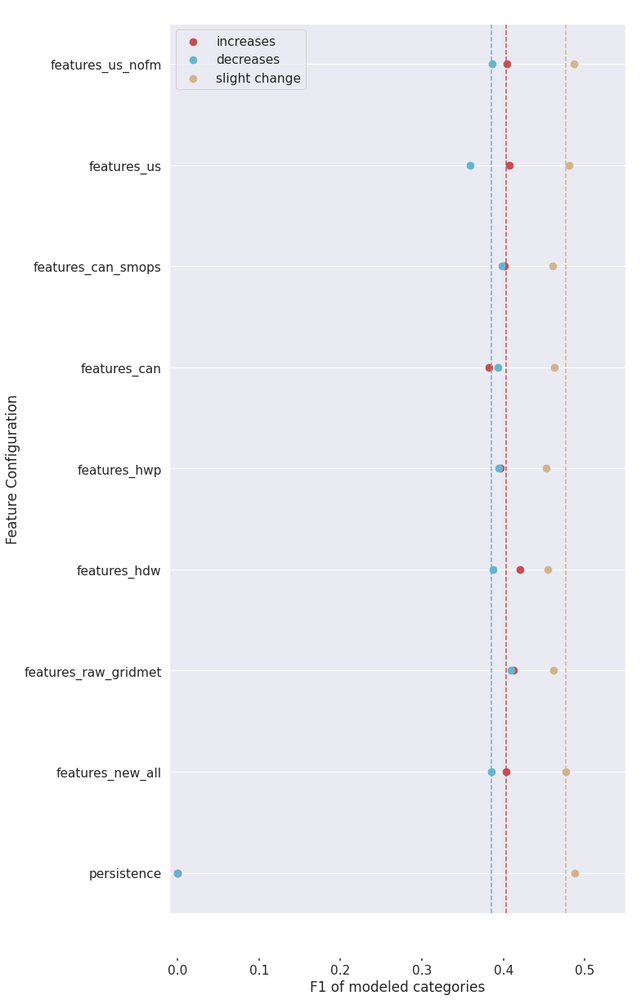

In [61]:
opt_subsets = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw','features_hwp',
                     'features_can','features_can_smops','features_us','features_us_nofm']


plot_frp_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all')
plot_f1_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all')


#  Try 3 at Optimal Subsets (with structures)

In [51]:
#AUGUST 24th REDO

feature_subsets = {}

#all features
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])


feature_subsets['features_raw_gridmet'] = ['vpd_gridmet', 'dvpd_gridmet',
                                           'wind_speed_gridmet','dwind_speed_gridmet',
                                           'hwp','dhwp',
                                           'PFT', 'dPFT', 
                                    'Blended_SM',  'FMCG2D', 'FMCGLH2D','PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                    "structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1",
                                   'FRE_1' ]
feature_subsets['features_hdw'] = ['hd0w0', 'dhd1w0', 
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM',  'FMCG2D', 'FMCGLH2D','PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                    "structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1",
                                   'FRE_1' ]

feature_subsets['features_hwp'] = ['hwp', 'dhwp', 
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM',  'FMCG2D', 'FMCGLH2D','PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                    "structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1",
                                   'FRE_1' ]


feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                   'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'IMERG.FINAL.v6_FFMC','IMERG.FINAL.v6_DMC', 'IMERG.FINAL.v6_DC',  'FMCG2D', 'FMCGLH2D',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                    "structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1",
                                   'FRE_1' ]

feature_subsets['features_can_smops'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                         'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                    'Blended_SM', 'FMCG2D', 'FMCGLH2D',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                    "structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1",
                                   'FRE_1' ]

feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                  'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                    "structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1",
                                   'FRE_1' ]

feature_subsets['features_us_nofm'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                       'hwp','dhwp',
                                   'PFT', 'dPFT', 
                                'Blended_SM',
                                   'PWS','Moderate_N',
                                   'MEAN_SLOPE', 'STD_SLOPE','POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','engine_personnel_1','engine_quantity_1',
                                    "structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1",
                                   'FRE_1' ]

In [52]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw','features_hwp',
                     'features_can','features_can_smops','features_us','features_us_nofm']

df_error_metrics_rf = pd.DataFrame(index=feature_set_names, 
                                columns=['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD',
                                         'log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',

                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])
#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_fre'] = data_test_2020['FRE_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfre'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_fre'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_fre = summarize_error(data_test_2020,'FRE', 'FRE_1', ['persistence'])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'log_FRE_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_fre = summarize_error(data_test_2020,'FRE', 'rf_'+feature_set_names[ii]+'_fre',feature_subsets[feature_set_names[ii]])
        errors_logfre = summarize_error(data_test_2020, 'log_FRE', 'rf_'+feature_set_names[ii]+'_logfre',feature_subsets[feature_set_names[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf',feature_subsets[feature_set_names[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_logsf',feature_subsets[feature_set_names[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics_rf.loc[feature_set_names[ii],['FRE_R2','FRE_R2_adj', 'FRE_RMSE', 'FRE_MAD']] = errors_fre
    df_error_metrics_rf.loc[feature_set_names[ii],['log_FRE_R2','log_FRE_R2_adj', 'log_FRE_RMSE', 'log_FRE_MAD']] = errors_logfre
    df_error_metrics_rf.loc[feature_set_names[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics_rf.loc[feature_set_names[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics_rf.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics_rf.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']
#persistence

df_error_metrics_rf['percent_change_FRE_RMSE'] = (df_error_metrics_rf.loc['persistence','FRE_RMSE']-df_error_metrics_rf['FRE_RMSE'])/df_error_metrics_rf.loc['persistence','FRE_RMSE']
df_error_metrics_rf['percent_change_FRE_MAD'] = (df_error_metrics_rf.loc['persistence','FRE_MAD']-df_error_metrics_rf['FRE_MAD'])/df_error_metrics_rf.loc['persistence','FRE_MAD']


df_error_metrics_rf['percent_change_SF_RMSE'] = (df_error_metrics_rf.loc['persistence','SF_RMSE']-df_error_metrics_rf['SF_RMSE'])/df_error_metrics_rf.loc['persistence','SF_RMSE']
df_error_metrics_rf['percent_change_SF_MAD'] = (df_error_metrics_rf.loc['persistence','SF_MAD']-df_error_metrics_rf['SF_MAD'])/df_error_metrics_rf.loc['persistence','SF_MAD']

    

features_new_all OOB R2 score is: 0.20762113799237103
features_raw_gridmet OOB R2 score is: 0.23041408907838667
features_hdw OOB R2 score is: 0.17449656595097618
features_hwp OOB R2 score is: 0.16019999872684987
features_can OOB R2 score is: 0.18779603218435392
features_can_smops OOB R2 score is: 0.1814847346559737
features_us OOB R2 score is: 0.1792517808256453
features_us_nofm OOB R2 score is: 0.18174379377605243
DOING PERSISTENCE


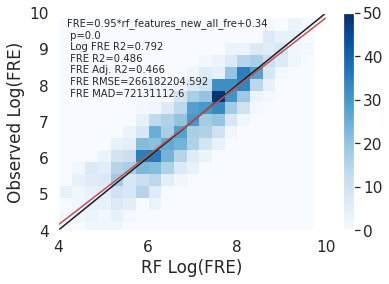

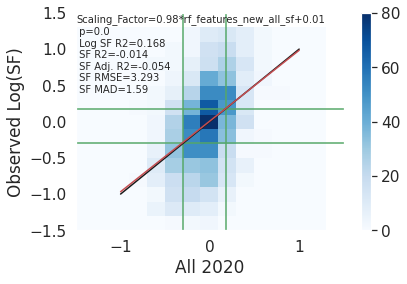

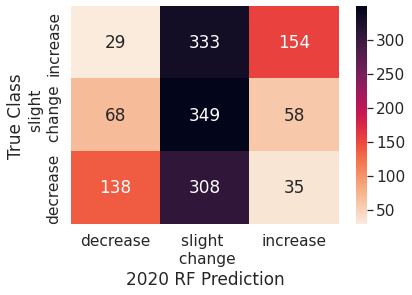

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.39       481
    increase       0.62      0.30      0.40       516
   no_change       0.35      0.73      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.44      0.42      1472



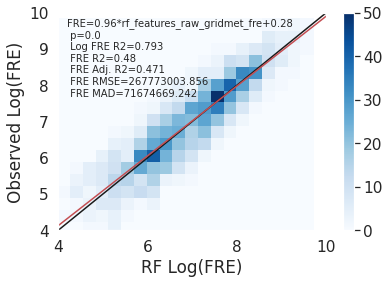

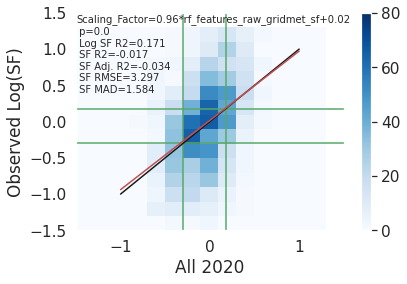

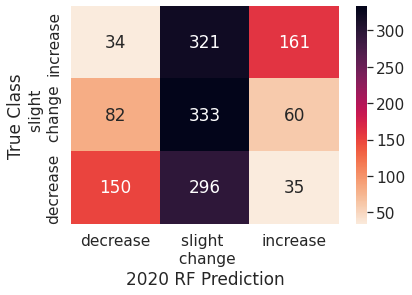

              precision    recall  f1-score   support

    decrease       0.56      0.31      0.40       481
    increase       0.63      0.31      0.42       516
   no_change       0.35      0.70      0.47       475

    accuracy                           0.44      1472
   macro avg       0.51      0.44      0.43      1472
weighted avg       0.52      0.44      0.43      1472



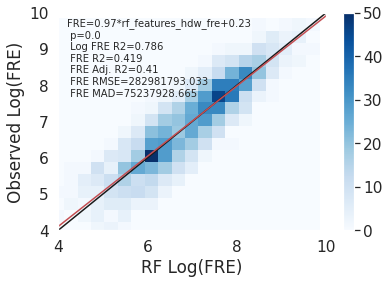

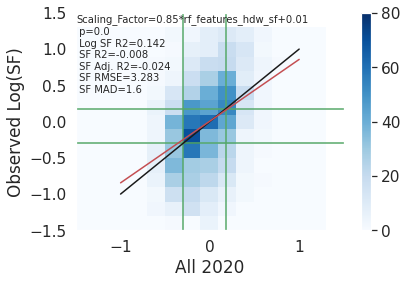

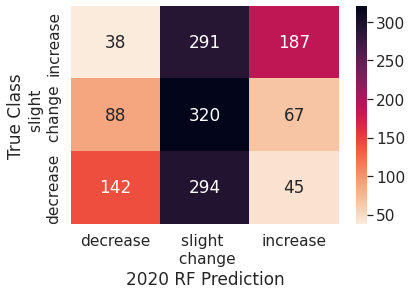

              precision    recall  f1-score   support

    decrease       0.53      0.30      0.38       481
    increase       0.63      0.36      0.46       516
   no_change       0.35      0.67      0.46       475

    accuracy                           0.44      1472
   macro avg       0.50      0.44      0.43      1472
weighted avg       0.51      0.44      0.43      1472



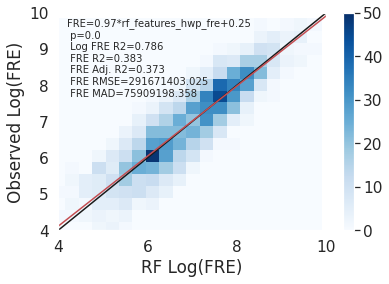

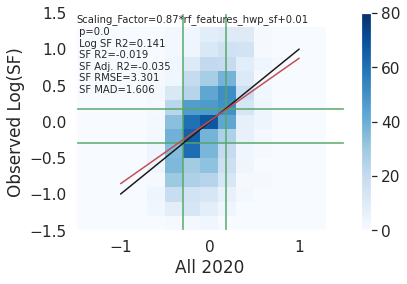

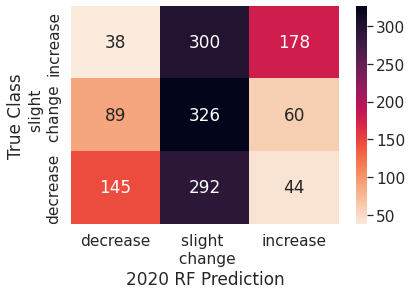

              precision    recall  f1-score   support

    decrease       0.53      0.30      0.39       481
    increase       0.63      0.34      0.45       516
   no_change       0.36      0.69      0.47       475

    accuracy                           0.44      1472
   macro avg       0.51      0.44      0.43      1472
weighted avg       0.51      0.44      0.43      1472



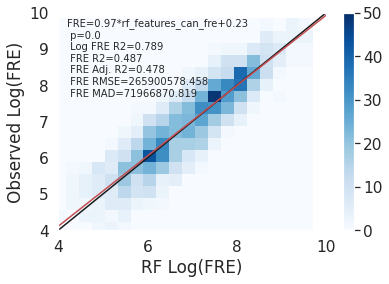

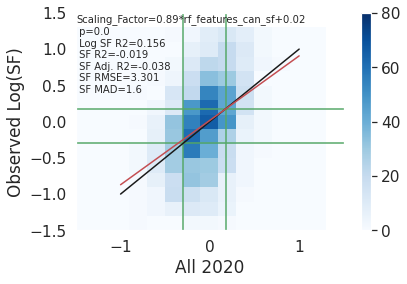

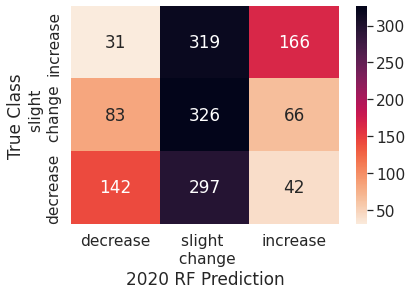

              precision    recall  f1-score   support

    decrease       0.55      0.30      0.39       481
    increase       0.61      0.32      0.42       516
   no_change       0.35      0.69      0.46       475

    accuracy                           0.43      1472
   macro avg       0.50      0.43      0.42      1472
weighted avg       0.51      0.43      0.42      1472



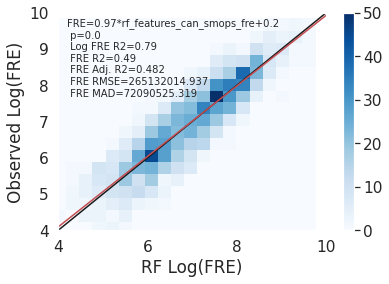

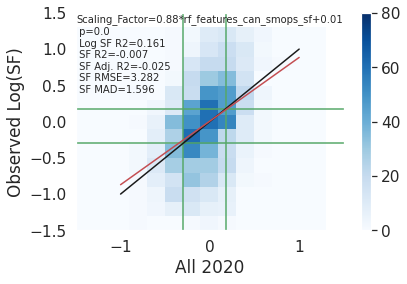

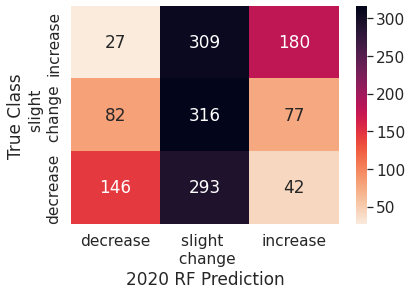

              precision    recall  f1-score   support

    decrease       0.57      0.30      0.40       481
    increase       0.60      0.35      0.44       516
   no_change       0.34      0.67      0.45       475

    accuracy                           0.44      1472
   macro avg       0.51      0.44      0.43      1472
weighted avg       0.51      0.44      0.43      1472



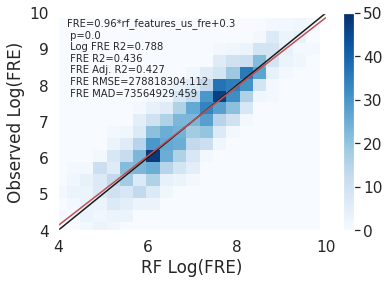

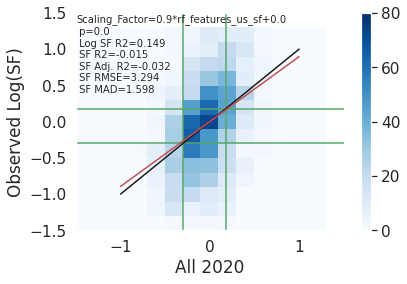

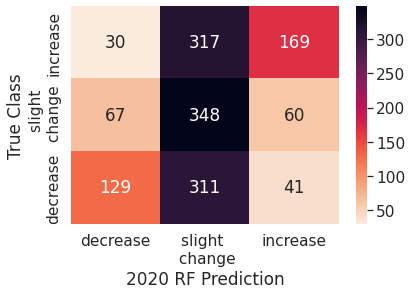

              precision    recall  f1-score   support

    decrease       0.57      0.27      0.36       481
    increase       0.63      0.33      0.43       516
   no_change       0.36      0.73      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.44      0.42      1472



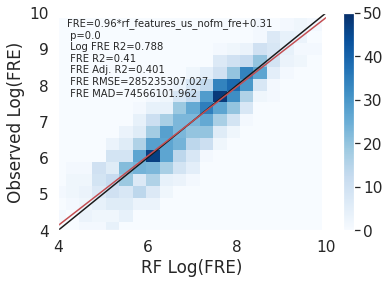

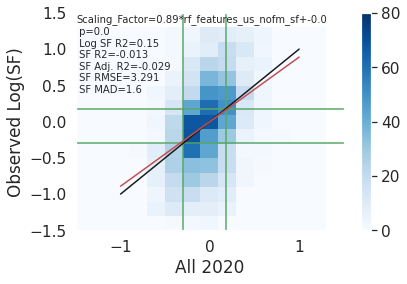

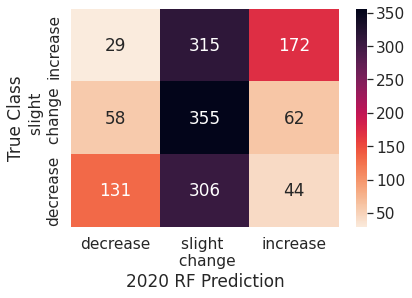

              precision    recall  f1-score   support

    decrease       0.60      0.27      0.37       481
    increase       0.62      0.33      0.43       516
   no_change       0.36      0.75      0.49       475

    accuracy                           0.45      1472
   macro avg       0.53      0.45      0.43      1472
weighted avg       0.53      0.45      0.43      1472



In [53]:
# Plotting
for ii in range(1,len(feature_set_names)):

    frp_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_fre', 'FRE','rf_'+feature_set_names[ii]+'_logfre', 'log_FRE', 'Blues', 0, 50,'RF Log(FRE)',feature_subsets[feature_set_names[ii]])
    
    sf_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_sf', 'Scaling_Factor','rf_'+feature_set_names[ii]+'_logsf', 'Log_Scaling_Factor','Blues',0,80, -.3, .18, 'All 2020',feature_subsets[feature_set_names[ii]])
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+feature_set_names[ii]+'_cat', '2020 RF Prediction')  



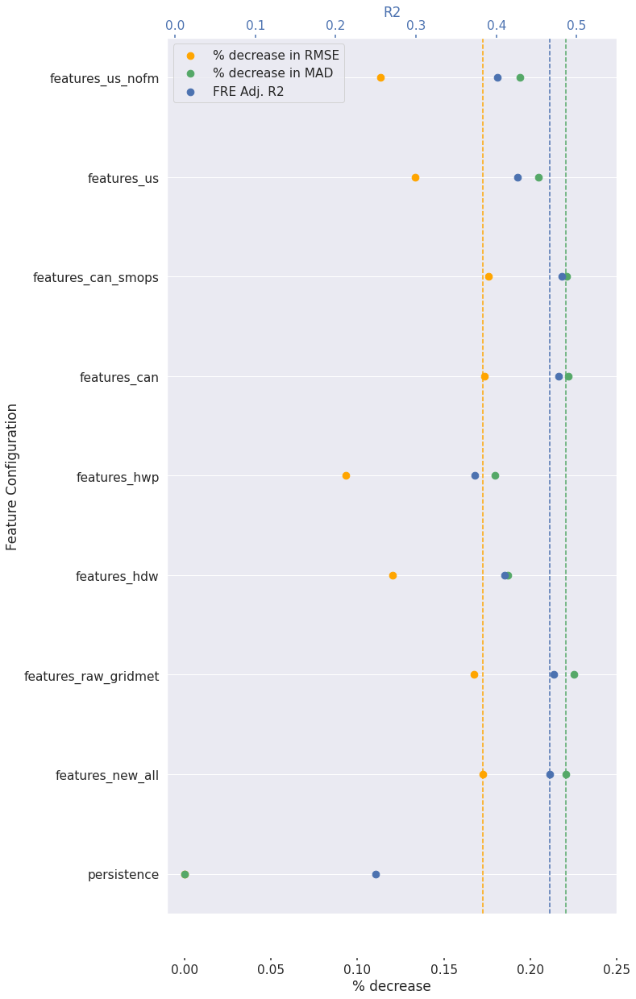

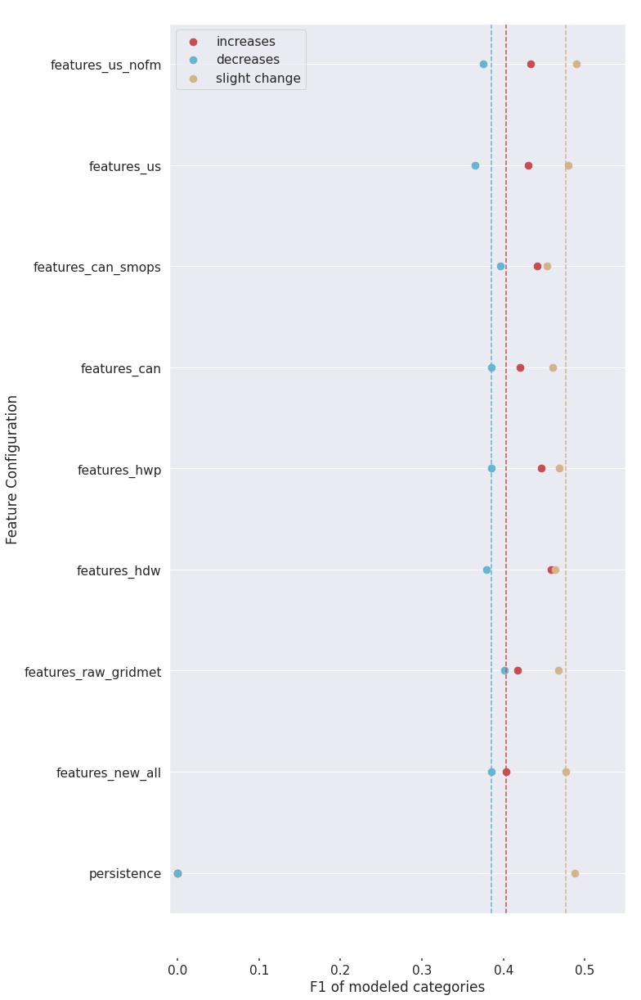

In [54]:
opt_subsets = ['persistence','features_new_all', 'features_raw_gridmet', 'features_hdw','features_hwp',
                     'features_can','features_can_smops','features_us','features_us_nofm']


plot_frp_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all')
plot_f1_sensitivity_metrics(df_error_metrics_rf, opt_subsets,'features_new_all')


features_new_all OOB R2 score is: 0.20762113799237103
features_raw_gridmet OOB R2 score is: 0.22855132162433833
features_hdw OOB R2 score is: 0.17357292570622052
features_can OOB R2 score is: 0.1948828530052854
features_us OOB R2 score is: 0.18738829769282206
DOING PERSISTENCE


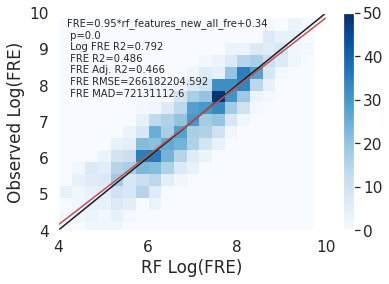

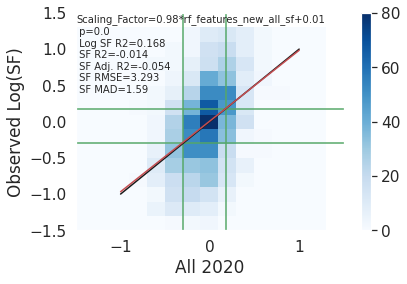

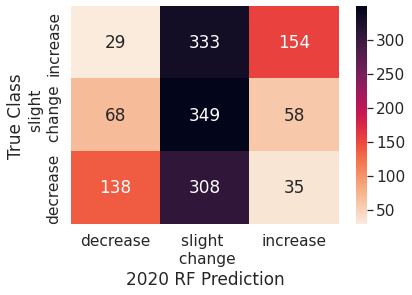

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.39       481
    increase       0.62      0.30      0.40       516
   no_change       0.35      0.73      0.48       475

    accuracy                           0.44      1472
   macro avg       0.52      0.44      0.42      1472
weighted avg       0.52      0.44      0.42      1472



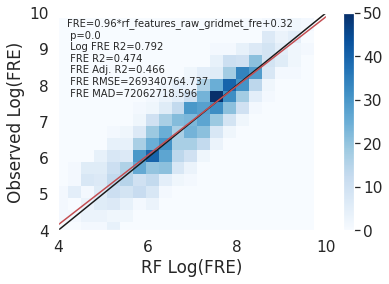

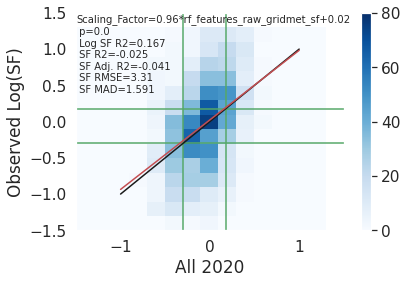

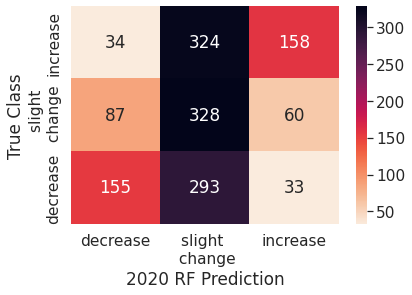

              precision    recall  f1-score   support

    decrease       0.56      0.32      0.41       481
    increase       0.63      0.31      0.41       516
   no_change       0.35      0.69      0.46       475

    accuracy                           0.44      1472
   macro avg       0.51      0.44      0.43      1472
weighted avg       0.52      0.44      0.43      1472



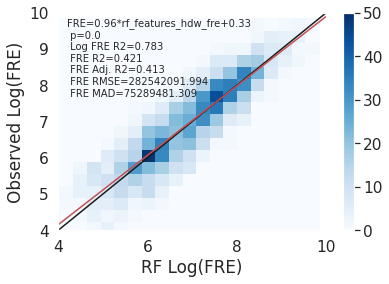

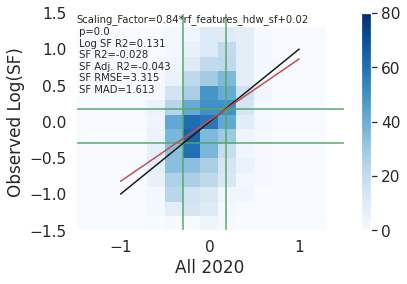

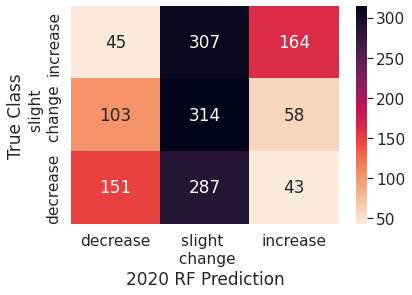

              precision    recall  f1-score   support

    decrease       0.51      0.31      0.39       481
    increase       0.62      0.32      0.42       516
   no_change       0.35      0.66      0.45       475

    accuracy                           0.43      1472
   macro avg       0.49      0.43      0.42      1472
weighted avg       0.49      0.43      0.42      1472



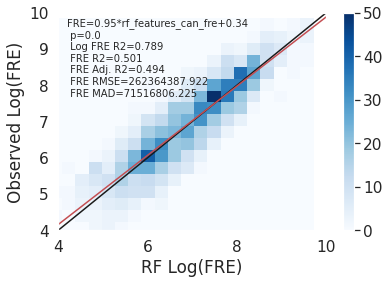

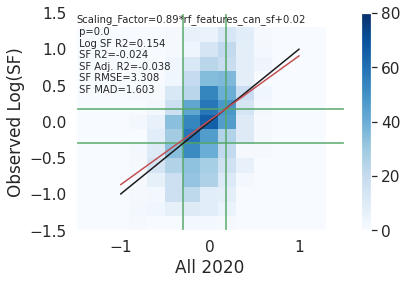

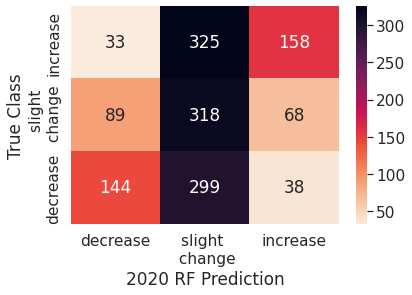

              precision    recall  f1-score   support

    decrease       0.54      0.30      0.39       481
    increase       0.60      0.31      0.41       516
   no_change       0.34      0.67      0.45       475

    accuracy                           0.42      1472
   macro avg       0.49      0.43      0.41      1472
weighted avg       0.50      0.42      0.41      1472



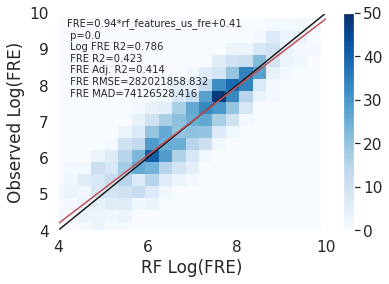

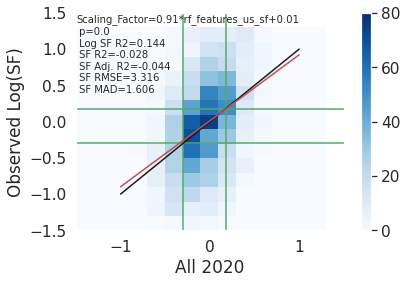

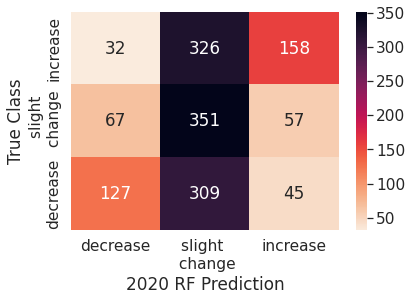

              precision    recall  f1-score   support

    decrease       0.56      0.26      0.36       481
    increase       0.61      0.31      0.41       516
   no_change       0.36      0.74      0.48       475

    accuracy                           0.43      1472
   macro avg       0.51      0.44      0.42      1472
weighted avg       0.51      0.43      0.42      1472



FRE_R2                      object
FRE_R2_adj                  object
FRE_RMSE                    object
FRE_MAD                     object
log_FRE_R2                  object
log_FRE_R2_adj              object
log_FRE_RMSE                object
log_FRE_MAD                 object
SF_R2                       object
SF_R2_adj                   object
SF_RMSE                     object
SF_MAD                      object
log_SF_R2                   object
log_SF_R2_adj               object
log_SF_RMSE                 object
log_SF_MAD                  object
decrease_precision          object
decrease_recall             object
increase_precision          object
increase_recall             object
no_change_precision         object
no_change_recall            object
accuracy                    object
decrease_f1                float64
increase_f1                float64
no_change_f1               float64
percent_change_FRE_RMSE     object
percent_change_FRE_MAD      object
percent_change_SF_RM

In [61]:
df = pd.DataFrame([(.21, .32), (.01, .67), (.66, .036), (.21, .18)],
                  columns=['dogs', 'cats'])
print(df.round(1))

   dogs  cats
0   0.2   0.3
1   0.0   0.7
2   0.7   0.0
3   0.2   0.2


# Old version (shown at Irvine)

In [ ]:
#get the irwinids of the test set
incidents_all = pd.read_csv('unique_fires_with_area_and_irwin_192021.csv')
ac = incidents_all[incidents_all['Fire Name']=='AUGUST COMPLEX']
wf = incidents_all[incidents_all['Fire Name']=='Williams Flats']
dix = incidents_all[incidents_all['Fire Name']=='DIXIE']

test_irwin_ids = [ac['irwinID'].values[0][2:38], wf['irwinID'].values[0][2:38], dix['irwinID'].values[0][2:38]]
print(test_irwin_ids)

#do the train-test split
#test fires
data_test = features_no_outliers_weighted.iloc[np.where(features_no_outliers_weighted.irwinID.str.contains('|'.join(test_irwin_ids)))]
print(len(data_test), np.unique(data_test['year']))

#2020 all fires, including August Complex
data_test_2020 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']>=np.datetime64('2020-01-01 00:00:00'))&
                                              (features_no_outliers_weighted['datetime']<=np.datetime64('2020-12-31 23:00:00'))] #time range
print(len(data_test_2020), np.unique(data_test_2020['year'])) #includes august complex

#2019/2021 Training Set
data_train_1921 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']<np.datetime64('2020-01-01 00:00:00'))|
                                              (features_no_outliers_weighted['datetime']>np.datetime64('2020-12-31 23:00:00'))]
print(len(data_train_1921), np.unique(data_train_1921['year']))
data_train_1921 = data_train_1921.iloc[np.where(~data_train_1921.irwinID.str.contains('|'.join(test_irwin_ids)))] #drop WF and Dixie
print(len(data_train_1921), np.unique(data_train_1921['year']))

In [ ]:
#PERSISTENCE AND SCALED METHODS

scaled_methods = ['dwind_speed_gridmet','dvpd_gridmet','dwind_speed_hrrrmet','dvpd_hrrrmet',
                  'dhwp','dhd0w0','dhd1w0', 'dhd2w0', 'dhd3w0', 'dIMERG.FINAL.v6_FWI','dburning_index_g'] 

scaled_methods_plot =['dvpd_gridmet', 'dvpd_hrrrmet','dhwp','dhd1w0','dIMERG.FINAL.v6_FWI','dburning_index_g']
thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 0.5

data_test_2020['obs_cat'] = pd.cut(data_test_2020['Log_Scaling_Factor'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
data_test_2020['persistence_cat'] = 'no_change'



#do the calculations
for ii in range(len(scaled_methods)):
    print(scaled_methods[ii])
    #make predictions for all of the holdout year (2020)
    data_test_2020[scaled_methods[ii]+'_logsf'] = np.log10(data_test_2020[scaled_methods[ii]])
    data_test_2020[scaled_methods[ii]+'_sf'] = data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_logfrp'] = np.log10(data_test_2020[scaled_methods[ii]+'_frp'])
    data_test_2020[scaled_methods[ii]+'_cat'] = pd.cut(data_test_2020[scaled_methods[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
print(data_test_2020.columns.values)    
#do the plottint
#drop the nans, these will show up in the scaled methods
data_test_2020.replace([np.inf, -np.inf], np.nan, inplace=True)
print(len(data_test_2020))
data_test_2020=data_test_2020.dropna(how='any')
print(len(data_test_2020))

#persistence
frp_hist2d(data_test_2020, 'FRP_MEAN_1', 'FRP_MEAN','log_FRP_MEAN_1', 'log_FRP_MEAN', 'Blues', 0, 50,'Persistence Log(FRP)')
plot_2dhist_withfit(data_test_2020, 'Scaling_Factor_Persistence', 'Scaling_Factor',
                    'Log_Scaling_Factor_Persistence', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
plot_category_heatmap(data_test_2020, 'obs_cat', 'persistence_cat', '2020 RF Prediction') 



for ii in range(len(scaled_methods_plot)):

    #all of 2020, trained on all features 19/21
    frp_hist2d(data_test_2020, scaled_methods_plot[ii]+'_frp', 'FRP_MEAN',scaled_methods_plot[ii]+'_logfrp', 'log_FRP_MEAN', 'Blues', 0, 50,scaled_methods_plot[ii]+' Log(FRP)')
    plot_2dhist_withfit(data_test_2020, scaled_methods_plot[ii]+'_sf', 'Scaling_Factor',scaled_methods_plot[ii]+'_logsf', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
    plot_category_heatmap(data_test_2020, 'obs_cat', scaled_methods_plot[ii]+'_cat', '2020 RF Prediction')  


In [ ]:
with open('features_drop.txt') as f:
    data = f.read()

print("Data type before reconstruction : ", type(data))
# reconstructing the data as a dictionary
feature_subsets = json.loads(data)
  
print("Data type after reconstruction : ", type(feature_subsets))


In [ ]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_no_pop', 'features_no_stability', 'features_pft','features_chi']



df_error_metrics = pd.DataFrame(index=feature_set_names, 
                                columns=['LOG_FRP_R2', 'FRP_R2', 'FRP_RMSE', 'FRP_MAD',
                                         'LOG_SF_R2', 'SF_R2', 'SF_RMSE', 'SF_MAD',
                                        'decrease_precision', 'decrease_recall', 'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])

#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfrp'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_frp'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'FRP_MEAN_1', 'log_FRP_MEAN_1')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'persistence', 'log_persistence')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'rf_'+feature_set_names[ii]+'_frp', 'rf_'+feature_set_names[ii]+'_logfrp')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf', 'rf_'+feature_set_names[ii]+'_logsf')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_FRP_R2'] = errors[0]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_R2'] = errors[1]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_RMSE'] = errors[2]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_MAD'] = errors[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_SF_R2'] = errors_sf[0]
    df_error_metrics.loc[feature_set_names[ii], 'SF_R2'] = errors_sf[1]
    df_error_metrics.loc[feature_set_names[ii], 'SF_RMSE'] = errors_sf[2]
    df_error_metrics.loc[feature_set_names[ii], 'SF_MAD'] = errors_sf[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']

#persistence

df_error_metrics['percent_change_FRP_RMSE'] = (df_error_metrics.loc['persistence','FRP_RMSE']-df_error_metrics['FRP_RMSE'])/df_error_metrics.loc['persistence','FRP_RMSE']
df_error_metrics['percent_change_FRP_MAD'] = (df_error_metrics.loc['persistence','FRP_MAD']-df_error_metrics['FRP_MAD'])/df_error_metrics.loc['persistence','FRP_MAD']


df_error_metrics['percent_change_SF_RMSE'] = (df_error_metrics.loc['persistence','SF_RMSE']-df_error_metrics['SF_RMSE'])/df_error_metrics.loc['persistence','SF_RMSE']
df_error_metrics['percent_change_SF_MAD'] = (df_error_metrics.loc['persistence','SF_MAD']-df_error_metrics['SF_MAD'])/df_error_metrics.loc['persistence','SF_MAD']

    

In [ ]:
stability_sensitivity = ['features_no_pop','features_no_stability','features_pft', 'features_chi']

plot_frp_sensitivity_metrics(df_error_metrics, stability_sensitivity)

In [ ]:
# Plotting
for ii in range(len(stability_sensitivity)):

    frp_hist2d(data_test_2020, 'rf_'+stability_sensitivity[ii]+'_frp', 'FRP_MEAN','rf_'+stability_sensitivity[ii]+'_logfrp', 'log_FRP_MEAN', 'Blues', 0, 50,'RF Log(FRP)')
    plot_2dhist_withfit(data_test_2020, 'rf_'+stability_sensitivity[ii]+'_sf', 'Scaling_Factor','rf_'+stability_sensitivity[ii]+'_logsf', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+stability_sensitivity[ii]+'_cat', '2020 RF Prediction')  


    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['FRP_MEAN_1']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['FRP_MEAN_1']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    
    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['rf_'+stability_sensitivity[ii]+'_frp']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['rf_'+stability_sensitivity[ii]+'_frp']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    
    